<h1>Heart Disease Prediction</h1>
<h4>Sabanci University CS210 Introduction to Data Science Course Project | Spring 2022</h4>

Group Members:

<ul>
<li>Aslıhan Berber - 29203</li>
<li>Berke Ceylan - 27895</li>
<li>Mehmet Arda Müftüoğlu - 29547</li>
<li>Yunus Topçu - 28880</li>
</ul>

## Introduction



  The project starts its Exploratory Data Analysis by introducing the primary dataset, of which the content is explained in detail below. Combining various useful attributes from the dataset, analyses and visualisations are conducted in line with the projects current objective of finding meaningful connections between these elements. 

  To derive such connections, attributes are analysed with respect to the final state disease both exclusively and in groups. In the exclusive analyses, relations to age and sex are analysed specifically and the groups are later used to point out direct joint causations. Apart from the final state disease, chest pain – as one of the crucial primary physical symptoms – is analysed and visualised to further aid the central goal of reducing the number of indicators in logical and effective ways.

  Therefore the foundation of the project is laid out in the following sections, attempting to point out the most significant attributes through the common visualisation results and to exclude the relatively dismissible ones from the list of “most prominent indicators” so that a more approachable early diagnosis process can be formed.

## Utilized Datasets


Datasets [1] & [2] have been used in the Exploratory Data Analysis.


Dataset [1] has been used primarily in all parts of the Exploratory Data Analysis. It has shown to be sufficient to initiate the analysis, since both the numeric and categorical attributes provided a number of parameters that are relatively easy to trace and understand. Such instances are pointed out in the visualisations below.

Dataset [2] introduces a number of symptoms that are shared between various diseases. In the Exploratory Data Analysis, these have been analysed so that the statistical tests can show the most apparent symptoms of heart diseases while eliminating the ones that could be mistaken for other diseases.



[1] https://www.kaggle.com/datasets/meetnagadia/heart-disease

[2] https://www.kaggle.com/datasets/itachi9604/disease-symptom-description-dataset




# Part 1 - Exploratory Data Analysis


<h3> Data Preprocessing </h3>

In [2]:
!pip install seaborn

     -------------------------------------- 288.2/288.2 kB 3.0 MB/s eta 0:00:00


In [4]:
!pip install plotly

     --------------------------------------- 15.3/15.3 MB 10.6 MB/s eta 0:00:00


In [6]:
!pip install pydotplus

     -------------------------------------- 278.7/278.7 kB 3.4 MB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Created wheel for pydotplus: filename=pydotplus-2.0.2-py3-none-any.whl size=24575 sha256=28384079333aa3c8de85465057b6cccbcabc0fd4d1c3b65b5e197a0b2a8f1b25
  Stored in directory: c:\users\toand\appdata\local\pip\cache\wheels\89\e5\de\6966007cf223872eedfbebbe0e074534e72e9128c8fd4b55eb
Successfully built pydotplus


In [7]:
# Importing the necessary libraries
import pandas as pd
import numpy as np
from os.path import join
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from matplotlib import cm
%matplotlib inline
from sklearn.preprocessing import OneHotEncoder
import os
import plotly.express as px
import statistics as sts

from sklearn import tree
import pydotplus
from sklearn.tree import DecisionTreeClassifier

In [ ]:
# Mounting the dataset(s) 
# from google.colab import drive
# drive.mount("./drive", force_remount=True)
# #Berke
# path_prefix = "./drive/MyDrive/ColabNotebooks/CS210/Heart-Disease-Proj/Data-Sets"
# #Arda
# #path_prefix = "./drive/My Drive/Heart-Disease-Proj/Data-Sets/"
# #Aslı
# #path_prefix = "./drive/MyDrive/Heart-Disease-Proj/Data-Sets"
# #Yunus
# #path_prefix = "./drive/MyDrive/Data-Sets"

fname = "DataSet-5-Main.csv"

df = pd.read_csv(join(path_prefix, fname))

Mounted at ./drive


In [ ]:
#Data Clearing & Missing Value Treatment
#As the missing values are less than 2%, deletion has been selected the the ideal option.
df.info()

<class 'pandas.core.frame.DataFrame'>

Int64Index: 303 entries, 1 to 303

Data columns (total 14 columns):

 #   Column     Non-Null Count  Dtype  

---  ------     --------------  -----  

 0   Age        303 non-null    int64  

 1   Sex        303 non-null    int64  

 2   ChestPain  303 non-null    object 

 3   RestBP     303 non-null    int64  

 4   Chol       303 non-null    int64  

 5   Fbs        303 non-null    int64  

 6   RestECG    303 non-null    int64  

 7   MaxHR      303 non-null    int64  

 8   ExAng      303 non-null    int64  

 9   Oldpeak    303 non-null    float64

 10  Slope      303 non-null    int64  

 11  Ca         299 non-null    float64

 12  Thal       301 non-null    object 

 13  AHD        303 non-null    object 

dtypes: float64(2), int64(9), object(3)

memory usage: 35.5+ KB


In [ ]:
df.isnull().sum() 

Age          0
Sex          0
ChestPain    0
RestBP       0
Chol         0
Fbs          0
RestECG      0
MaxHR        0
ExAng        0
Oldpeak      0
Slope        0
Ca           4
Thal         2
AHD          0
dtype: int64

There are missing values in columns Ca and Thal.

In [ ]:
df.dropna(axis='index', subset=['Ca', 'Thal'], inplace=True)
df.info()
print("\nMissing values in column Ca:", df['Ca'].isnull().sum())
print("Missing values in column Thal:",df['Thal'].isnull().sum())

<class 'pandas.core.frame.DataFrame'>

Int64Index: 297 entries, 1 to 302

Data columns (total 14 columns):

 #   Column     Non-Null Count  Dtype  

---  ------     --------------  -----  

 0   Age        297 non-null    int64  

 1   Sex        297 non-null    int64  

 2   ChestPain  297 non-null    object 

 3   RestBP     297 non-null    int64  

 4   Chol       297 non-null    int64  

 5   Fbs        297 non-null    int64  

 6   RestECG    297 non-null    int64  

 7   MaxHR      297 non-null    int64  

 8   ExAng      297 non-null    int64  

 9   Oldpeak    297 non-null    float64

 10  Slope      297 non-null    int64  

 11  Ca         297 non-null    float64

 12  Thal       297 non-null    object 

 13  AHD        297 non-null    object 

dtypes: float64(2), int64(9), object(3)

memory usage: 34.8+ KB



Missing values in column Ca: 0

Missing values in column Thal: 0


Rows with missing values are deleted.

In [ ]:
# Missing values are confirmed to be removed as the Non-Null Counts are the same.
# Each attribute can also be viewed alongside its datatype.
df.info()
df.describe()

<class 'pandas.core.frame.DataFrame'>

Int64Index: 297 entries, 1 to 302

Data columns (total 14 columns):

 #   Column     Non-Null Count  Dtype  

---  ------     --------------  -----  

 0   Age        297 non-null    int64  

 1   Sex        297 non-null    int64  

 2   ChestPain  297 non-null    object 

 3   RestBP     297 non-null    int64  

 4   Chol       297 non-null    int64  

 5   Fbs        297 non-null    int64  

 6   RestECG    297 non-null    int64  

 7   MaxHR      297 non-null    int64  

 8   ExAng      297 non-null    int64  

 9   Oldpeak    297 non-null    float64

 10  Slope      297 non-null    int64  

 11  Ca         297 non-null    float64

 12  Thal       297 non-null    object 

 13  AHD        297 non-null    object 

dtypes: float64(2), int64(9), object(3)

memory usage: 34.8+ KB


,Age,Sex,RestBP,Chol,Fbs,RestECG,MaxHR,ExAng,Oldpeak,Slope,Ca
count,297.000000,297.000000,297.000000,297.000000,297.000000,297.000000,297.000000,297.000000,297.000000,297.000000,297.000000
mean,54.542088,0.676768,131.693603,247.350168,0.144781,0.996633,149.599327,0.326599,1.055556,1.602694,0.676768
std,9.049736,0.468500,17.762806,51.997583,0.352474,0.994914,22.941562,0.469761,1.166123,0.618187,0.938965
min,29.000000,0.000000,94.000000,126.000000,0.000000,0.000000,71.000000,0.000000,0.000000,1.000000,0.000000
25%,48.000000,0.000000,120.000000,211.000000,0.000000,0.000000,133.000000,0.000000,0.000000,1.000000,0.000000
50%,56.000000,1.000000,130.000000,243.000000,0.000000,1.000000,153.000000,0.000000,0.800000,2.000000,0.000000
75%,61.000000,1.000000,140.000000,276.000000,0.000000,2.000000,166.000000,1.000000,1.600000,2.000000,1.000000
max,77.000000,1.000000,200.000000,564.000000,1.000000,2.000000,202.000000,1.000000,6.200000,3.000000,3.000000


To see the correlation between variables, a heat map has been chosen. AHD values are converted to 0 and 1 while the Sex, ChestPain, and Thal columns are excluded.

<class 'pandas.core.frame.DataFrame'>

Int64Index: 297 entries, 1 to 302

Data columns (total 11 columns):

 #   Column   Non-Null Count  Dtype  

---  ------   --------------  -----  

 0   Age      297 non-null    int64  

 1   RestBP   297 non-null    int64  

 2   Chol     297 non-null    int64  

 3   Fbs      297 non-null    int64  

 4   RestECG  297 non-null    int64  

 5   MaxHR    297 non-null    int64  

 6   ExAng    297 non-null    int64  

 7   Oldpeak  297 non-null    float64

 8   Slope    297 non-null    int64  

 9   Ca       297 non-null    float64

 10  AHD      297 non-null    int64  

dtypes: float64(2), int64(9)

memory usage: 27.8 KB


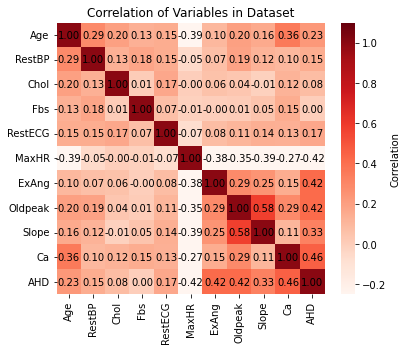

In [ ]:
# Heatmap for showing correlation between variables in the dataset
diseaseCorr = df.loc[:, ~df.columns.isin(['Sex', 'ChestPain', 'Thal'])].copy()
diseaseCorr['AHD'].replace(['No','Yes'],[0,1],inplace=True)
diseaseCorr = diseaseCorr.astype({'AHD': 'int'})
diseaseCorr.info()

correlation = diseaseCorr.corr()
correlation = correlation.round(decimals= 2)
fig = plt.figure(figsize=(6,5))
plt.title('Correlation of Variables in Dataset')
heatmap = sns.heatmap(correlation, cmap='Reds', annot= True, vmin=-0.25, vmax=1.1, fmt= '.2f', cbar_kws={'label': 'Correlation'}, annot_kws={'color': 'black'})

In [ ]:
# The sex distribution is also visualised after the correlation data.
s=df.Sex.value_counts()
name = ["Male","Female"]
fig = px.pie(df, values=s.values ,names=name,  color_discrete_sequence=px.colors.sequential.RdBu)
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

Output below is uploaded as a screenshot as Plotly presented loading issues on Kaggle.

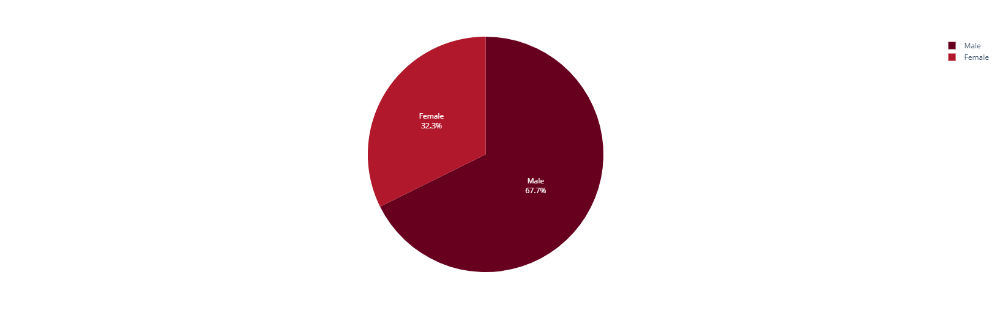

## Part 1.1 - Visualisations for Dataset 1

<h3>Visualisation of each attribute with respect to AHD</h3>
```
- This chapters aim is to compare every attribute seperately before the grouped comparisons.

- Direct correlations can be observed below, which make the groupings more reasonable.
```


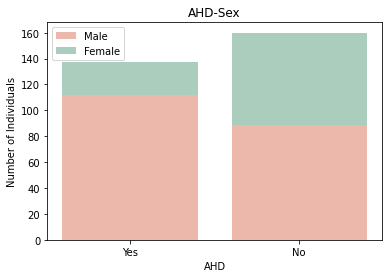

In [ ]:
# Graph showing Sex with respect to AHD
df['AHD'].replace("Yes", 1, inplace=True)
df['AHD'].replace("No", 0, inplace=True)

ahd0 = df[df['AHD'] == 0]
ahd1 = df[df['AHD'] == 1]

x = ['Yes', 'No']
male = [len(list(ahd1[ahd1['Sex'] == 1]['Sex'])), len(list(ahd0[ahd0['Sex'] == 1]['Sex']))]
female = [len(list(ahd1[ahd1['Sex'] == 0]['Sex'])), len(list(ahd0[ahd0['Sex'] == 0]['Sex']))]

plt.bar(x, male, color='#ECB8AC')
plt.bar(x, female, bottom=male, color='#AACDBE')
plt.xlabel("AHD")
plt.ylabel("Number of Individuals")
plt.legend(["Male", "Female"])
plt.title("AHD-Sex")
plt.show()

/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3208: VisibleDeprecationWarning:



Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.



/usr/local/lib/python3.7/dist-packages/matplotlib/cbook/__init__.py:1376: VisibleDeprecationWarning:



Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.




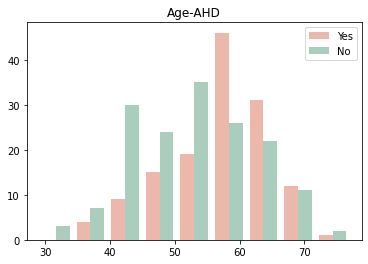

In [ ]:
# Graph showing Age with respect to AHD
bins = np.linspace(df['Age'].nsmallest(n=1).sum(), df['Age'].max(), 10)
x = df[df['AHD'] == 1]['Age']
y = df[df['AHD'] == 0]['Age']

plt.hist([x, y], bins, label=['Yes', 'No'], color = ["#ECB8AC", "#AACDBE"])
plt.legend(loc='upper right')
plt.title('Age-AHD')
plt.show()

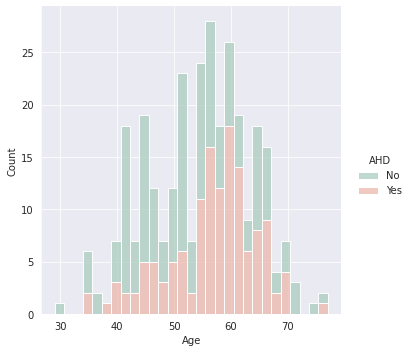

In [ ]:
# Graph showing Age with respect to AHD
df['AHD'].replace([0,1],['No','Yes'],inplace=True)
sns.set_style("darkgrid")

bin_size = np.linspace(df['Age'].nsmallest(n=1).sum(), df['Age'].max(), 30)
sns.displot(data=df, bins = bin_size, x="Age", hue="AHD", multiple="stack", palette = ["#AACDBE", "#ECB8AC"])


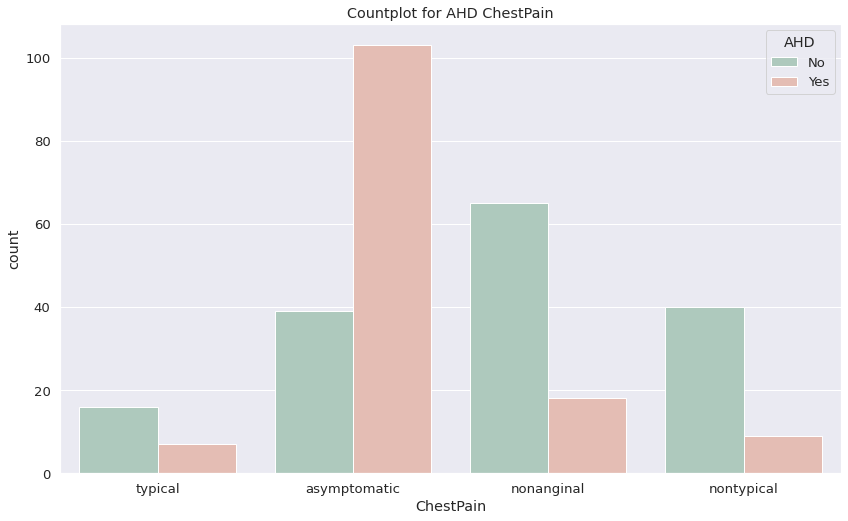

In [ ]:
# Graph showing Chest Pain with respect to AHD
df['AHD'].replace([0,1],['No','Yes'],inplace=True)
def distribution_categorical_features(data, feature, target, colors) :
    sns.set(rc={'figure.figsize':(14,8.27)},font_scale=1.2)
    grouped_columns = sns.countplot(x=feature, hue=target, data=data,palette=colors)
    grouped_columns.set_title('Countplot for {} {}'.format(target, feature))
distribution_categorical_features(df, "ChestPain", "AHD", ["#AACDBE","#ECB8AC"])

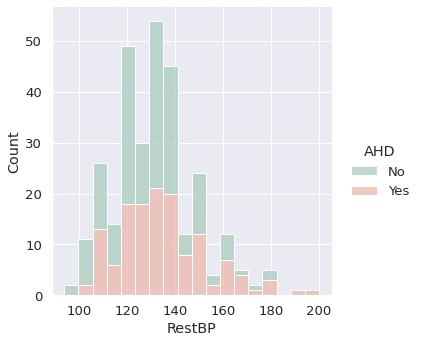

In [ ]:
# Graph showing RestBP with respect to AHD
df['AHD'].replace([0,1],['No','Yes'],inplace=True)
sns.displot(data=df, x="RestBP", hue="AHD", multiple="stack", palette = ["#AACDBE", "#ECB8AC"])

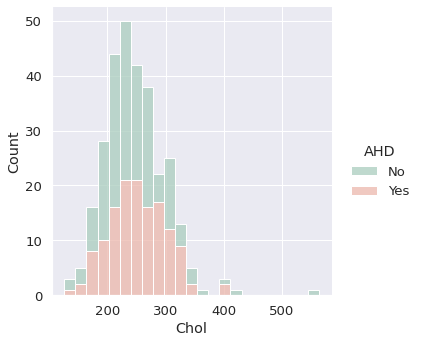

In [ ]:
# Graph showing Cholesterol with respect to AHD
df['AHD'].replace([0,1],['No','Yes'],inplace=True)
sns.displot(data=df, x="Chol", hue="AHD", multiple="stack", palette = ["#AACDBE", "#ECB8AC"])

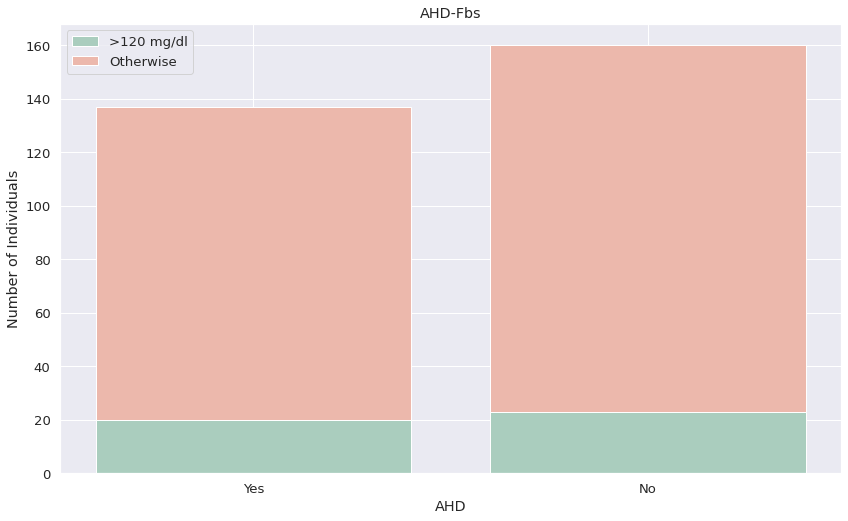

In [ ]:
# Graph showing Fasting Blood Sugar with respect to AHD
df['AHD'].replace("Yes", 1, inplace=True)
df['AHD'].replace("No", 0, inplace=True)

ahd0 = df[df['AHD'] == 0]
ahd1 = df[df['AHD'] == 1]

x = ['Yes', 'No']
fibsHigher120 = [len(list(ahd1[ahd1['Fbs'] == 1]['Fbs'])), len(list(ahd0[ahd0['Fbs'] == 1]['Fbs']))]
other = [len(list(ahd1[ahd1['Fbs'] == 0]['Fbs'])), len(list(ahd0[ahd0['Fbs'] == 0]['Fbs']))]

plt.bar(x, fibsHigher120, color='#AACDBE')
plt.bar(x, other, bottom=fibsHigher120, color='#ECB8AC')
plt.xlabel("AHD")
plt.ylabel("Number of Individuals")
plt.legend([">120 mg/dl", "Otherwise"])
plt.title("AHD-Fbs")
plt.show()

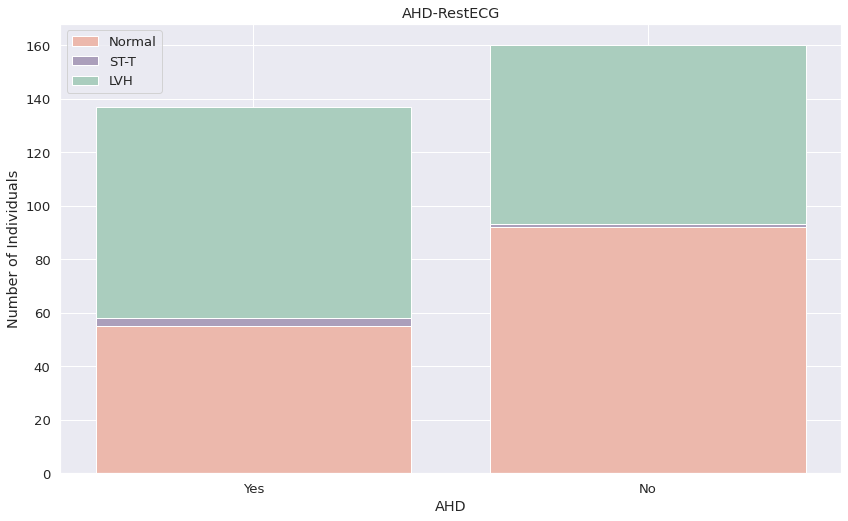

In [ ]:
# Graph showing Resting ECG with respect to AHD

df['AHD'].replace("Yes", 1, inplace=True)
df['AHD'].replace("No", 0, inplace=True)

ahd0 = df[df['AHD'] == 0]
ahd1 = df[df['AHD'] == 1]

x = ['Yes', 'No']
normal = np.array([len(list(ahd1[ahd1['RestECG'] == 0]['RestECG'])), len(list(ahd0[ahd0['RestECG'] == 0]['RestECG']))])
STT = np.array([len(list(ahd1[ahd1['RestECG'] == 1]['RestECG'])), len(list(ahd0[ahd0['RestECG'] == 1]['RestECG']))])
LVH = np.array([len(list(ahd1[ahd1['RestECG'] == 2]['RestECG'])), len(list(ahd0[ahd0['RestECG'] == 2]['RestECG']))])

plt.bar(x, normal, color='#ECB8AC')
plt.bar(x, STT, bottom=normal, color='#AB9FBB')
plt.bar(x, LVH, bottom=normal+STT, color='#AACDBE')
plt.xlabel("AHD")
plt.ylabel("Number of Individuals")
plt.legend(["Normal", "ST-T", "LVH"])
plt.title("AHD-RestECG")
plt.show()

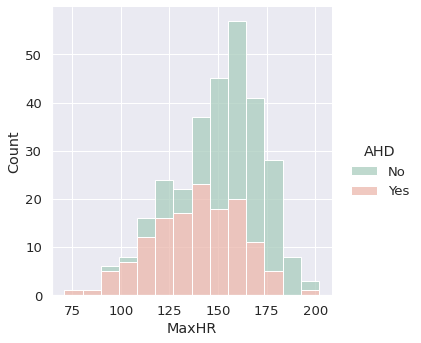

In [ ]:
# Graph showing Maximum HR with respect to AHD
df['AHD'].replace([0,1],['No','Yes'],inplace=True)
sns.displot(data=df, x="MaxHR", hue="AHD", multiple="stack", palette = ["#AACDBE", "#ECB8AC"])

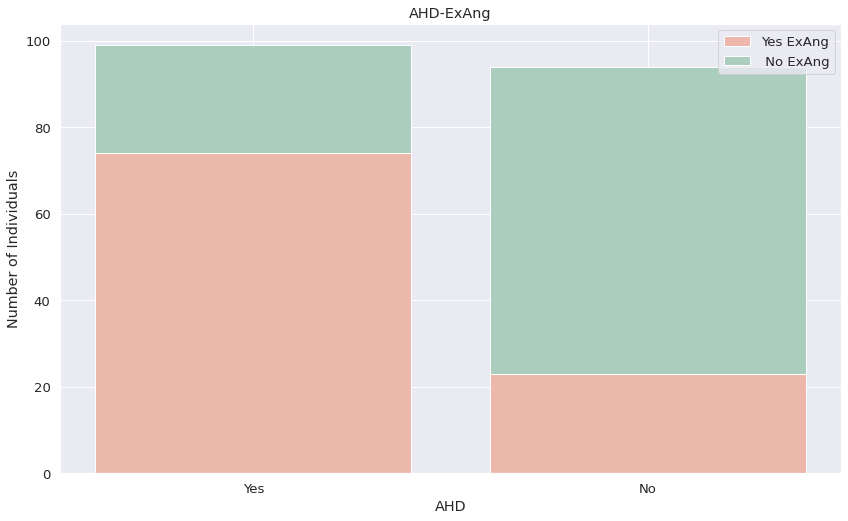

In [ ]:
# Graph showing Exercise Induced Angina with respect to AHD
df['AHD'].replace("Yes", 1, inplace=True)
df['AHD'].replace("No", 0, inplace=True)

ahd0 = df[df['AHD'] == 0]
ahd1 = df[df['AHD'] == 1]

x = ['Yes', 'No']
yesAng = [len(list(ahd1[ahd1['ExAng'] == 1]['ExAng'])), len(list(ahd0[ahd0['ExAng'] == 1]['ExAng']))]
noAng = [len(list(ahd1[ahd1['ExAng'] == 0]['ExAng'])), len(list(ahd0[ahd0['ExAng'] == 0]['ExAng']))]

plt.bar(x, yesAng, color='#ECB8AC')
plt.bar(x, female, bottom=yesAng, color='#AACDBE')
plt.xlabel("AHD")
plt.ylabel("Number of Individuals")
plt.legend(["Yes ExAng", " No ExAng"])
plt.title("AHD-ExAng")
plt.show()

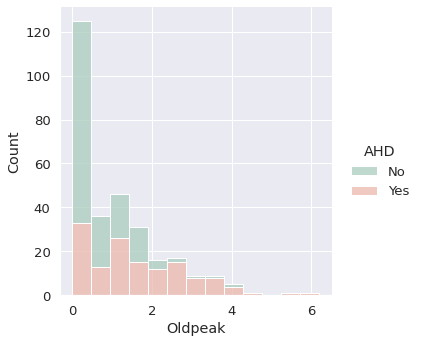

In [ ]:
#Graph showing Oldpeak (ST depression induced by exercise relative to rest) with respect to AHD
df['AHD'].replace([0,1],['No','Yes'],inplace=True)
sns.displot(data=df, x="Oldpeak", hue="AHD", multiple="stack", palette = ["#AACDBE", "#ECB8AC"])

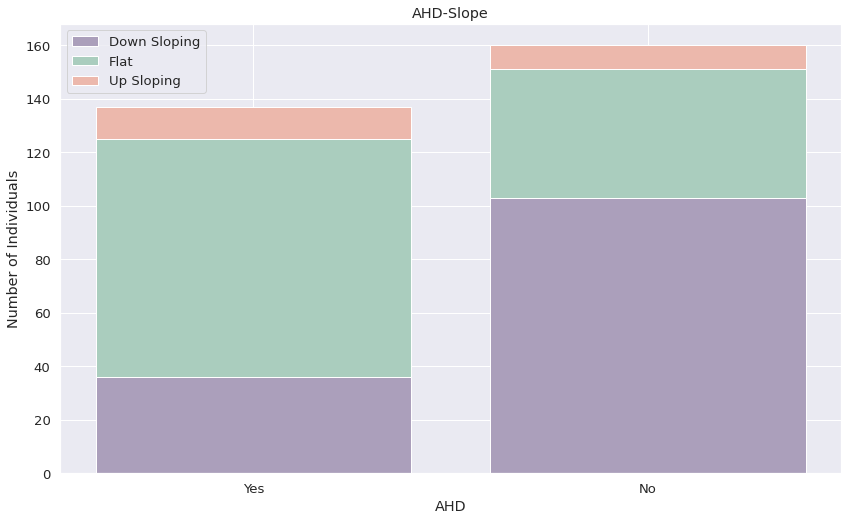

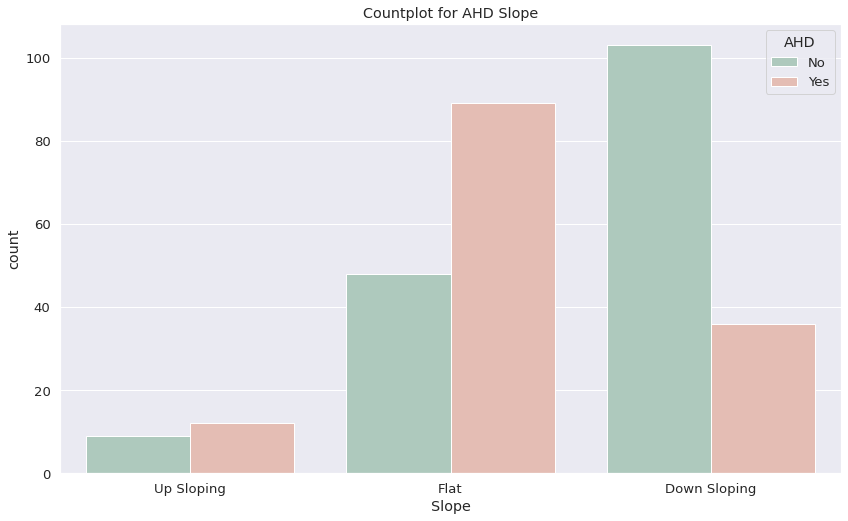

In [ ]:
# Graph showing slope with respect to AHD, two graphs are utilized with different visulisations.

#First Graph
df['Slope'].replace(['Down Sloping','Flat','Up Sloping'],[1,2,3],inplace=True)
df['AHD'].replace("Yes", 1, inplace=True)
df['AHD'].replace("No", 0, inplace=True)

ahd0 = df[df['AHD'] == 0]
ahd1 = df[df['AHD'] == 1]

x = ['Yes', 'No']
up = np.array([len(list(ahd1[ahd1['Slope'] == 1]['Slope'])), len(list(ahd0[ahd0['Slope'] == 1]['Slope']))])
flat = np.array([len(list(ahd1[ahd1['Slope'] == 2]['Slope'])), len(list(ahd0[ahd0['Slope'] == 2]['Slope']))])
down = np.array([len(list(ahd1[ahd1['Slope'] == 3]['Slope'])), len(list(ahd0[ahd0['Slope'] == 3]['Slope']))])

plt.bar(x, up, color='#AB9FBB')
plt.bar(x, flat, bottom=up, color='#AACDBE')
plt.bar(x, down, bottom=up+flat, color='#ECB8AC')
plt.xlabel("AHD")
plt.ylabel("Number of Individuals")
plt.legend(["Down Sloping","Flat", "Up Sloping"])
plt.title("AHD-Slope")
plt.show()

#Second Graph
df['AHD'].replace([0,1],['No','Yes'],inplace=True)
df['Slope'].replace([1,2,3],['Down Sloping','Flat','Up Sloping'],inplace=True)
def distribution_categorical_features(data, feature, target, colors) :
    sns.set(rc={'figure.figsize':(14,8.27)},font_scale=1.2)
    grouped_columns = sns.countplot(x=feature, hue=target, data=data,palette=colors)
    grouped_columns.set_title('Countplot for {} {}'.format(target, feature))

distribution_categorical_features(df, "Slope", "AHD", ["#AACDBE","#ECB8AC"])

In [ ]:
# Graph showing Ca (number of major vessels (0-3) colored by fluoroscopy) with respect to AHD.
df['Ca'].replace([0,1,2,3],['0 Major Vessel','1 Major Vessel','2 Major Vessel','3 Major Vessel'],inplace=True)
s=df.Ca.value_counts()
fig = px.pie(df, values=s.values ,names=s.index, color_discrete_sequence=px.colors.sequential.RdBu)
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

Output below is uploaded as a screenshot as Plotly presented loading issues on Kaggle.

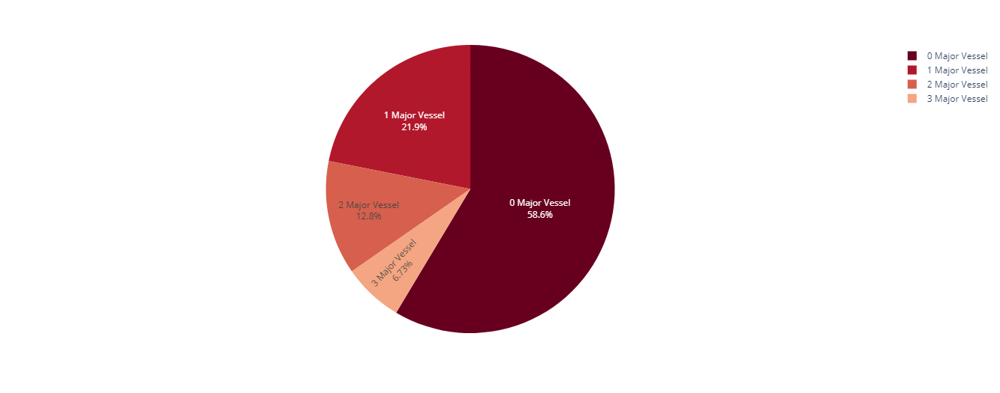

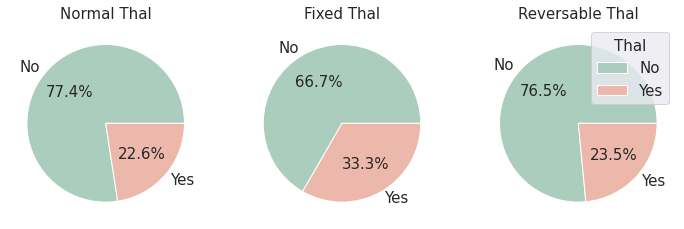

In [ ]:
# Pie charts showing Thalassemia with respect to AHD.

df['AHD'] = df['AHD'].astype('category')
df['AHD'] = df['AHD'].cat.rename_categories({1: 'Yes', 0: 'No'})
def pie_charts(data, feature, target):
    colors = ["#AACDBE", "#ECB8AC"]
    fig,axes = plt.subplots(1,3,figsize=(12,8))
    labels = df[feature].unique()
    textprops = {"fontsize":15}

    axes[0].pie(df[df[target]=='normal'][feature].value_counts(),colors=colors, labels=labels,autopct='%1.1f%%',textprops =textprops)
    axes[0].set_title('Normal {}'.format(target),fontsize=15)
    axes[1].pie(df[df[target]== 'fixed'][feature].value_counts(),colors=colors, labels=labels,autopct='%1.1f%%',textprops =textprops)
    axes[1].set_title('Fixed {}'.format(target),fontsize=15)
    axes[2].pie(df[df[target]== 'reversable'][feature].value_counts(),colors=colors, labels=labels,autopct='%1.1f%%',textprops =textprops)
    axes[2].set_title('Reversable {}'.format(target),fontsize=15)

    plt.legend(title = "Thal", fontsize=15, title_fontsize=15)
    plt.show()

pie_charts(df,"AHD","Thal")

<h3>Visualisations of the relationship between some selected attributes and the final disease state (AHD)</h3>

1. ChestPain-Age-AHD-Sex 
2. Fibs-Age-AHD-Sex
3. RestECG-Age-AHD-Sex
4. ExAng-Age-AHD-Sex
5. Thal-Age-AHD-Sex
6. Ca-Age-AHD-Sex

These are the grouped attributes. They have been selected from the dataset with matching datatypes so that comparisons by the statistical tests between them will yield logical results. 


1. ChestPain-Age-AHD-Sex Comparison Graphs

In [ ]:
#ChestPain-Age --> Main Function
def chestAge(ahd, sex, df):
  df['AHD'].replace("Yes", 1, inplace=True)
  df['AHD'].replace("No", 0, inplace=True)

  newDf = df[df['AHD'] == ahd ][df['Sex'] == sex]
  if(ahd == 1):
    ahdName = "YES"
  elif(ahd == 0):
    ahdName = "NO"
  if(sex == 1):
    sexName = "MAN"
  elif(sex == 0):
    sexName = "WOMAN"
                      
  x = ['0-20','20-40','40-60','60-80']
  newDf['ChestPain'].replace(['typical','nontypical','nonanginal','asymptomatic'],[1,2,3,4],inplace=True)

  low = newDf[newDf['Age'] <= 20][newDf['Age'] >= 0]
  mid1 = newDf[newDf['Age'] <= 40][newDf['Age'] > 20]
  mid2 = newDf[newDf['Age'] <= 60][newDf['Age'] > 40]
  high = newDf[newDf['Age'] <= 80][newDf['Age'] > 60]

  
  typical = np.array([len(list(low[low['ChestPain'] == 1]['ChestPain'])), len(list(mid1[mid1['ChestPain'] == 1]['ChestPain'])),len(list(mid2[mid2['ChestPain'] == 1]['ChestPain'])),len(list(high[high['ChestPain'] == 1]['ChestPain']))])
  nontypical = np.array([len(list(low[low['ChestPain'] == 2]['ChestPain'])), len(list(mid1[mid1['ChestPain'] == 2]['ChestPain'])),len(list(mid2[mid2['ChestPain'] == 2]['ChestPain'])),len(list(high[high['ChestPain'] == 2]['ChestPain']))])
  nonanginal = np.array([len(list(low[low['ChestPain'] == 3]['ChestPain'])), len(list(mid1[mid1['ChestPain'] == 3]['ChestPain'])),len(list(mid2[mid2['ChestPain'] == 3]['ChestPain'])),len(list(high[high['ChestPain'] == 3]['ChestPain']))])
  asymptomatic = np.array([len(list(low[low['ChestPain'] == 4]['ChestPain'])), len(list(mid1[mid1['ChestPain'] == 4]['ChestPain'])),len(list(mid2[mid2['ChestPain'] == 4]['ChestPain'])),len(list(high[high['ChestPain'] == 4]['ChestPain']))])

  plt.bar(x, typical, color='#ECB8AC')
  plt.bar(x, nontypical, bottom=typical, color='#AB9FBB')
  plt.bar(x, nonanginal, bottom=typical+nontypical, color='#F5EEDC')
  plt.bar(x, asymptomatic, bottom=typical+nontypical+nonanginal, color='#AACDBE')

  plt.xlabel("Age")
  plt.ylabel("Number of Individuals")
  plt.legend(["typical", "nontypical","nonanginal","asymptomatic"])
  plt.title("Age-Chest Pain (when AHD = " + ahdName + "/ Sex = " + sexName + ")")
  plt.show()


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: UserWarning:



Boolean Series key will be reindexed to match DataFrame index.



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: UserWarning:



Boolean Series key will be reindexed to match DataFrame index.



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: UserWarning:



Boolean Series key will be reindexed to match DataFrame index.



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:21: UserWarning:



Boolean Series key will be reindexed to match DataFrame index.




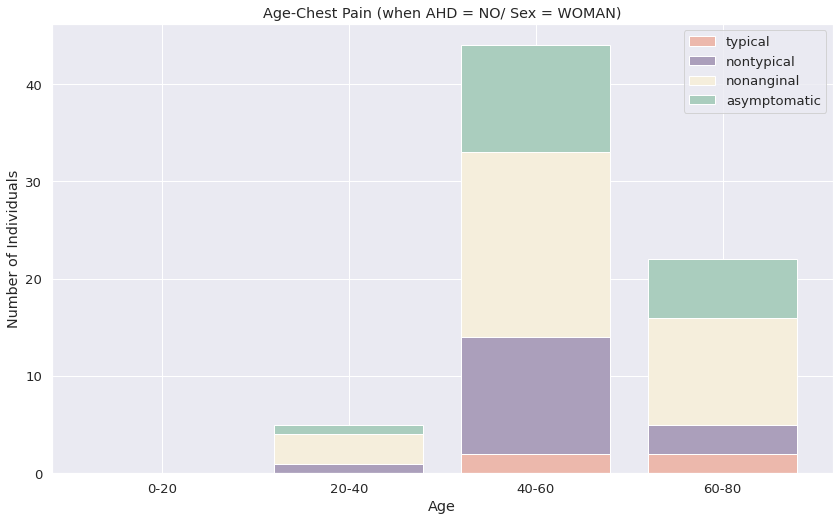

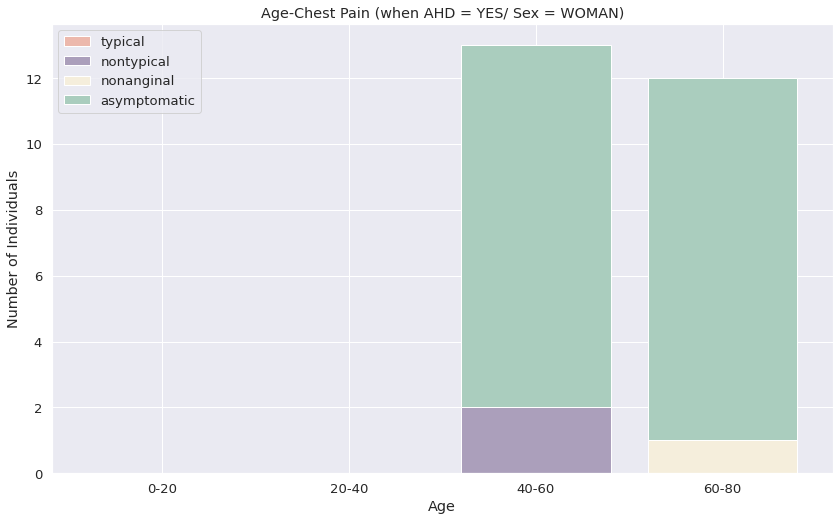

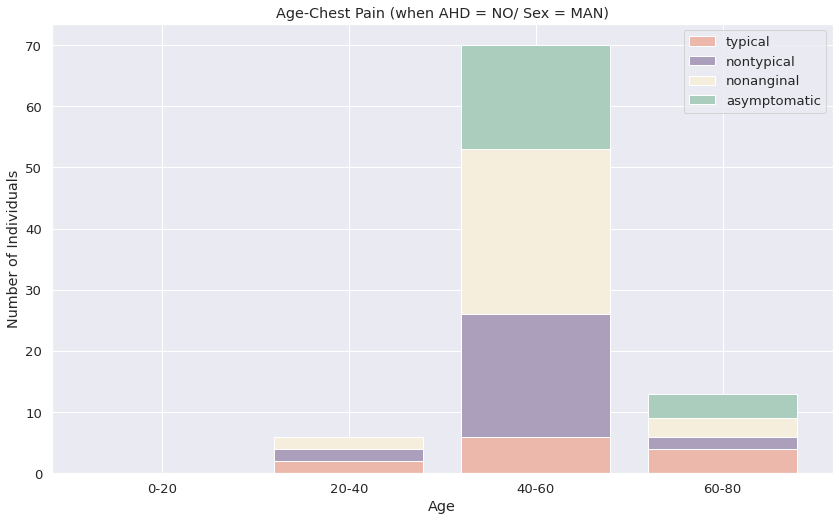

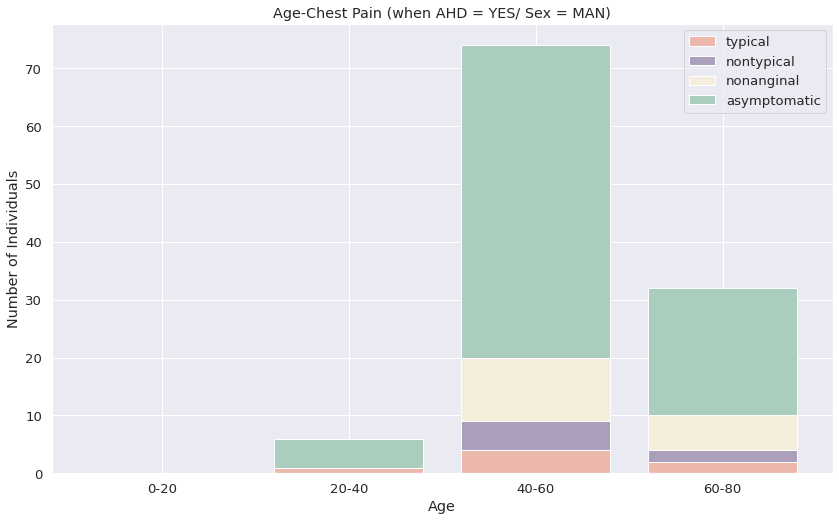

In [ ]:
# All four different variations of the data is provided below.

#Case1 ahd = 0 sex =0
chestAge(0,0,df)
#Case2 ahd = 1 sex =0
chestAge(1,0,df)
#Case3 ahd = 0 sex =1
chestAge(0,1,df)
#Case4 ahd = 1 sex =1
chestAge(1,1,df)

2. Fibs-Age-AHD-Sex Comparison Graphs

In [ ]:
#Fibs-Age --> Main Function
def FibsAge(ahd, sex, df):
  df['AHD'].replace("Yes", 1, inplace=True)
  df['AHD'].replace("No", 0, inplace=True)

  newDf = df[df['AHD'] == ahd ][df['Sex'] == sex]
  if(ahd == 1):
    ahdName = "YES"
  elif(ahd == 0):
    ahdName = "NO"
  if(sex == 1):
    sexName = "MAN"
  elif(sex == 0):
    sexName = "WOMAN"
                      
  x = ['0-20','20-40','40-60','60-80']

  low = newDf[newDf['Age'] <= 20][newDf['Age'] >= 0]
  mid1 = newDf[newDf['Age'] <= 40][newDf['Age'] > 20]
  mid2 = newDf[newDf['Age'] <= 60][newDf['Age'] > 40]
  high = newDf[newDf['Age'] <= 80][newDf['Age'] > 60]

  higher120  = np.array([len(list(low[low['Fbs'] == 1]['Fbs'])), len(list(mid1[mid1['Fbs'] == 1]['Fbs'])),len(list(mid2[mid2['Fbs'] == 1]['Fbs'])),len(list(high[high['Fbs'] == 1]['Fbs']))])
  other = np.array([len(list(low[low['Fbs'] == 0]['Fbs'])), len(list(mid1[mid1['Fbs'] == 0]['Fbs'])),len(list(mid2[mid2['Fbs'] == 0]['Fbs'])),len(list(high[high['Fbs'] == 0]['Fbs']))])
  
  plt.bar(x, higher120, color='#ECB8AC')
  plt.bar(x, other, bottom=higher120, color='#AACDBE')

  plt.xlabel("Age")
  plt.ylabel("Number of Individuals")
  plt.legend([">120mg/dL(likey to be diabetic)", "<=120mg/dL"])
  plt.title("Age-Fibs Pain (when AHD = " + ahdName + "/ Sex = " + sexName + ")")
  plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: UserWarning:



Boolean Series key will be reindexed to match DataFrame index.



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: UserWarning:



Boolean Series key will be reindexed to match DataFrame index.



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: UserWarning:



Boolean Series key will be reindexed to match DataFrame index.



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: UserWarning:



Boolean Series key will be reindexed to match DataFrame index.




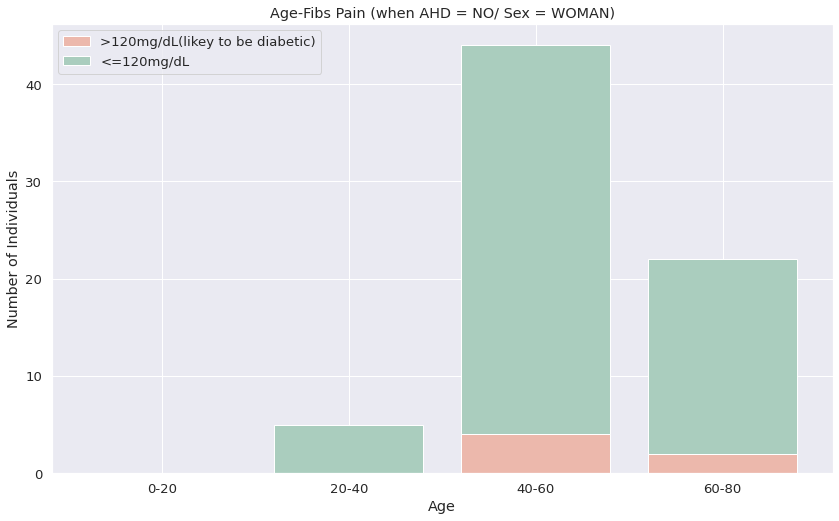

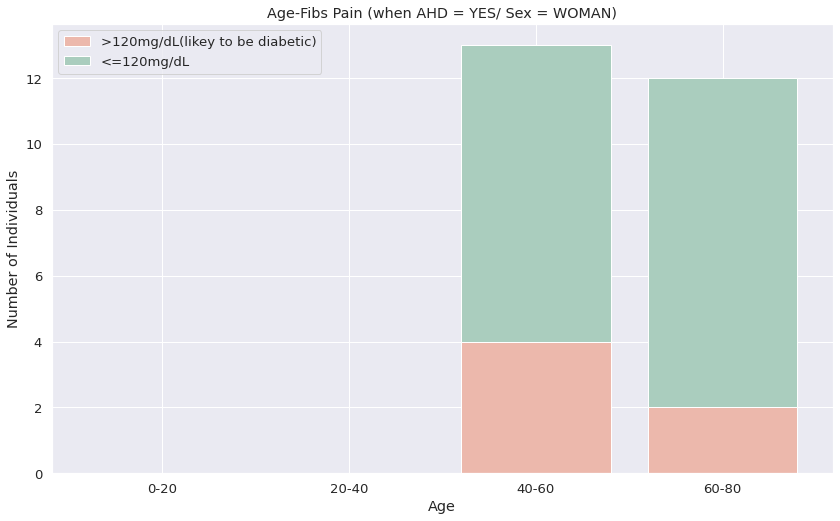

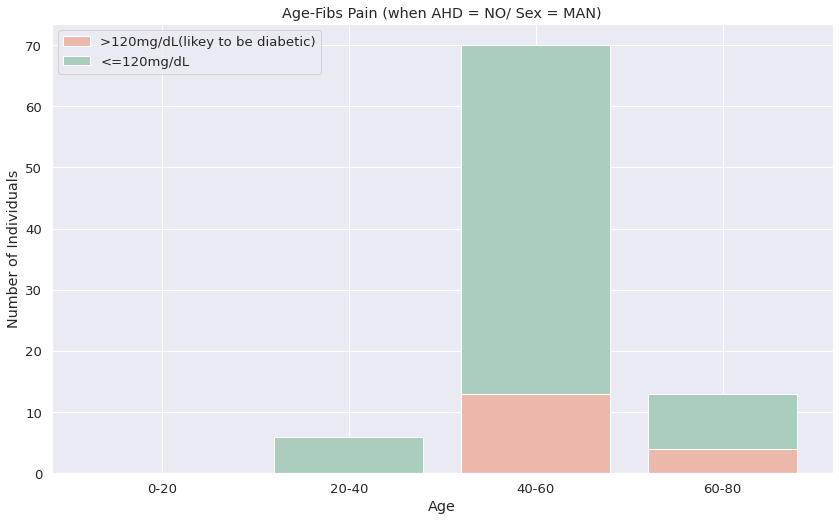

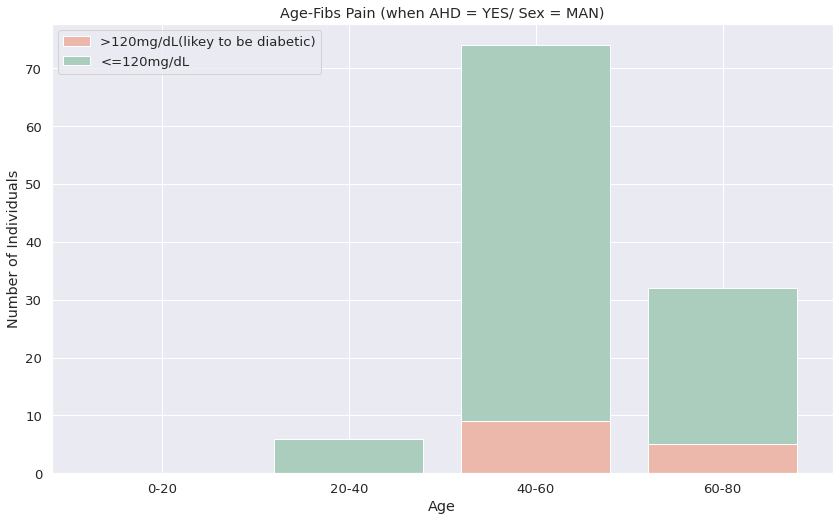

In [ ]:
# All four different variations of the data is provided below.
 
#Case1 ahd = 0 sex =0
FibsAge(0,0,df)
#Case2 ahd = 1 sex =0
FibsAge(1,0,df)
#Case3 ahd = 0 sex =1
FibsAge(0,1,df)
#Case4 ahd = 1 sex =1
FibsAge(1,1,df)

3. RestECG-Age-AHD-Sex Comparison Graphs

In [ ]:
#restEcg-Age --> Main Function
def restEcg_Age(ahd, sex, df):
  df['AHD'].replace("Yes", 1, inplace=True)
  df['AHD'].replace("No", 0, inplace=True)

  newDf = df[df['AHD'] == ahd ][df['Sex'] == sex]
  if(ahd == 1):
    ahdName = "YES"
  elif(ahd == 0):
    ahdName = "NO"
  if(sex == 1):
    sexName = "MAN"
  elif(sex == 0):
    sexName = "WOMAN"
                      
  x = ['0-20','20-40','40-60','60-80']
 
  low = newDf[newDf['Age'] <= 20][newDf['Age'] >= 0]
  mid1 = newDf[newDf['Age'] <= 40][newDf['Age'] > 20]
  mid2 = newDf[newDf['Age'] <= 60][newDf['Age'] > 40]
  high = newDf[newDf['Age'] <= 80][newDf['Age'] > 60]

  
  normal = np.array([len(list(low[low['RestECG'] == 0]['RestECG'])), len(list(mid1[mid1['RestECG'] == 0]['RestECG'])),len(list(mid2[mid2['RestECG'] == 0]['RestECG'])),len(list(high[high['RestECG'] == 0]['RestECG']))])
  abnormal = np.array([len(list(low[low['RestECG'] == 1]['RestECG'])), len(list(mid1[mid1['RestECG'] == 1]['RestECG'])),len(list(mid2[mid2['RestECG'] == 1]['RestECG'])),len(list(high[high['RestECG'] == 1]['RestECG']))])
  definite = np.array([len(list(low[low['RestECG'] == 2]['RestECG'])), len(list(mid1[mid1['RestECG'] == 2]['RestECG'])),len(list(mid2[mid2['RestECG'] == 2]['RestECG'])),len(list(high[high['RestECG'] == 2]['RestECG']))])
  
  
  plt.bar(x, normal, color='#ECB8AC')
  plt.bar(x, abnormal, bottom=normal, color='#AACDBE')
  plt.bar(x, definite, bottom=normal+abnormal, color='#AB9FBB')

  plt.xlabel("Age")
  plt.ylabel("Number of Individuals")
  plt.legend(["Normal", "ST-T","LVH"])
  plt.title("Age-RestECG (when AHD = " + ahdName + "/ Sex = " + sexName + ")")
  plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: UserWarning:



Boolean Series key will be reindexed to match DataFrame index.



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: UserWarning:



Boolean Series key will be reindexed to match DataFrame index.



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: UserWarning:



Boolean Series key will be reindexed to match DataFrame index.



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: UserWarning:



Boolean Series key will be reindexed to match DataFrame index.




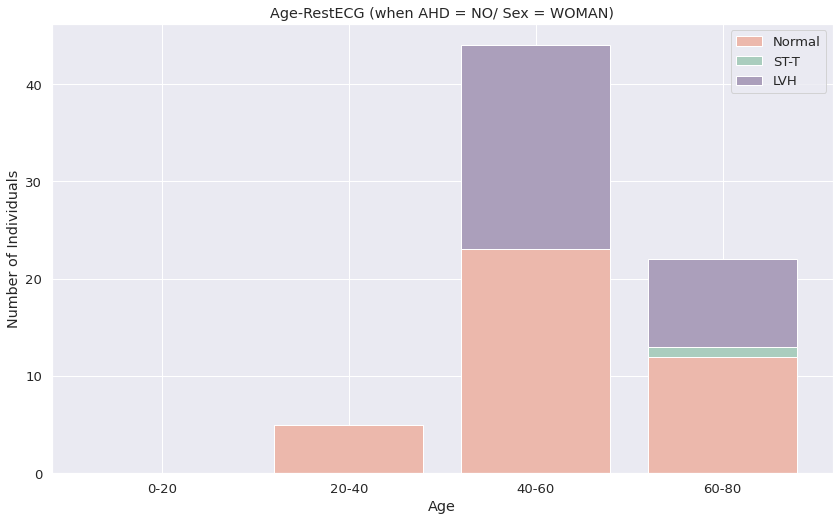

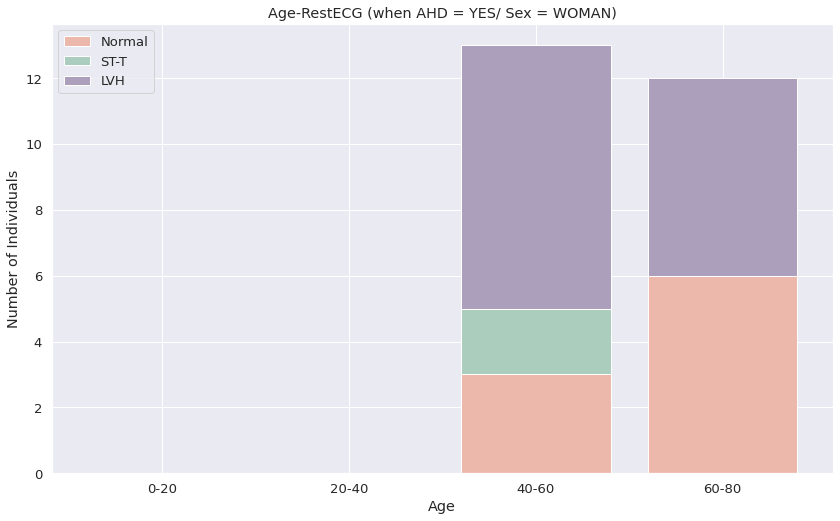

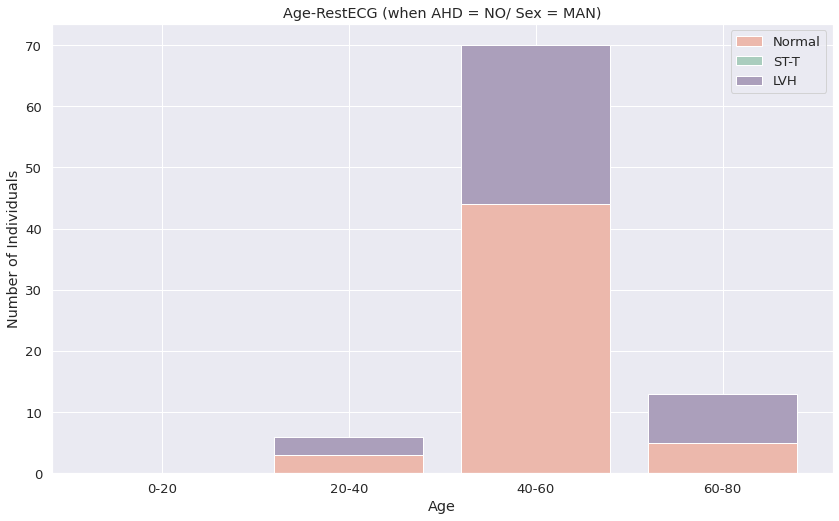

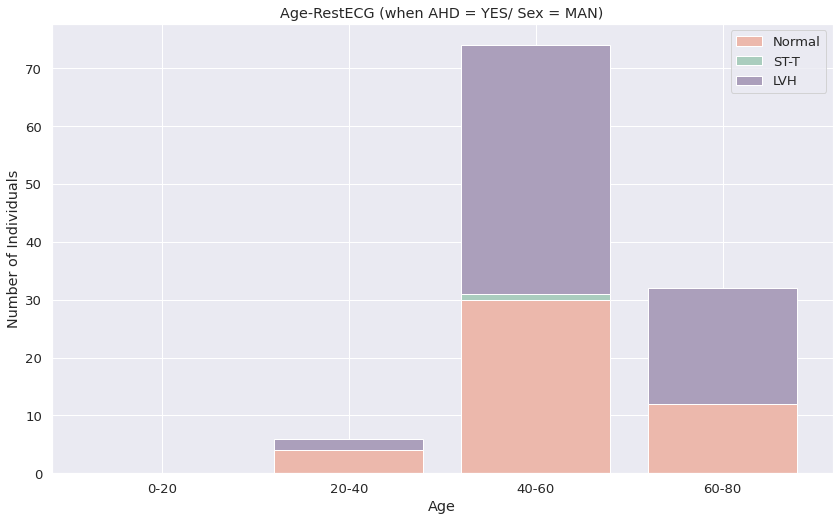

In [ ]:
#All four different variations of the data is provided below.

#case1 ahd = 0 sex =0
restEcg_Age(0,0,df)
#case2 ahd = 1 sex =0
restEcg_Age(1,0,df)
#case3 ahd = 0 sex =1
restEcg_Age(0,1,df)
#case4 ahd = 1 sex =1
restEcg_Age(1,1,df)

4. ExAng-Age-AHD-Sex Comparison Graphs

In [ ]:
#ExAng-Age --> Main Function
def exangAge(ahd, sex, df):
  df['AHD'].replace("Yes", 1, inplace=True)
  df['AHD'].replace("No", 0, inplace=True)

  newDf = df[df['AHD'] == ahd ][df['Sex'] == sex]
  if(ahd == 1):
    ahdName = "YES"
  elif(ahd == 0):
    ahdName = "NO"
  if(sex == 1):
    sexName = "MAN"
  elif(sex == 0):
    sexName = "WOMAN"
                      
  x = ['0-20','20-40','40-60','60-80']
 
  low = newDf[newDf['Age'] <= 20][newDf['Age'] >= 0]
  mid1 = newDf[newDf['Age'] <= 40][newDf['Age'] > 20]
  mid2 = newDf[newDf['Age'] <= 60][newDf['Age'] > 40]
  high = newDf[newDf['Age'] <= 80][newDf['Age'] > 60]

  
  no = np.array([len(list(low[low['ExAng'] == 0]['ExAng'])), len(list(mid1[mid1['ExAng'] == 0]['ExAng'])),len(list(mid2[mid2['ExAng'] == 0]['ExAng'])),len(list(high[high['ExAng'] == 0]['ExAng']))])
  yes = np.array([len(list(low[low['ExAng'] == 1]['ExAng'])), len(list(mid1[mid1['ExAng'] == 1]['ExAng'])),len(list(mid2[mid2['ExAng'] == 1]['ExAng'])),len(list(high[high['ExAng'] == 1]['ExAng']))])
  
  
  plt.bar(x, no, color='#ECB8AC')
  plt.bar(x, yes, bottom=no, color='#AACDBE')


  plt.xlabel("Age")
  plt.ylabel("Number of Individuals")
  plt.legend(["No", "Yes"])
  plt.title("Age-ExAng (when AHD = " + ahdName + "/ Sex = " + sexName + ")")
  plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: UserWarning:



Boolean Series key will be reindexed to match DataFrame index.



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: UserWarning:



Boolean Series key will be reindexed to match DataFrame index.



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: UserWarning:



Boolean Series key will be reindexed to match DataFrame index.



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: UserWarning:



Boolean Series key will be reindexed to match DataFrame index.




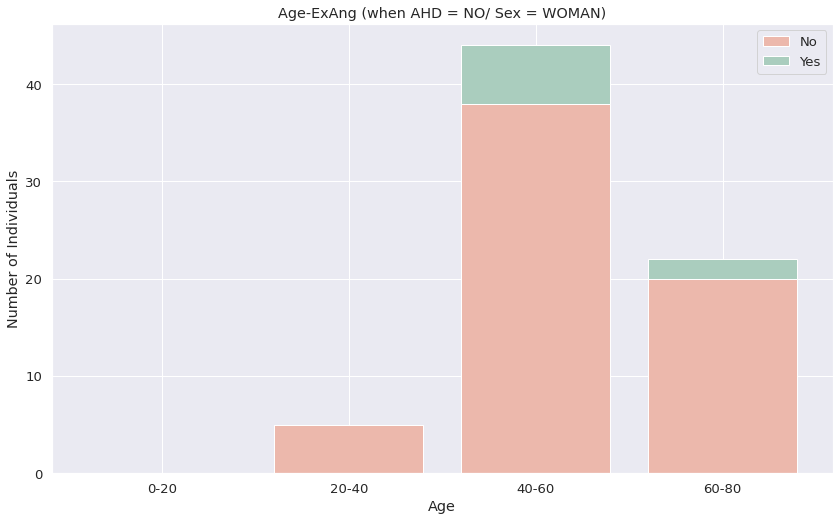

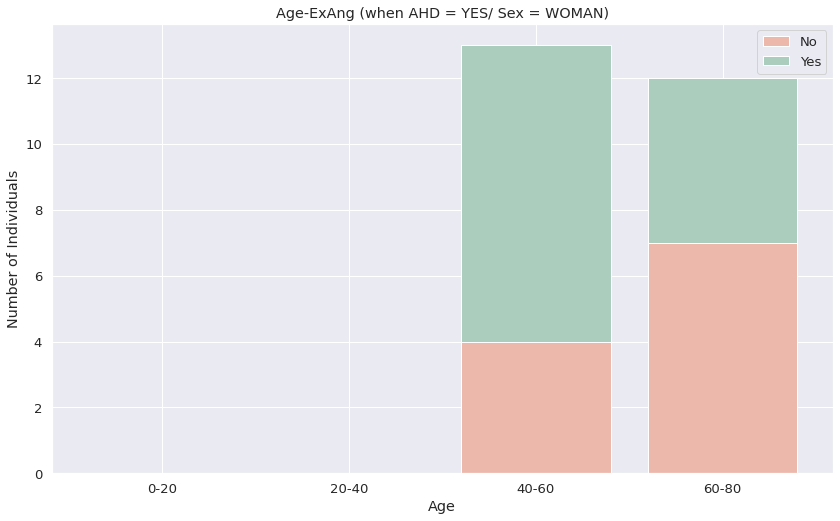

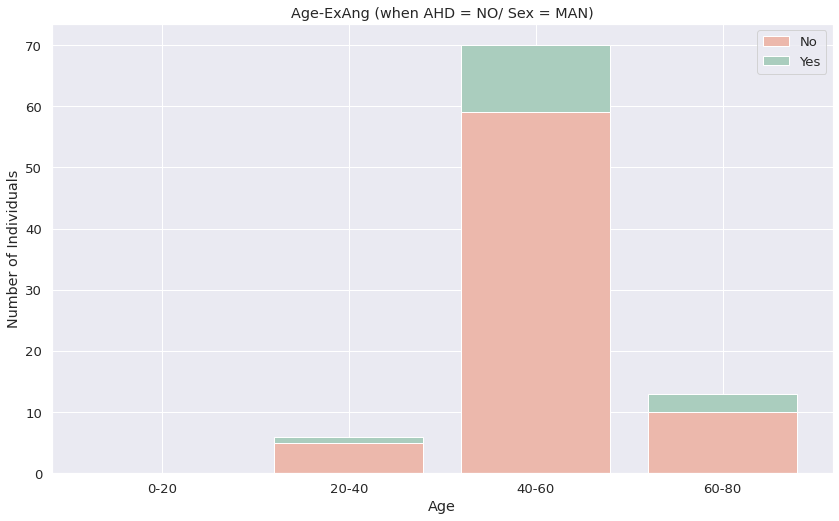

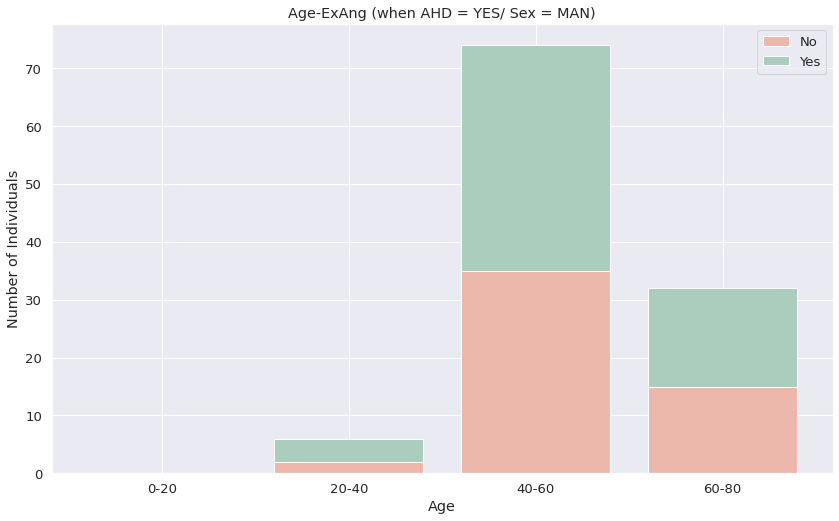

In [ ]:
#All four different variations of the data is provided below.

#Case1 ahd = 0 sex =0
exangAge(0,0,df)
#Case2 ahd = 1 sex =0
exangAge(1,0,df)
#Case3 ahd = 0 sex =1
exangAge(0,1,df)
#Case4 ahd = 1 sex =1
exangAge(1,1,df)

5. Thal-Age-AHD-Sex Comparison Graphs

In [ ]:
#Thal-Age --> Main Function
def thalAge(ahd, sex, df):
  df['AHD'].replace("Yes", 1, inplace=True)
  df['AHD'].replace("No", 0, inplace=True)

  newDf = df[df['AHD'] == ahd ][df['Sex'] == sex]
  if(ahd == 1):
    ahdName = "YES"
  elif(ahd == 0):
    ahdName = "NO"
  if(sex == 1):
    sexName = "MAN"
  elif(sex == 0):
    sexName = "WOMAN"
                      
  x = ['0-20','20-40','40-60','60-80']

  newDf['Thal'].replace(['normal','fixed','reversable'],[1,2,3],inplace=True)

  low = newDf[newDf['Age'] <= 20][newDf['Age'] >= 0]
  mid1 = newDf[newDf['Age'] <= 40][newDf['Age'] > 20]
  mid2 = newDf[newDf['Age'] <= 60][newDf['Age'] > 40]
  high = newDf[newDf['Age'] <= 80][newDf['Age'] > 60]

  
  normal = np.array([len(list(low[low['Thal'] == 1]['Thal'])), len(list(mid1[mid1['Thal'] == 1]['Thal'])),len(list(mid2[mid2['Thal'] == 1]['Thal'])),len(list(high[high['Thal'] == 1]['Thal']))])
  fixed = np.array([len(list(low[low['Thal'] == 2]['Thal'])), len(list(mid1[mid1['Thal'] == 2]['Thal'])),len(list(mid2[mid2['Thal'] == 2]['Thal'])),len(list(high[high['Thal'] == 2]['Thal']))])
  reversable = np.array([len(list(low[low['Thal'] == 3]['Thal'])), len(list(mid1[mid1['Thal'] == 3]['Thal'])),len(list(mid2[mid2['Thal'] == 3]['Thal'])),len(list(high[high['Thal'] == 3]['Thal']))])
  
  plt.bar(x, normal, color='#ECB8AC')
  plt.bar(x, fixed, bottom=normal, color='#AACDBE')
  plt.bar(x, reversable, bottom=normal+fixed, color='#AB9FBB')

  plt.xlabel("Age")
  plt.ylabel("Number of Individuals")
  plt.legend(["Normal", "Fixed","Reversable"])
  plt.title("Age-Thal (when AHD = " + ahdName + "/ Sex = " + sexName + ")")
  plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: UserWarning:



Boolean Series key will be reindexed to match DataFrame index.



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: UserWarning:



Boolean Series key will be reindexed to match DataFrame index.



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:21: UserWarning:



Boolean Series key will be reindexed to match DataFrame index.



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: UserWarning:



Boolean Series key will be reindexed to match DataFrame index.




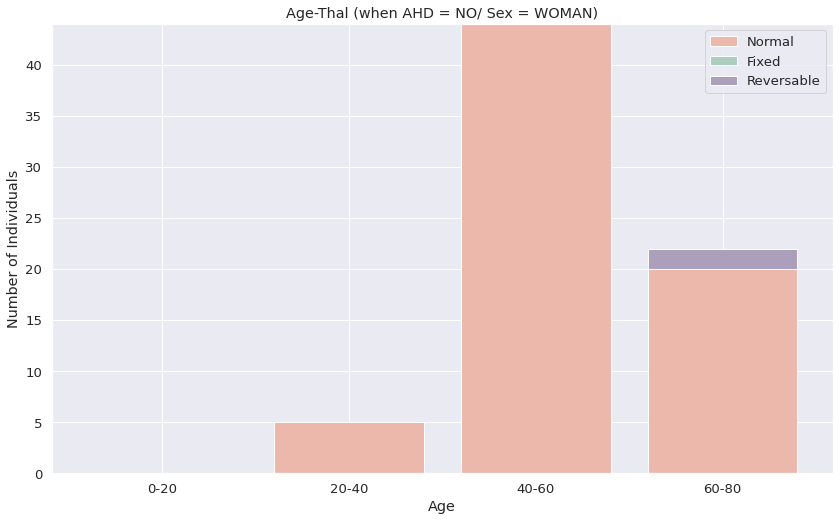

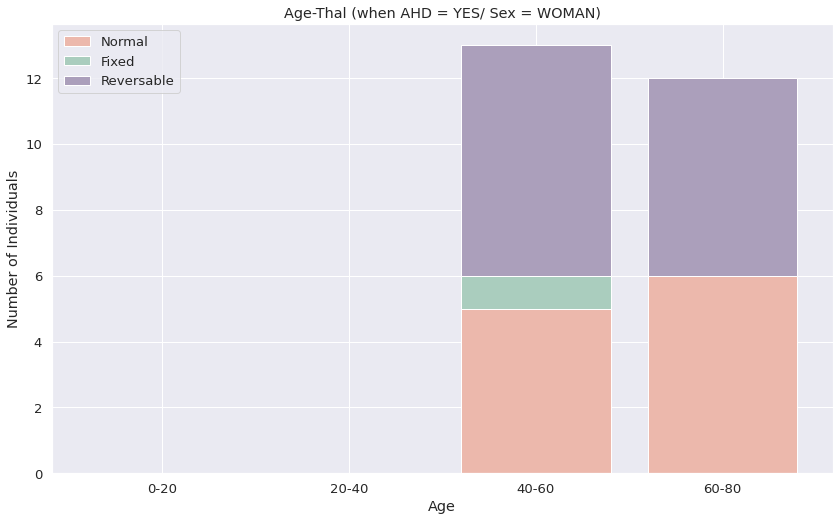

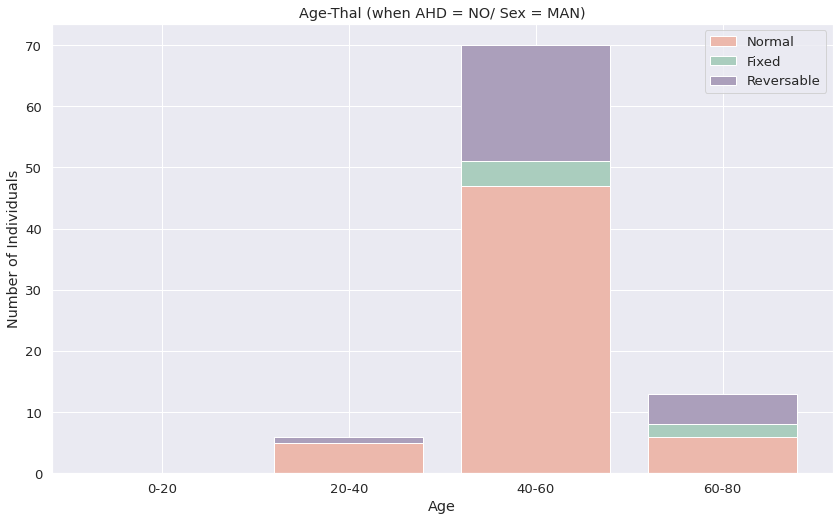

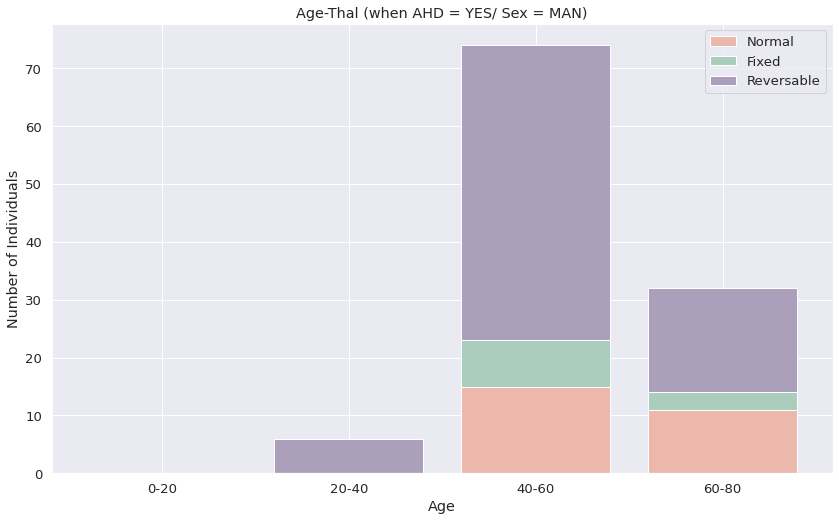

In [ ]:
#All four different variations of the data is provided below.

#Case1 ahd = 0 sex =0
thalAge(0,0,df)
#Case2 ahd = 1 sex =0
thalAge(1,0,df)
#Case3 ahd = 0 sex =1
thalAge(0,1,df)
#Case4 ahd = 1 sex =1
thalAge(1,1,df)

6. Ca-Age-AHD-Sex Comparison Graphs

In [ ]:
#Ca-Age --> Main Function
df['Ca'].replace(['0 Major Vessel','1 Major Vessel','2 Major Vessel','3 Major Vessel'],[0,1,2,3],inplace=True)
def caAge(ahd, sex, df):
  df['AHD'].replace("Yes", 1, inplace=True)
  df['AHD'].replace("No", 0, inplace=True)

  newDf = df[df['AHD'] == ahd ][df['Sex'] == sex]
  if(ahd == 1):
    ahdName = "YES"
  elif(ahd == 0):
    ahdName = "NO"
  if(sex == 1):
    sexName = "MAN"
  elif(sex == 0):
    sexName = "WOMAN"
                      
  x = ['0-20','20-40','40-60','60-80']
 
  low = newDf[newDf['Age'] <= 20][newDf['Age'] >= 0]
  mid1 = newDf[newDf['Age'] <= 40][newDf['Age'] > 20]
  mid2 = newDf[newDf['Age'] <= 60][newDf['Age'] > 40]
  high = newDf[newDf['Age'] <= 80][newDf['Age'] > 60]

  
  zero = np.array([len(list(low[low['Ca'] == 0]['Ca'])), len(list(mid1[mid1['Ca'] == 0]['Ca'])),len(list(mid2[mid2['Ca'] == 0]['Ca'])),len(list(high[high['Ca'] == 0]['Ca']))])
  one = np.array([len(list(low[low['Ca'] == 1]['Ca'])), len(list(mid1[mid1['Ca'] == 1]['Ca'])),len(list(mid2[mid2['Ca'] == 1]['Ca'])),len(list(high[high['Ca'] == 1]['Ca']))])
  two = np.array([len(list(low[low['Ca'] == 2]['Ca'])), len(list(mid1[mid1['Ca'] == 2]['Ca'])),len(list(mid2[mid2['Ca'] == 2]['Ca'])),len(list(high[high['Ca'] == 2]['Ca']))])
  third = np.array([len(list(low[low['Ca'] == 3]['Ca'])), len(list(mid1[mid1['Ca'] == 3]['Ca'])),len(list(mid2[mid2['Ca'] == 3]['Ca'])),len(list(high[high['Ca'] == 3]['Ca']))])
  
  
  plt.bar(x, zero, color='#ECB8AC')
  plt.bar(x, one, bottom = zero, color='#AACDBE')
  plt.bar(x, two, bottom = zero + one, color='#AB9FBB')
  plt.bar(x, third, bottom = zero + one + two, color='#F5EEDC')

  plt.xlabel("Age")
  plt.ylabel("Number of Individuals")
  plt.legend(["0 major vessel", "1 major vessel","2 major vessel", "3 major vessel"])
  plt.title("Age-RestECG (when AHD = " + ahdName + "/ Sex = " + sexName + ")")
  plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: UserWarning:



Boolean Series key will be reindexed to match DataFrame index.



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: UserWarning:



Boolean Series key will be reindexed to match DataFrame index.



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: UserWarning:



Boolean Series key will be reindexed to match DataFrame index.



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:21: UserWarning:



Boolean Series key will be reindexed to match DataFrame index.




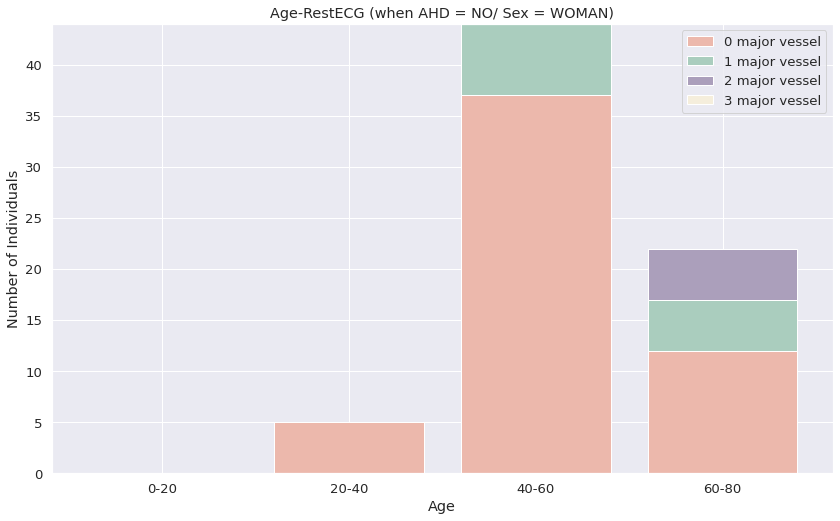

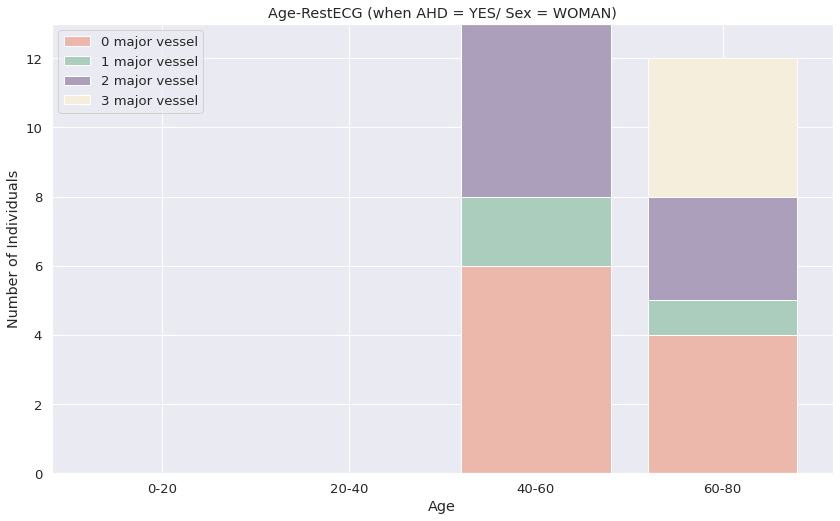

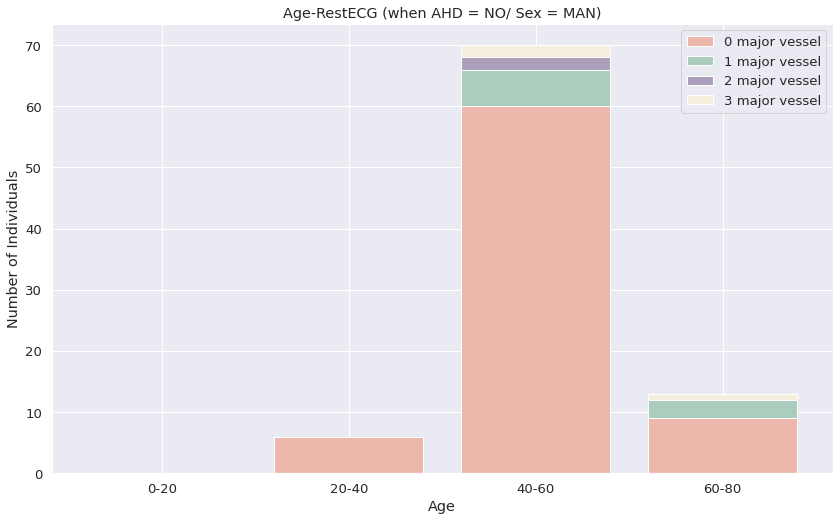

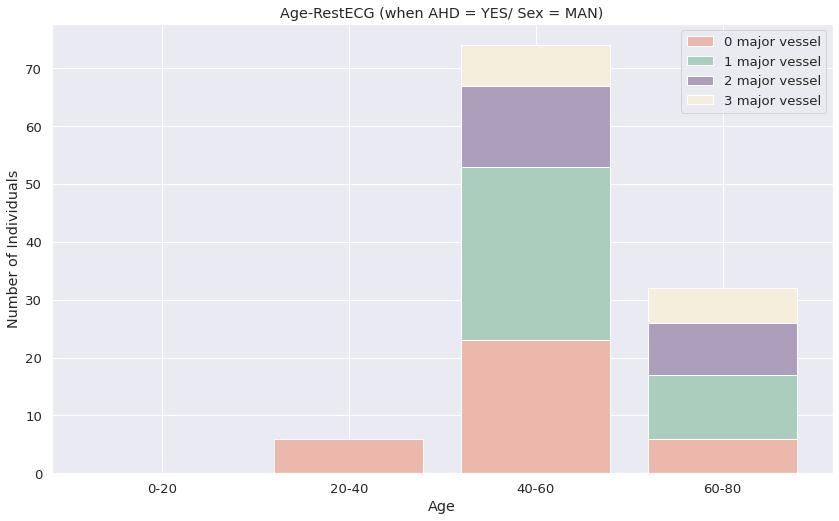

In [ ]:
#All four variations of the data can is provided below.

#Case1 ahd = 0 sex =0
caAge(0,0,df)
#Case2 ahd = 1 sex =0
caAge(1,0,df)
#Case3 ahd = 0 sex =1
caAge(0,1,df)
#Case4 ahd = 1 sex =1
caAge(1,1,df)

<h3>Analysing & Visualysing how each attribute changes with respect to Age and Sex</h3>

Similar to the previous grouped visualisations, attributes are compared exclusively with respect to Age and Sex below.

1-) AGE-SEX-Fbs Comparison Graphs


In [ ]:
#restEcg-Age --> Main Function
def FibsAgeSex(sex, df):
  newDf =df[df['Sex'] == sex]
  if(sex == 1):
    sexName = "Man"
  elif(sex == 0):
    sexName = "Woman"
                      
  x = ['0-20','20-40','40-60','60-80']

  low = newDf[newDf['Age'] <= 20][newDf['Age'] >= 0]
  mid1 = newDf[newDf['Age'] <= 40][newDf['Age'] > 20]
  mid2 = newDf[newDf['Age'] <= 60][newDf['Age'] > 40]
  high = newDf[newDf['Age'] <= 80][newDf['Age'] > 60]

  higher120  = np.array([len(list(low[low['Fbs'] == 1]['Fbs'])), len(list(mid1[mid1['Fbs'] == 1]['Fbs'])),len(list(mid2[mid2['Fbs'] == 1]['Fbs'])),len(list(high[high['Fbs'] == 1]['Fbs']))])
  other = np.array([len(list(low[low['Fbs'] == 0]['Fbs'])), len(list(mid1[mid1['Fbs'] == 0]['Fbs'])),len(list(mid2[mid2['Fbs'] == 0]['Fbs'])),len(list(high[high['Fbs'] == 0]['Fbs']))])
  
  plt.bar(x, higher120, color='#ECB8AC')
  plt.bar(x, other, bottom=higher120, color='#AACDBE')

  plt.xlabel("Age")
  plt.ylabel("Number of Individuals")
  plt.legend([">120mg/dL(likey to be diabetic)", "<=120mg/dL"])
  plt.title("Age-Fibs Pain Graph for " + sexName + "'s")
  plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: UserWarning:



Boolean Series key will be reindexed to match DataFrame index.



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning:



Boolean Series key will be reindexed to match DataFrame index.



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: UserWarning:



Boolean Series key will be reindexed to match DataFrame index.




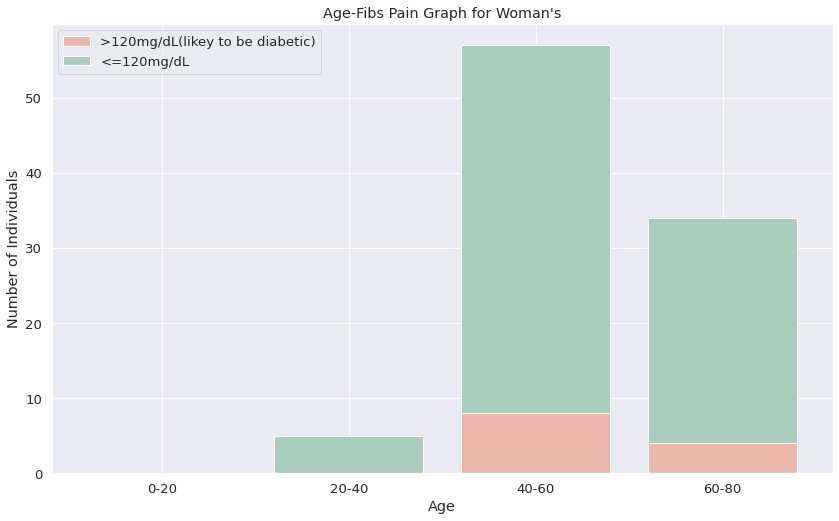

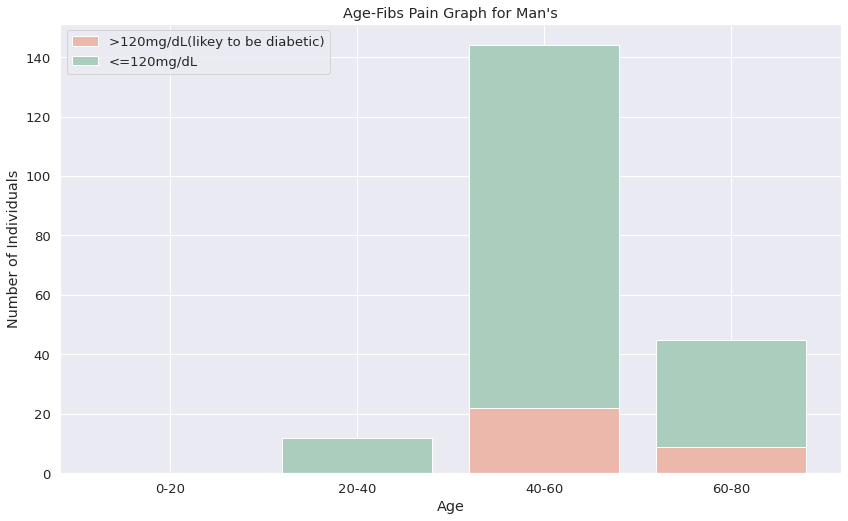

In [ ]:
#Fibs-Age-Sex Function Calls
#Case1- sex =0
FibsAgeSex(0,df)
#Case2- sex =1
FibsAgeSex(1,df)

2-)AGE-SEX-ExAng Comparison Graphs

In [ ]:
#ExAng-Age --> Main Function
def exangAgeSex(sex, df):

  newDf =df[df['Sex'] == sex]

  if(sex == 1):
    sexName = "Man"
  elif(sex == 0):
    sexName = "Woman"
                      
  x = ['0-20','20-40','40-60','60-80']
 
  low = newDf[newDf['Age'] <= 20][newDf['Age'] >= 0]
  mid1 = newDf[newDf['Age'] <= 40][newDf['Age'] > 20]
  mid2 = newDf[newDf['Age'] <= 60][newDf['Age'] > 40]
  high = newDf[newDf['Age'] <= 80][newDf['Age'] > 60]

  
  no = np.array([len(list(low[low['ExAng'] == 0]['ExAng'])), len(list(mid1[mid1['ExAng'] == 0]['ExAng'])),len(list(mid2[mid2['ExAng'] == 0]['ExAng'])),len(list(high[high['ExAng'] == 0]['ExAng']))])
  yes = np.array([len(list(low[low['ExAng'] == 1]['ExAng'])), len(list(mid1[mid1['ExAng'] == 1]['ExAng'])),len(list(mid2[mid2['ExAng'] == 1]['ExAng'])),len(list(high[high['ExAng'] == 1]['ExAng']))])
  
  
  plt.bar(x, no, color='#ECB8AC')
  plt.bar(x, yes, bottom=no, color='#AACDBE')


  plt.xlabel("Age")
  plt.ylabel("Number of Individuals")
  plt.legend(["No", "Yes"])
  plt.title("Age-ExAng Pain Graph for " + sexName + "'s")
  plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: UserWarning:



Boolean Series key will be reindexed to match DataFrame index.



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: UserWarning:



Boolean Series key will be reindexed to match DataFrame index.



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: UserWarning:



Boolean Series key will be reindexed to match DataFrame index.




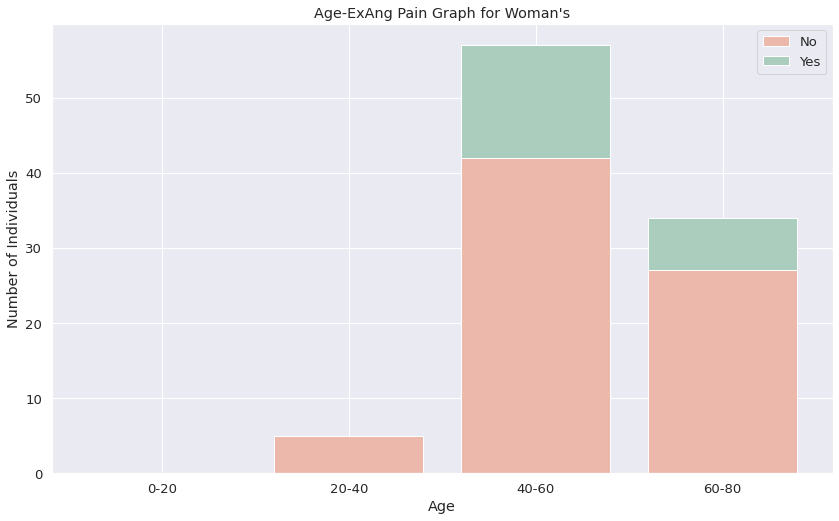

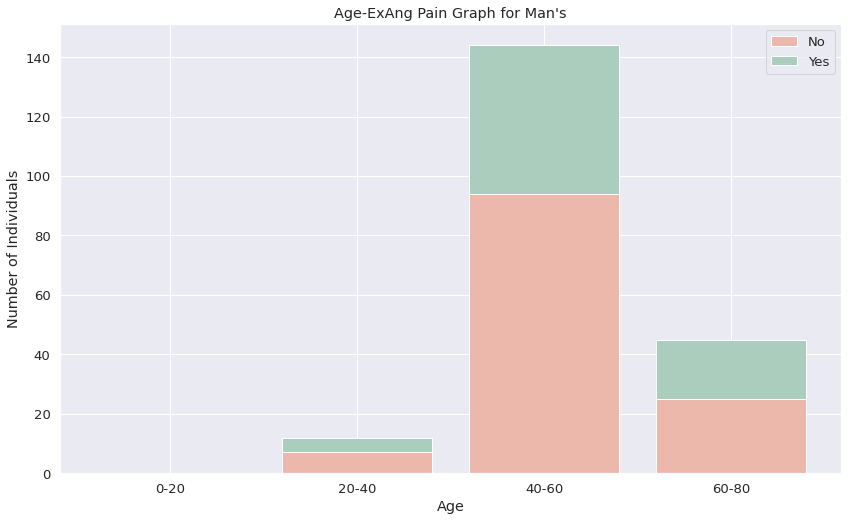

In [ ]:
#ExAng-Age-Sex Function Calls
#case1- sex =0
exangAgeSex(0,df)
#case2- sex =1
exangAgeSex(1,df)

3-) AGE-SEX-Chol Comparison Graphs

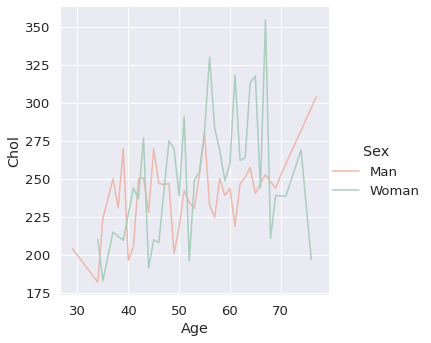

In [ ]:
#Chol-Age-Sex Function Calls
df['Sex'].replace([0,1],['Woman','Man'],inplace=True)
sns.relplot(x="Age", y="Chol", ci =None, hue="Sex", kind="line", data=df, palette = ["#ECB8AC", "#AACDBE"]);

In [ ]:
#ChestPain comparison for Age and chosen Sex --> Main Function
df['Sex'].replace(['Woman','Man'],[0,1],inplace=True)
def chestAgeSex(sex, df):
  newDf = df[df['Sex'] == sex]

  if(sex == 1):
    sexName = "MAN"
  elif(sex == 0):
    sexName = "WOMAN"
                      
  x = ['0-20','20-40','40-60','60-80']
  newDf['ChestPain'].replace(['typical','nontypical','nonanginal','asymptomatic'],[1,2,3,4],inplace=True)

  low = newDf[newDf['Age'] <= 20][newDf['Age'] >= 0]
  mid1 = newDf[newDf['Age'] <= 40][newDf['Age'] > 20]
  mid2 = newDf[newDf['Age'] <= 60][newDf['Age'] > 40]
  high = newDf[newDf['Age'] <= 80][newDf['Age'] > 60]

  
  typical = np.array([len(list(low[low['ChestPain'] == 1]['ChestPain'])), len(list(mid1[mid1['ChestPain'] == 1]['ChestPain'])),len(list(mid2[mid2['ChestPain'] == 1]['ChestPain'])),len(list(high[high['ChestPain'] == 1]['ChestPain']))])
  nontypical = np.array([len(list(low[low['ChestPain'] == 2]['ChestPain'])), len(list(mid1[mid1['ChestPain'] == 2]['ChestPain'])),len(list(mid2[mid2['ChestPain'] == 2]['ChestPain'])),len(list(high[high['ChestPain'] == 2]['ChestPain']))])
  nonanginal = np.array([len(list(low[low['ChestPain'] == 3]['ChestPain'])), len(list(mid1[mid1['ChestPain'] == 3]['ChestPain'])),len(list(mid2[mid2['ChestPain'] == 3]['ChestPain'])),len(list(high[high['ChestPain'] == 3]['ChestPain']))])
  asymptomatic = np.array([len(list(low[low['ChestPain'] == 4]['ChestPain'])), len(list(mid1[mid1['ChestPain'] == 4]['ChestPain'])),len(list(mid2[mid2['ChestPain'] == 4]['ChestPain'])),len(list(high[high['ChestPain'] == 4]['ChestPain']))])

  plt.bar(x, typical, color='#ECB8AC')
  plt.bar(x, nontypical, bottom=typical, color='#AACDBE')
  plt.bar(x, nonanginal, bottom=typical+nontypical, color='#AB9FBB')
  plt.bar(x, asymptomatic, bottom=typical+nontypical+nonanginal, color='#F5EEDC')

  plt.xlabel("Age")
  plt.ylabel("Number of Individuals")
  plt.legend(["typical", "nontypical","nonanginal","asymptomatic"])
  plt.title("Age-Chest Pain for " + sexName + "'s")
  plt.show()

4-) AGE-SEX-ChestPain Comparison Graphs

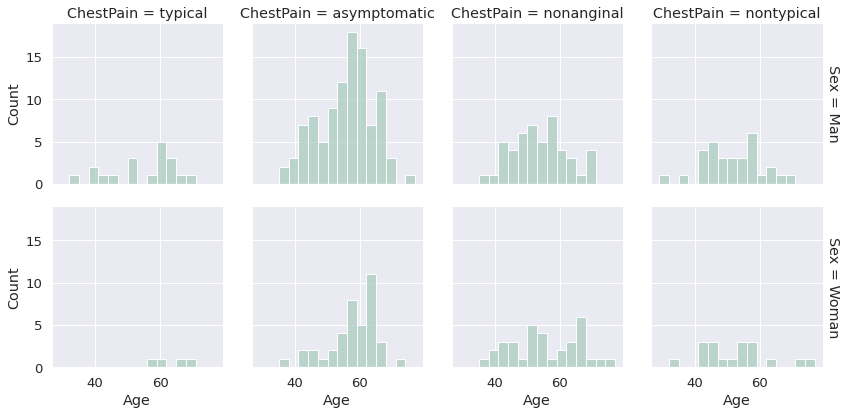

In [ ]:
'''
#case1
#sex = male
chestAgeSex(1,df)
#case2
#sex = female
chestAgeSex(0,df)
'''
#General
df['Sex'].replace([0,1],['Woman','Man'],inplace=True)
sns.displot(df, x="Age", col="ChestPain", row="Sex", binwidth=3, height=3, facet_kws=dict(margin_titles=True), color = "#AACDBE")

5-) AGE-SEX-RestBP Comparison Graphs

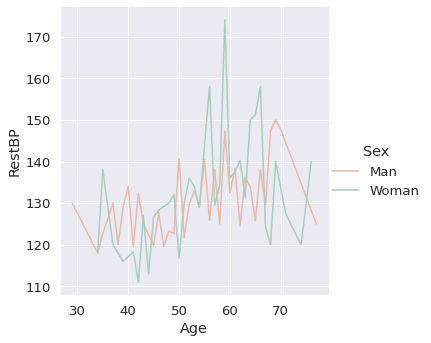

In [ ]:
#RestBP-Age-Sex function calls
df['Sex'].replace([0,1],['Woman','Man'],inplace=True)
sns.relplot(x="Age", y="RestBP", ci =None, hue="Sex", kind="line", data=df, palette = ["#ECB8AC", "#AACDBE"]);

6-) AGE-SEX-RestECG Comparison Graphs

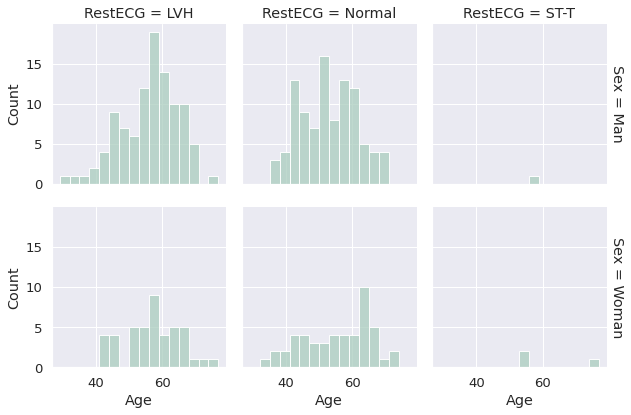

In [ ]:
#RestECG-Age-Sex function calls
df['RestECG'].replace([0,1,2],['Normal','ST-T','LVH'],inplace=True)
sns.displot(df, x="Age", col="RestECG", row="Sex", binwidth=3, height=3, facet_kws=dict(margin_titles=True), color = "#AACDBE")

7-) AGE-SEX-MaxHR Comparison Graphs

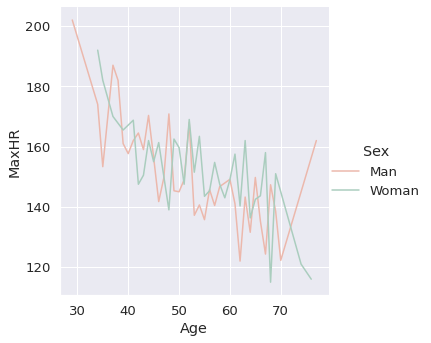

In [ ]:
#MaxHR-Age-Sex function calls
sns.relplot(x="Age", y="MaxHR", ci =None, hue="Sex", kind="line", data=df, palette = ["#ECB8AC", "#AACDBE"])

8-) AGE-SEX-Oldpeak Comparison Graphs

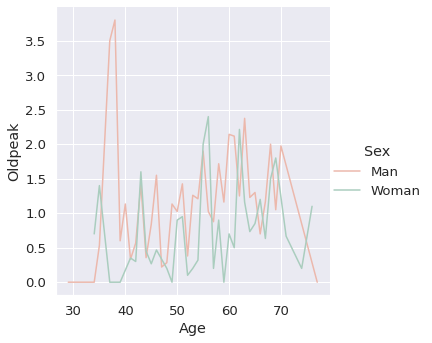

In [ ]:
#Oldpeak-Age-Sex function calls
sns.relplot(x="Age", y="Oldpeak", ci =None, hue="Sex", kind="line", data=df, palette = ["#ECB8AC", "#AACDBE"]);

9-) AGE-SEX-Slope Comparison Graphs

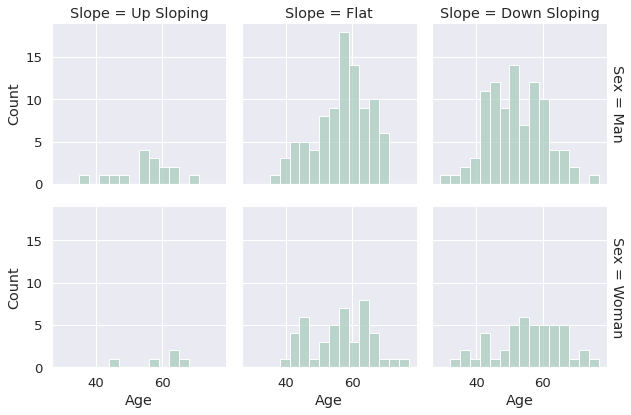

In [ ]:
#Slope-Age-Sex function calls
df['Slope'].replace([1,2,3],['UpSloping','Flat','DownSloping'],inplace=True)
sns.displot(df, x="Age", col="Slope", row="Sex", binwidth=3, height=3, facet_kws=dict(margin_titles=True), color = "#AACDBE")

10-) AGE-SEX-Ca Comparison Graphs

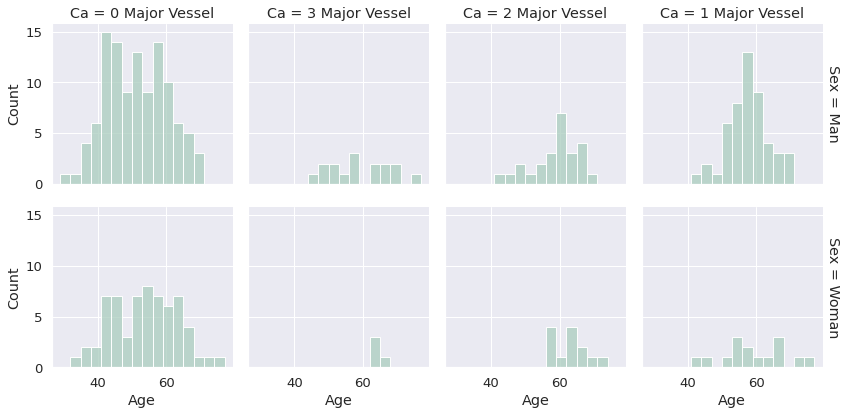

In [ ]:
#Ca-Age-Sex function calls
df['Ca'].replace([0,1,2,3],['0 Major Vessel','1 Major Vessel','2 Major Vessel','3 Major Vessel'],inplace=True)
sns.displot(df, x="Age", col="Ca", row="Sex", binwidth=3, height=3, facet_kws=dict(margin_titles=True), color = "#AACDBE")

11-) AGE-SEX-Thal Comparison Graphs

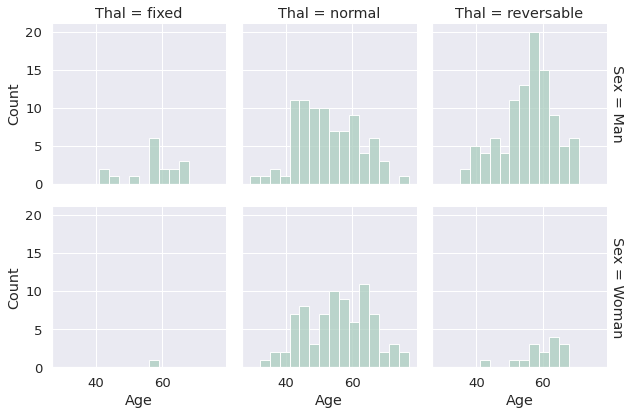

In [ ]:
#Thal-Age-Sex function calls
df['Thal'].replace([1,2,3],['normal','fixed','reversable'],inplace=True)
#Thal 0 value should be deleted here
sns.displot(df, x="Age", col="Thal", row="Sex", binwidth=3, height=3, facet_kws=dict(margin_titles=True), color = "#AACDBE")

<h3>Analysing & Visualysing the relationship between each attribute (without AHD) and Chest Pain</h3>

Different from the previous visualisations, AHD data is not regarded in the below visualisations.


Age / ChestPain

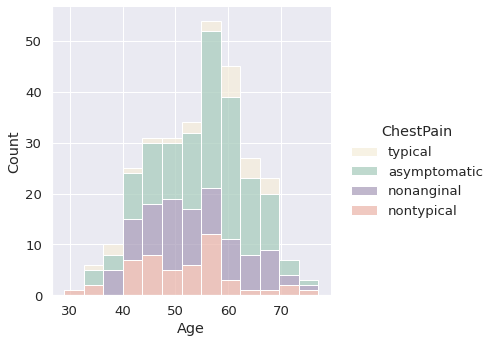

In [ ]:
#Age-ChestPain
sns.displot(data=df, x="Age", hue="ChestPain", multiple="stack", palette = ["#F5EEDC", "#AACDBE", "#AB9FBB", "#ECB8AC"])

Sex / ChestPain

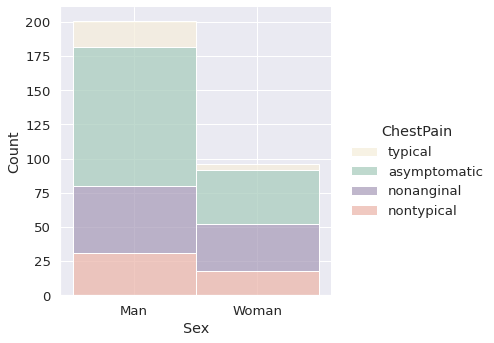

In [ ]:
#Sex-ChestPain
sns.displot(data=df, x="Sex", hue="ChestPain", multiple="stack", palette = ["#F5EEDC", "#AACDBE", "#AB9FBB", "#ECB8AC"])

RestBP / ChestPain

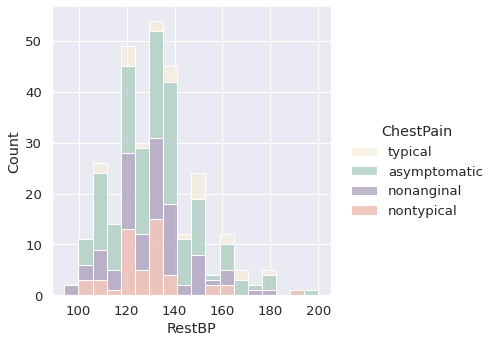

In [ ]:
#RestBP-ChestPain
sns.displot(data=df, x="RestBP", hue="ChestPain", multiple="stack", palette = ["#F5EEDC", "#AACDBE", "#AB9FBB", "#ECB8AC"])

Chol / ChestPain

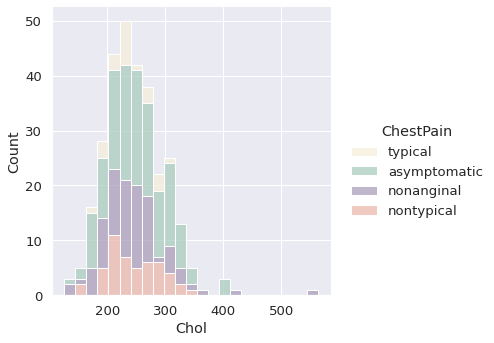

In [ ]:
#Chol-ChestPain
sns.displot(data=df, x="Chol", hue="ChestPain", multiple="stack", palette = ["#F5EEDC", "#AACDBE", "#AB9FBB", "#ECB8AC"])

Fbs / ChestPain

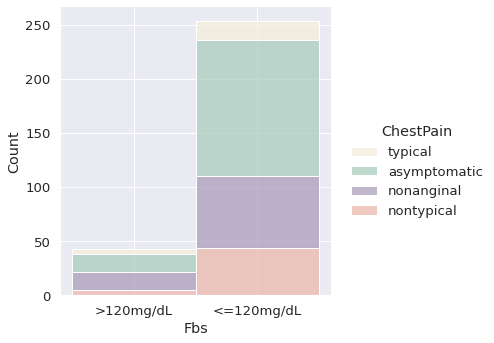

In [ ]:
#Fbs-ChestPain
df['Fbs'].replace([0,1],['<=120mg/dL','>120mg/dL'],inplace=True)
sns.displot(data=df, x="Fbs", hue="ChestPain", multiple="stack", palette = ["#F5EEDC", "#AACDBE", "#AB9FBB", "#ECB8AC"])

RestECG / ChestPain

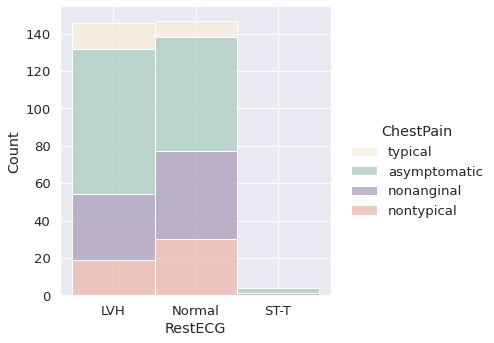

In [ ]:
#RestECG-ChestPain
sns.displot(data=df, x="RestECG", hue="ChestPain", multiple="stack", palette = ["#F5EEDC", "#AACDBE", "#AB9FBB", "#ECB8AC"])

MaxHR / ChestPain

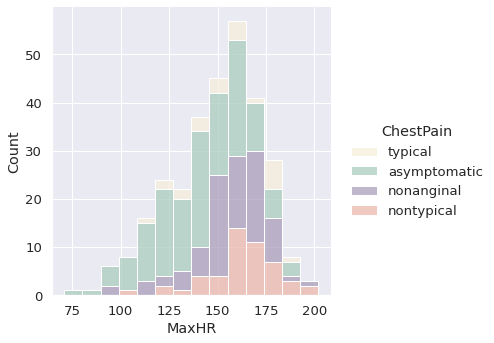

In [ ]:
#MaxHR-ChestPain
sns.displot(data=df, x="MaxHR", hue="ChestPain", multiple="stack", palette = ["#F5EEDC", "#AACDBE", "#AB9FBB", "#ECB8AC"])

ExAng / ChestPain

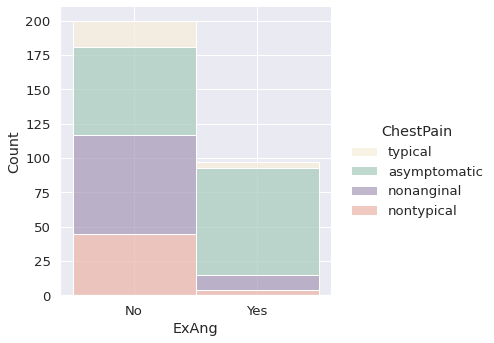

In [ ]:
#ExAng-ChestPain
df['ExAng'].replace([0,1],['No','Yes'],inplace=True)
sns.displot(data=df, x="ExAng", hue="ChestPain", multiple="stack", palette = ["#F5EEDC", "#AACDBE", "#AB9FBB", "#ECB8AC"])

Oldpeak / ChestPain

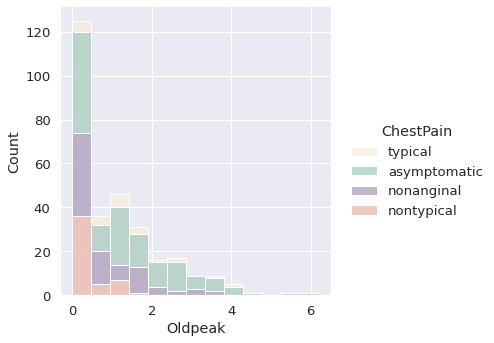

In [ ]:
#Oldpeak-ChestPain
sns.displot(data=df, x="Oldpeak", hue="ChestPain", multiple="stack", palette = ["#F5EEDC", "#AACDBE", "#AB9FBB", "#ECB8AC"])

Slope / Chestpain

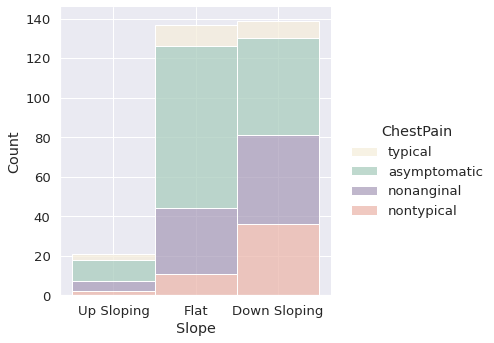

In [ ]:
#Slope-ChestPain

sns.displot(data=df, x="Slope", hue="ChestPain", multiple="stack", palette = ["#F5EEDC", "#AACDBE", "#AB9FBB", "#ECB8AC"])

Ca / ChestPain

<Figure size 144x144 with 0 Axes>

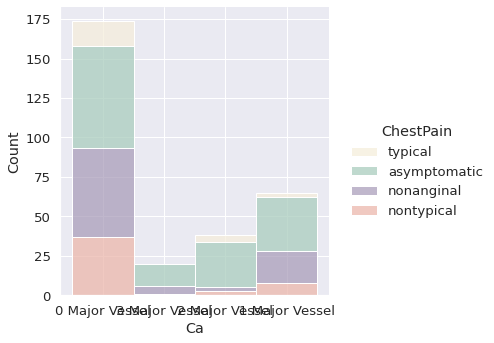

In [ ]:
#Ca-ChestPain

plt.figure(figsize=(2,2))
sns.displot(data=df, x="Ca", hue="ChestPain", multiple="stack", palette = ["#F5EEDC", "#AACDBE", "#AB9FBB", "#ECB8AC"])

Thal / ChestPain

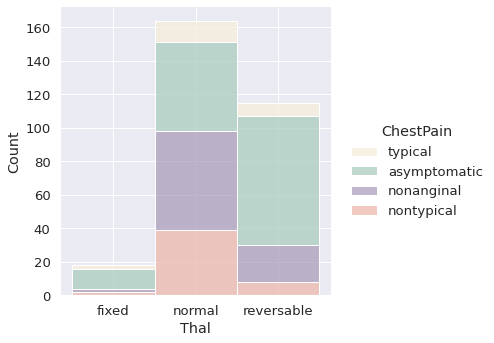

In [ ]:
#Thal -ChestPain

sns.displot(data=df, x="Thal", hue="ChestPain", multiple="stack", palette = ["#F5EEDC", "#AACDBE", "#AB9FBB", "#ECB8AC"])

## Part 1.2 - Visualisations for Dataset 2

As stated in the Datasets part, below are the visualisations for various diseases and their reported symptoms.

In [ ]:
path_prefix = "./drive/MyDrive/ColabNotebooks/CS210/Heart-Disease-Proj/Data-Sets/DataSet-2"
#path_prefix = "./drive/MyDrive/Data-Sets"
#path_prefix = "./drive/My Drive/Heart-Disease-Proj/Data-Sets/DataSet-2"

fname = "DataSet-2.csv"

df2 = pd.read_csv(join(path_prefix, fname))

def diseaseSymptom(disease, df2):
  df2 = df2[df2['Disease'] == disease]

  newFrame = df2

  for index in range(len(df2.columns)-1, -1, -1):
      if df2.iloc[:, index].isnull().all():
          newFrame = df2.drop(df2.columns[index],axis=1)

  newFrame = newFrame.fillna('nan')

  symptomDict = {}
  heartDiseaseCount = 0

  for rowNum, row in newFrame.iterrows():
      heartDiseaseCount += 1
      for columnNum, value in row.items():
          if value != disease and value != 'nan':
              if value.lstrip() in symptomDict.keys():
                  symptomDict[value.lstrip()] += 1
              else:
                  symptomDict[value.lstrip()] = 1

  return symptomDict, heartDiseaseCount


##1-) Graph Showing the Symptoms of Heart Attack

Symptoms of Heart Attack:

{'vomiting': 108, 'breathlessness': 108, 'sweating': 108, 'chest_pain': 114}


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:



Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.




Text(0.5, 1.0, 'Symptoms of Heart Attack')

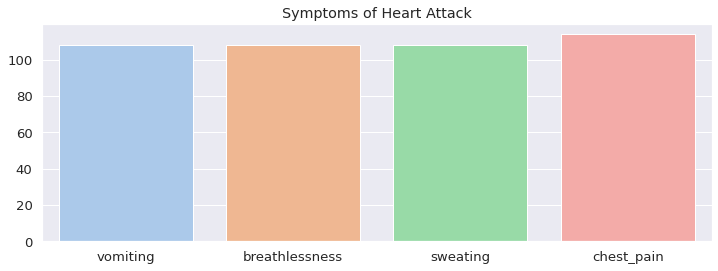

In [ ]:
print("Symptoms of Heart Attack:")
heartAttackDict, countOfHeartAttack = diseaseSymptom('Heart attack', df2)
print(heartAttackDict)
keys = list(heartAttackDict.keys())
values = list(heartAttackDict.values())

plt.figure(figsize=(12,4))
sns.barplot(keys, values, palette = "pastel")
plt.title('Symptoms of Heart Attack')

##2-) Graph Showing the Symptoms of Gastroenteritis

Symptoms of Gastroenteritis:

{'vomiting': 108, 'sunken_eyes': 108, 'dehydration': 108, 'diarrhoea': 114}


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:



Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.




Text(0.5, 1.0, 'Symptoms of Gastroenteritis')

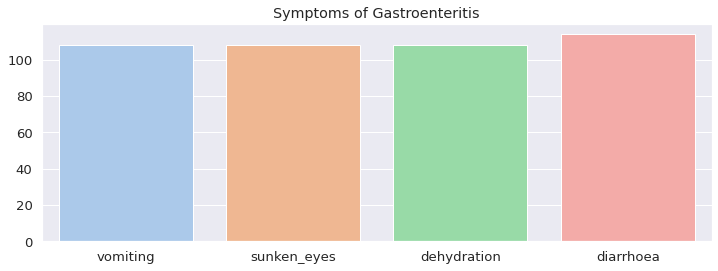

In [ ]:
print("Symptoms of Gastroenteritis:")
gasDict, numOfGas = diseaseSymptom('Gastroenteritis', df2)
print(gasDict)
keys = list(gasDict.keys())
values = list(gasDict.values())

plt.figure(figsize=(12,4))
sns.barplot(keys, values, palette = "pastel")
plt.title('Symptoms of Gastroenteritis' )

##3-) Graph Showing the Symptoms of Bronchial Asthma

Symptoms of Bronchial Asthma:

{'fatigue': 108, 'cough': 108, 'high_fever': 114, 'breathlessness': 114, 'family_history': 114, 'mucoid_sputum': 114}


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:



Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.




Text(0.5, 1.0, 'Symptoms of Bronchial Asthma')

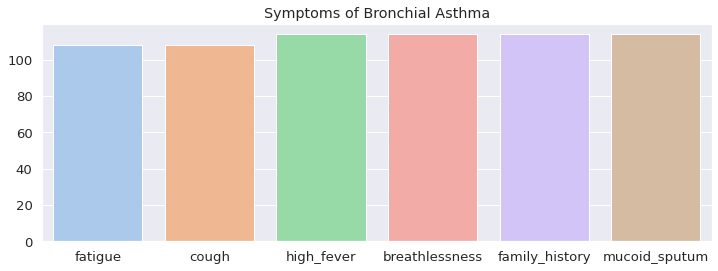

In [ ]:
print("Symptoms of Bronchial Asthma:")
astDict, numOfAsthma = diseaseSymptom('Bronchial Asthma', df2)
print(astDict)
keys = list(astDict.keys())
values = list(astDict.values())

plt.figure(figsize=(12,4))
sns.barplot(keys, values, palette = "pastel")
plt.title('Symptoms of Bronchial Asthma' )

<h2> Planned Future Work </h2>


Planned Future Work of the project can be summarised as below:

<h3>•	Introduction of a New Dataset</h3>
In order to specify “the most prominent symptoms/indicators of heart diseases” as precisely as possible, another dataset can be utilized to either introduce new indicators or to redetermine the scope of the project. Inclusion of a new dataset will be decided on “Statistical Analysis & Hypothesis Testing” phase of the project.

<h3>•	Filtering the Attributes by Their Ease of Diagnosis / Tracing Processes</h3>
Since the projects objective is to “create a more approachable process of early diagnosis”, attributes will be filtered out by their “accessibility”. Signifying widely accessible attributes such as Cholesterol (common in blood tests) or RestECG (a supported feature in most smartwatches) is of importance.

<h3>•	Statistical Analysis & Hypothesis Testing</h3>

With the purpose of statistically analysing the visualisations presented thus far, statistical tests will be performed on the final & cleaned data. All attributes’ correlations to heart disease – both exclusively and in groups- will be examined.

<h3>•	Machine Learning</h3>

Final part of the project will utilize machine learning, of which the details are currently undecided. In this part, heart disease prediction with selected attributes will be the objective and various machine learning models will be applied and compared in detail to obtain the optimal solution(s). 


# Part 2 - Statistical Analysis & Hypothesis Testing

This phase of the project consists of various hypothesis tests conducted on both Categorical and Numerical data found in the two utilized datasets.



As the ultimate goal of the project is to reduce the number of symptoms that are sought for the most for Heart Disease prediction, we are looking for parameters that are correlated the most to AHD.



Such statistical analysis utilizes Z-test, as the NULL Hypothesis of no correlation is examined by the p values. However, due to the different natures of symptom data, types of Z-tests are grouped differently in the following tests.



Lastly, the significance level for the Hypothesis Testing has been evaluated at 2% as the widely used 5% level was not selective enough. This is due to the bias of the given parameters to AHD as they are all scientifically expected to be correlated.

<h5>Below is a heatmap for showing correlation between variables in the dataset and the corresponding correlation value, as previously visualised in the Data Visualisation part.</h5>


<class 'pandas.core.frame.DataFrame'>

Int64Index: 297 entries, 1 to 302

Data columns (total 11 columns):

 #   Column   Non-Null Count  Dtype  

---  ------   --------------  -----  

 0   Age      297 non-null    int64  

 1   RestBP   297 non-null    int64  

 2   Chol     297 non-null    int64  

 3   Fbs      297 non-null    object 

 4   RestECG  297 non-null    object 

 5   MaxHR    297 non-null    int64  

 6   ExAng    297 non-null    object 

 7   Oldpeak  297 non-null    float64

 8   Slope    297 non-null    object 

 9   Ca       297 non-null    object 

 10  AHD      297 non-null    int64  

dtypes: float64(1), int64(5), object(5)

memory usage: 35.9+ KB


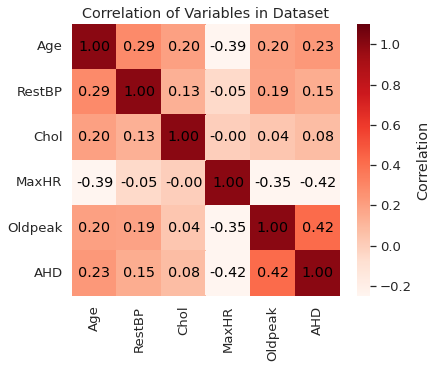

In [ ]:
diseaseCorr = df.loc[:, ~df.columns.isin(['Sex', 'ChestPain', 'Thal'])].copy()
diseaseCorr['AHD'].replace(['No','Yes'],[0,1],inplace=True)
diseaseCorr = diseaseCorr.astype({'AHD': 'int'})
diseaseCorr.info()

correlation = diseaseCorr.corr()
correlation = correlation.round(decimals= 2)
fig = plt.figure(figsize=(6,5))
plt.title('Correlation of Variables in Dataset')
heatmap = sns.heatmap(correlation, cmap='Reds', annot= True, vmin=-0.25, vmax=1.1, fmt= '.2f', cbar_kws={'label': 'Correlation'}, annot_kws={'color': 'black'})

Correlations of Variables in the Datasets in regards to Heart Disease

Age 0.22

RestBP 0.15
 
Chol 0.09

Fbs 0.03

RestECG 0.17

MaxHR -0.42

ExAng 0.43

Oldpeak 0.42

Slope 0.34

Ca 0.46

AHD 1.00


In [ ]:
import scipy.stats

<h5>Below is the dataframe consisting of ALL Patients, for further analysis with numerical data</h5>


In [ ]:
df.describe()

,Age,RestBP,Chol,MaxHR,Oldpeak
count,297.000000,297.000000,297.000000,297.000000,297.000000
mean,54.542088,131.693603,247.350168,149.599327,1.055556
std,9.049736,17.762806,51.997583,22.941562,1.166123
min,29.000000,94.000000,126.000000,71.000000,0.000000
25%,48.000000,120.000000,211.000000,133.000000,0.000000
50%,56.000000,130.000000,243.000000,153.000000,0.800000
75%,61.000000,140.000000,276.000000,166.000000,1.600000
max,77.000000,200.000000,564.000000,202.000000,6.200000


<h5>Below is the dataframe consisting of patients with Positive AHD, for further analysis with numerical data</h5>

In [ ]:
df['AHD'].replace([0,1],['No','Yes'],inplace=True)

In [ ]:
AHD_pos_df = df.loc[df["AHD"] == "Yes"]

In [ ]:
AHD_neg_df = df.loc[df["AHD"] == "No"]

In [ ]:
AHD_pos_df.info()
AHD_pos_df.describe()

<class 'pandas.core.frame.DataFrame'>

Int64Index: 137 entries, 2 to 302

Data columns (total 14 columns):

 #   Column     Non-Null Count  Dtype  

---  ------     --------------  -----  

 0   Age        137 non-null    int64  

 1   Sex        137 non-null    object 

 2   ChestPain  137 non-null    object 

 3   RestBP     137 non-null    int64  

 4   Chol       137 non-null    int64  

 5   Fbs        137 non-null    object 

 6   RestECG    137 non-null    object 

 7   MaxHR      137 non-null    int64  

 8   ExAng      137 non-null    object 

 9   Oldpeak    137 non-null    float64

 10  Slope      137 non-null    object 

 11  Ca         137 non-null    object 

 12  Thal       137 non-null    object 

 13  AHD        137 non-null    object 

dtypes: float64(1), int64(4), object(9)

memory usage: 16.1+ KB


,Age,RestBP,Chol,MaxHR,Oldpeak
count,137.000000,137.000000,137.000000,137.000000,137.000000
mean,56.759124,134.635036,251.854015,139.109489,1.589051
std,7.899670,18.896730,49.679937,22.710673,1.305006
min,35.000000,100.000000,131.000000,71.000000,0.000000
25%,53.000000,120.000000,218.000000,125.000000,0.600000
50%,58.000000,130.000000,253.000000,142.000000,1.400000
75%,62.000000,145.000000,284.000000,157.000000,2.500000
max,77.000000,200.000000,409.000000,195.000000,6.200000


## Part 2.1 - Numerical Data and AHD Correlation Hypothesis Testing

Methodology is to use the Mean and Standard Deviation values of the symptom in ALL AHD cases & Mean of the symptom in Positive AHD cases.

This gives us the sample mean distribution and Standard Error for the Z-value is calculated by Standard Deviation / (N)^1/2 , where N is the Mean Sample Size.

As with all cases the Null Hypothesis is no correlation between the symptom & AHD while the Alternative Hypothesis states a correlation, either positive or negative.

Findings are reported below.

<h3>Age / AHD Correlation</h3>

ALL -> Age Mean = 54.438944, Age std = 9.038662	

Positive -> Age Mean = 56.759124

Mean Sample Size = 137

Z = (56.759124 - 54.438944) / (9.038662 / (137^(1/2))) = 3.00454 is the Z value of the Sample Mean Distribution



In [ ]:
scipy.stats.norm.sf(abs(3.00454))
# is the p-value, as the significance level is 0.02, we reject the NULL hypothesis

0.0013299139095231793

<h3>RESTBP / AHD Correlation</h3>

ALL -> RESTBP Mean = 131.689769, RESTBP std = 17.599748	

Positive -> RESTBP Mean = 134.635036

Mean Sample Size = 137

Z = (134.635036 - 131.689769) / (17.599748 / (137^(1/2))) = 1.958748 is the Z value of the Sample Mean Distribution


In [ ]:
scipy.stats.norm.sf(abs(1.958748))
# is the p-value, as the significance level is 0.02, we FAIL TO reject the NULL hypothesis

0.02507115303913927

<h3>CHOL / AHD Correlation</h3>
ALL -> CHOL Mean = 246.693069, CHOL std = 51.776918

Positive -> CHOL Mean = 251.854015

Mean Sample Size = 137

Z = (251.854015 - 246.693069) / (51.776918 / (137^(1/2))) = 1.166684 is the Z value of the Sample Distribution

In [ ]:
scipy.stats.norm.sf(abs(1.166684))
# is the p-value, as the significance level is 0.02, we FAIL TO reject the NULL hypothesis

# As a sidenote, this finding is unexpected by our scientific research in the field, however it is statistically correct therefore we accept this finding.

0.12166900329923375

<h3>MaxHR / AHD Correlation</h3>

ALL -> MaxHR Mean = 149.607261, MaxHR std = 22.875003

Positive -> MaxHR Mean = 139.109489

Mean Sample Size = 137

Z = (139.109489 - 149.607261) / (22.875003 / (137^(1/2))) = -5.371508



In [ ]:
scipy.stats.norm.sf(abs(-5.371508))
# is the p-value, as the significance level is 0.02, we reject the NULL hypothesis

3.904045180548233e-08

<h3>OldPeak / AHD Correlation</h3>

ALL -> OldPeak Mean = 1.039604, OldPeak std = 1.161075

Positive -> MaxHR Mean = 1.589051

Mean Sample Size = 137

z = (1.589051 - 1.039604) / (1.161075 / (137^(1/2))) = 5.53893


In [ ]:
scipy.stats.norm.sf(abs(5.53893))
# is the p-value, as the significance level is 0.02, we reject the NULL hypothesis

1.521626218985208e-08

## Part 2.2 - Categorical Data and AHD Correlation Hypothesis Testing

Methodology is to use the The Sampling Distribution of the Sample Proportion as the categorical data does not yield a useful Mean and STD value as it was the case with the numerical data.

The Sample Proportion Mean is expected to be 0.5, as the proportion values strictly between 0 & 1 and the standard deviation is = (p*(1-p)/N)^1/2 where p is the ratio of the symptom under investigation and N is the Proportion Sample Size.

As with all cases the Null Hypothesis is no correlation between the symptom & AHD while the Alternative Hypothesis states a correlation, either positive or negative.

Findings are reported below.

<h3>Sex / AHD [ALL]</h3>

In [ ]:
AHD_pos_male_df = AHD_pos_df.loc[AHD_pos_df["Sex"] == "Man"]
AHD_pos_female_df = AHD_pos_df.loc[AHD_pos_df["Sex"] == "Woman"]
AHD_neg_male_df = AHD_neg_df.loc[AHD_neg_df["Sex"] == "Man"]
AHD_neg_female_df = AHD_neg_df.loc[AHD_neg_df["Sex"] == "Woman"]

In [ ]:
AHD_pos_male_df.describe()

,Age,RestBP,Chol,MaxHR,Oldpeak
count,112.000000,112.000000,112.000000,112.000000,112.000000
mean,56.241071,131.964286,246.428571,138.205357,1.549107
std,8.358246,17.367739,45.670917,23.225157,1.229810
min,35.000000,100.000000,131.000000,71.000000,0.000000
25%,51.000000,120.000000,212.000000,124.750000,0.600000
50%,58.000000,130.000000,248.500000,140.500000,1.400000
75%,61.000000,140.000000,282.000000,156.500000,2.425000
max,77.000000,192.000000,353.000000,195.000000,5.600000


In [ ]:
AHD_pos_female_df.describe()

,Age,RestBP,Chol,MaxHR,Oldpeak
count,25.000000,25.000000,25.000000,25.000000,25.000000
mean,59.080000,146.600000,276.160000,143.160000,1.768000
std,4.864155,21.118712,59.884389,20.175645,1.617024
min,43.000000,108.000000,164.000000,97.000000,0.000000
25%,57.000000,130.000000,236.000000,133.000000,0.200000
50%,60.000000,140.000000,268.000000,146.000000,1.400000
75%,62.000000,158.000000,307.000000,157.000000,2.800000
max,66.000000,200.000000,409.000000,174.000000,6.200000


In [ ]:
AHD_neg_female_df.describe()

,Age,RestBP,Chol,MaxHR,Oldpeak
count,71.000000,71.000000,71.000000,71.000000,71.000000
mean,54.577465,128.746479,257.323944,154.577465,0.561972
std,10.336706,16.654230,66.506879,18.812353,0.649036
min,34.000000,94.000000,141.000000,96.000000,0.000000
25%,46.000000,119.000000,210.500000,148.500000,0.000000
50%,54.000000,130.000000,250.000000,159.000000,0.300000
75%,63.500000,140.000000,291.000000,167.500000,1.050000
max,76.000000,180.000000,564.000000,192.000000,2.600000


In [ ]:
AHD_neg_male_df.describe()

,Age,RestBP,Chol,MaxHR,Oldpeak
count,89.000000,89.000000,89.000000,89.000000,89.000000
mean,51.101124,129.516854,232.460674,161.775281,0.628090
std,8.626130,16.233462,37.757316,18.720888,0.884589
min,29.000000,94.000000,126.000000,105.000000,0.000000
25%,44.000000,120.000000,207.000000,150.000000,0.000000
50%,52.000000,130.000000,232.000000,163.000000,0.200000
75%,57.000000,140.000000,253.000000,178.000000,1.200000
max,70.000000,178.000000,325.000000,202.000000,4.200000


AHD Positive Male Count = 112 &
AHD Negative Male Count = 89

112/(112+89) = 0.55721393034 is the Pos Male / Male Ratio


AHD Positive Female Count = 25 &
AHD Negative Female Count = 71

25 / (25+71) = 0.26041666666 is the Pos Female / Female Ratio

<h3>Sex / AHD for Male Correlation</h3>

Population Mean is assumed to be 0.5 as the values are proportions between 0 & 1

Proportion Distribution Standard Deviation Formula = ((p*(1-p))/n)^(1/2)

STD of Positive Male Proportion = ((0.55721393034*(1-0.55721393034))/201)^(1/2)
= 0.035035629780

Z = (0.55721393034 - 0.5) / 0.035035629780 = 1.633021


In [ ]:
scipy.stats.norm.sf(abs(1.633021))
# is the p-value, as the significance level is 0.02, we FAIL TO reject the NULL hypothesis

0.05123229003592604

<h3>Sex / AHD for Female Correlation</h3>

Population Mean is assumed to be 0.5 as the values are proportions between 0 & 1

Proportion Distribution Standard Deviation Formula = ((p*(1-p))/n)^(1/2)

STD of Positive Female Proportion = ((0.26041666666*(1-0.26041666666))/96)^(1/2)
= 0.044791161980

Z = (0.26041666666 - 0.5) / 0.044791161980 = -5.348897

In [ ]:
scipy.stats.norm.sf(abs(-5.348897))
# is the p-value, as the significance level is 0.02, we reject the NULL hypothesis

4.424594153324922e-08

In [ ]:
#path_prefix = './drive/MyDrive/Heart-Disease-Proj/Data-Sets'
path_prefix = "./drive/MyDrive/ColabNotebooks/CS210/Heart-Disease-Proj/Data-Sets"
fname = "DataSet-5-Main.csv"
df = pd.read_csv(join(path_prefix, fname))
AHD_pos_df = df.loc[df["AHD"] == "Yes"]
AHD_neg_df = df.loc[df["AHD"] == "No"]

<h3>Fbs / AHD [ALL]</h3>

Fbs has two values, 0 & 1; hence we have 4 groups

Fbs 0 & AHD Positive

Fbs 0 & AHD Negative

Fbs 1 & AHD Positive

Fbs 1 & AHD Negative

In [ ]:
AHD_pos_Fbs0_df = AHD_pos_df.loc[AHD_pos_df["Fbs"] == 0]
AHD_pos_Fbs1_df = AHD_pos_df.loc[AHD_pos_df["Fbs"] == 1]
AHD_neg_Fbs0_df = AHD_neg_df.loc[AHD_neg_df["Fbs"] == 0]
AHD_neg_Fbs1_df = AHD_neg_df.loc[AHD_neg_df["Fbs"] == 1]

In [ ]:
AHD_pos_Fbs0_df.describe()

,Age,Sex,RestBP,Chol,Fbs,RestECG,MaxHR,ExAng,Oldpeak,Slope,Ca
count,117.000000,117.000000,117.000000,117.000000,117.0,117.000000,117.000000,117.000000,117.000000,117.000000,117.000000
mean,56.393162,0.837607,132.880342,250.564103,0.0,1.136752,138.957265,0.529915,1.576923,1.803419,1.076923
std,8.087834,0.370397,17.653837,50.472489,0.0,0.981782,22.996399,0.501251,1.335935,0.560777,1.009898
min,35.000000,0.000000,100.000000,131.000000,0.0,0.000000,71.000000,0.000000,0.000000,1.000000,0.000000
25%,52.000000,1.000000,120.000000,216.000000,0.0,0.000000,125.000000,0.000000,0.400000,1.000000,0.000000
50%,58.000000,1.000000,130.000000,249.000000,0.0,2.000000,141.000000,1.000000,1.400000,2.000000,1.000000
75%,62.000000,1.000000,145.000000,283.000000,0.0,2.000000,158.000000,1.000000,2.500000,2.000000,2.000000
max,77.000000,1.000000,192.000000,409.000000,0.0,2.000000,195.000000,1.000000,6.200000,3.000000,3.000000


In [ ]:
AHD_pos_Fbs1_df.describe()

,Age,Sex,RestBP,Chol,Fbs,RestECG,MaxHR,ExAng,Oldpeak,Slope,Ca
count,22.000000,22.000000,22.000000,22.000000,22.0,22.000000,22.000000,22.000000,22.000000,22.000000,21.000000
mean,57.863636,0.727273,143.545455,256.318182,1.0,1.363636,140.863636,0.636364,1.559091,1.954545,1.476190
std,7.133392,0.455842,22.206235,44.633306,0.0,0.953463,20.737120,0.492366,1.136268,0.575473,1.030488
min,43.000000,0.000000,117.000000,176.000000,1.0,0.000000,90.000000,0.000000,0.000000,1.000000,0.000000
25%,56.000000,0.250000,130.000000,225.750000,1.0,0.000000,133.250000,0.000000,1.000000,2.000000,1.000000
50%,58.000000,1.000000,134.000000,255.000000,1.0,2.000000,143.500000,1.000000,1.400000,2.000000,2.000000
75%,62.750000,1.000000,159.000000,286.750000,1.0,2.000000,154.250000,1.000000,2.125000,2.000000,2.000000
max,68.000000,1.000000,200.000000,341.000000,1.0,2.000000,174.000000,1.000000,4.000000,3.000000,3.000000


In [ ]:
AHD_neg_Fbs0_df.describe()

,Age,Sex,RestBP,Chol,Fbs,RestECG,MaxHR,ExAng,Oldpeak,Slope,Ca
count,141.000000,141.000000,141.000000,141.000000,141.0,141.000000,141.00000,141.000000,141.000000,141.000000,138.000000
mean,52.000000,0.531915,128.347518,243.092199,0.0,0.815603,158.58156,0.148936,0.588652,1.404255,0.224638
std,9.750458,0.500759,15.882149,53.150447,0.0,0.982728,18.95640,0.357295,0.788769,0.572946,0.553926
min,29.000000,0.000000,94.000000,141.000000,0.0,0.000000,105.00000,0.000000,0.000000,1.000000,0.000000
25%,44.000000,0.000000,120.000000,209.000000,0.0,0.000000,149.00000,0.000000,0.000000,1.000000,0.000000
50%,52.000000,1.000000,130.000000,235.000000,0.0,0.000000,161.00000,0.000000,0.200000,1.000000,0.000000
75%,58.000000,1.000000,138.000000,268.000000,0.0,2.000000,172.00000,0.000000,1.100000,2.000000,0.000000
max,76.000000,1.000000,180.000000,564.000000,0.0,2.000000,202.00000,1.000000,4.200000,3.000000,3.000000


In [ ]:
AHD_neg_Fbs1_df.describe()

,Age,Sex,RestBP,Chol,Fbs,RestECG,MaxHR,ExAng,Oldpeak,Slope,Ca
count,23.000000,23.000000,23.000000,23.000000,23.0,23.000000,23.000000,23.000000,23.000000,23.000000,23.000000
mean,56.173913,0.739130,134.782609,239.869565,1.0,0.956522,157.130435,0.086957,0.573913,1.434783,0.565217
std,7.049514,0.448978,17.412003,56.443298,0.0,1.021508,21.033100,0.288104,0.753909,0.727767,0.945135
min,42.000000,0.000000,101.000000,126.000000,1.0,0.000000,96.000000,0.000000,0.000000,1.000000,0.000000
25%,52.000000,0.500000,124.500000,206.500000,1.0,0.000000,148.500000,0.000000,0.000000,1.000000,0.000000
50%,54.000000,1.000000,132.000000,234.000000,1.0,0.000000,159.000000,0.000000,0.100000,1.000000,0.000000
75%,60.500000,1.000000,150.000000,260.000000,1.0,2.000000,171.500000,0.000000,1.000000,2.000000,1.000000
max,71.000000,1.000000,172.000000,417.000000,1.0,2.000000,194.000000,1.000000,2.400000,3.000000,3.000000


AHD Positive Fbs = 1 Count -> 22

AHD Negative Fbs = 1 Count -> 23

Positive Fbs1 / Fbs1 ratio =  22 / (22+23) = 0.4888


AHD Positive Fbs = 0 Count -> 117

AHD Negative Fbs = 0 Count -> 141 

Positive Fbs0 / Fbs0 ratio = 117 / (117+141) = 0.4534

<h3>Fbs / AHD for Fbs = 1 Correlation</h3>

Population mean is assumed to be 0.5 as the proportions are between 0 & 1

Proportion Distribution Standard Deviation Formula = ((p*(1-p))/n)^(1/2)

For ratio p = 0.4888 and N = 45

Std = ((0.4888*(1-0.4888))/45)^(1/2) = 0.0745169

Z = (0.4888 - 0.5) / 0.0745169 = -0.1503

In [ ]:
scipy.stats.norm.sf(abs(-0.1503))
# is the p-value, as the significance level is 0.02, we FAIL TO reject the NULL hypothesis

0.44026396649495575

<h3>Fbs / AHD for Fbs = 0 Correlation</h3>

Population mean is assumed to be 0.5 as the proportions are between 0 & 1

Proportion Distribution Standard Deviation Formula = ((p*(1-p))/n)^(1/2)

For ratio p = 0.4534, N = 258

Std = ((0.4534*(1-0.4534))/258)^(1/2) = 0.0309932

Z = (0.4534 - 0.5) / 0.0309932 = -1.5035


In [ ]:
scipy.stats.norm.sf(abs(-1.5035))
# is the p-value, as the significance level is 0.02, we FAIL TO reject the NULL hypothesis

0.0663550784691407

<h3>RestECG / AHD [ALL]</h3>

RestECG has three values; 0, 1 & 2 
Hence we have 6 groups

RestECG 0 & AHD Positive

RestECG 0 & AHD Negative

RestECG 1 & AHD Positive

RestECG 1 & AHD Negative

RestECG 2 & AHD Positive

RestECG 2 & AHD Negative

In [ ]:
AHD_pos_ECG0_df = AHD_pos_df.loc[AHD_pos_df["RestECG"] == 0]
AHD_pos_ECG1_df = AHD_pos_df.loc[AHD_pos_df["RestECG"] == 1]
AHD_pos_ECG2_df = AHD_pos_df.loc[AHD_pos_df["RestECG"] == 2]
AHD_neg_ECG0_df = AHD_neg_df.loc[AHD_neg_df["RestECG"] == 0]
AHD_neg_ECG1_df = AHD_neg_df.loc[AHD_neg_df["RestECG"] == 1]
AHD_neg_ECG2_df = AHD_neg_df.loc[AHD_neg_df["RestECG"] == 2]

<h3>RestECG / AHD for RestECG = 0 Correlation</h3>

In [ ]:
AHD_neg_ECG0_df.describe()

,Age,Sex,RestBP,Chol,Fbs,RestECG,MaxHR,ExAng,Oldpeak,Slope,Ca
count,95.000000,95.000000,95.000000,95.000000,95.000000,95.0,95.000000,95.000000,95.000000,95.000000,92.000000
mean,51.452632,0.578947,127.536842,234.242105,0.126316,0.0,159.726316,0.115789,0.518947,1.326316,0.315217
std,9.315702,0.496347,16.421840,47.890548,0.333967,0.0,18.556665,0.321670,0.703683,0.554327,0.694236
min,34.000000,0.000000,94.000000,126.000000,0.000000,0.0,96.000000,0.000000,0.000000,1.000000,0.000000
25%,43.000000,0.000000,119.000000,201.000000,0.000000,0.0,150.500000,0.000000,0.000000,1.000000,0.000000
50%,52.000000,1.000000,128.000000,226.000000,0.000000,0.0,163.000000,0.000000,0.200000,1.000000,0.000000
75%,58.000000,1.000000,138.000000,263.000000,0.000000,0.0,172.500000,0.000000,0.850000,2.000000,0.000000
max,71.000000,1.000000,180.000000,354.000000,1.000000,0.0,194.000000,1.000000,3.500000,3.000000,3.000000


In [ ]:
AHD_pos_ECG0_df.describe()

,Age,Sex,RestBP,Chol,Fbs,RestECG,MaxHR,ExAng,Oldpeak,Slope,Ca
count,56.000000,56.000000,56.000000,56.000000,56.000000,56.0,56.000000,56.000000,56.000000,56.000000,56.000000
mean,55.660714,0.839286,131.500000,243.517857,0.125000,0.0,138.410714,0.571429,1.507143,1.821429,0.928571
std,8.373718,0.370591,16.372927,45.076900,0.333712,0.0,24.584383,0.499350,1.251887,0.542960,0.950735
min,35.000000,0.000000,100.000000,131.000000,0.000000,0.0,71.000000,0.000000,0.000000,1.000000,0.000000
25%,51.000000,1.000000,120.000000,217.750000,0.000000,0.0,122.750000,0.000000,0.525000,1.750000,0.000000
50%,57.000000,1.000000,130.000000,238.000000,0.000000,0.0,141.000000,1.000000,1.300000,2.000000,1.000000
75%,62.000000,1.000000,140.000000,267.500000,0.000000,0.0,160.000000,1.000000,2.000000,2.000000,2.000000
max,70.000000,1.000000,178.000000,353.000000,1.000000,0.0,182.000000,1.000000,5.600000,3.000000,3.000000


AHD Positive ECG0 Count -> 56

AHD Negative ECG0 Count -> 95

Positive ECG0 / ECG0 Ratio = 56 / (56+95) = 0.3708 

Population mean is assumed to be 0.5 as the proportions are between 0 & 1

Proportion Distribution Standard Deviation Formula = ((p*(1-p))/n)^(1/2)

For ratio p = 0.3708 and N = 151

Std = ((0.3708*(1-0.3708))/151)^(1/2) = 0.03930752923

Z = (0.3708 - 0.5) / 0.03930752923 = -3.2869

In [ ]:
scipy.stats.norm.sf(abs(-3.2869))
# is the p-value, as the significance level is 0.02, we reject the NULL hypothesis

0.0005064839905821988

<h3>RestECG / AHD for RestECG = 1 Correlation</h3>

In [ ]:
AHD_neg_ECG1_df.describe()

,Age,Sex,RestBP,Chol,Fbs,RestECG,MaxHR,ExAng,Oldpeak,Slope,Ca
count,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
mean,76.0,0.0,140.0,197.0,0.0,1.0,116.0,0.0,1.1,2.0,0.0
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,76.0,0.0,140.0,197.0,0.0,1.0,116.0,0.0,1.1,2.0,0.0
25%,76.0,0.0,140.0,197.0,0.0,1.0,116.0,0.0,1.1,2.0,0.0
50%,76.0,0.0,140.0,197.0,0.0,1.0,116.0,0.0,1.1,2.0,0.0
75%,76.0,0.0,140.0,197.0,0.0,1.0,116.0,0.0,1.1,2.0,0.0
max,76.0,0.0,140.0,197.0,0.0,1.0,116.0,0.0,1.1,2.0,0.0


In [ ]:
AHD_pos_ECG1_df.describe()

,Age,Sex,RestBP,Chol,Fbs,RestECG,MaxHR,ExAng,Oldpeak,Slope,Ca
count,3.000000,3.000000,3.000000,3.000000,3.0,3.0,3.000000,3.000000,3.000000,3.000000,3.000000
mean,56.000000,0.333333,140.666667,283.333333,0.0,1.0,129.000000,0.666667,3.266667,2.333333,1.333333
std,1.732051,0.577350,34.775470,67.987744,0.0,0.0,11.532563,0.577350,1.205543,0.577350,1.527525
min,55.000000,0.000000,114.000000,205.000000,0.0,1.0,117.000000,0.000000,2.000000,2.000000,0.000000
25%,55.000000,0.000000,121.000000,261.500000,0.0,1.0,123.500000,0.500000,2.700000,2.000000,0.500000
50%,55.000000,0.000000,128.000000,318.000000,0.0,1.0,130.000000,1.000000,3.400000,2.000000,1.000000
75%,56.500000,0.500000,154.000000,322.500000,0.0,1.0,135.000000,1.000000,3.900000,2.500000,2.000000
max,58.000000,1.000000,180.000000,327.000000,0.0,1.0,140.000000,1.000000,4.400000,3.000000,3.000000


AHD Positive ECG1 Count -> 3

AHD Negative ECG1 Count -> 1

Positive ECG1 / ECG1 Ratio = 3 / (3+1) = 0.75

However the data for ECG1 value is not sufficient to find a statistical correlation between itself and AHD, hence we move onto ECG2 Value without any statistical conclusion.

<h3>RestECG / AHD for RestECG = 2 Correlation</h3>

In [ ]:
AHD_neg_ECG2_df.describe()

,Age,Sex,RestBP,Chol,Fbs,RestECG,MaxHR,ExAng,Oldpeak,Slope,Ca
count,68.000000,68.000000,68.000000,68.000000,68.000000,68.0,68.000000,68.000000,68.000000,68.000000,68.000000
mean,53.823529,0.544118,131.485294,255.044118,0.161765,2.0,157.117647,0.176471,0.673529,1.514706,0.220588
std,9.316878,0.501753,15.796743,58.711903,0.370973,0.0,19.561254,0.384054,0.879725,0.634638,0.542124
min,29.000000,0.000000,100.000000,177.000000,0.000000,2.0,111.000000,0.000000,0.000000,1.000000,0.000000
25%,46.750000,0.000000,120.000000,220.500000,0.000000,2.0,147.750000,0.000000,0.000000,1.000000,0.000000
50%,53.000000,1.000000,130.000000,245.000000,0.000000,2.0,158.000000,0.000000,0.300000,1.000000,0.000000
75%,59.750000,1.000000,140.000000,269.250000,0.000000,2.0,170.500000,0.000000,1.225000,2.000000,0.000000
max,74.000000,1.000000,178.000000,564.000000,1.000000,2.0,202.000000,1.000000,4.200000,3.000000,3.000000


In [ ]:
AHD_pos_ECG2_df.describe()

,Age,Sex,RestBP,Chol,Fbs,RestECG,MaxHR,ExAng,Oldpeak,Slope,Ca
count,80.000000,80.000000,80.000000,80.000000,80.000000,80.0,80.000000,80.000000,80.000000,80.000000,79.000000
mean,57.325000,0.825000,136.487500,255.850000,0.187500,2.0,140.237500,0.525000,1.557500,1.812500,1.278481
std,7.747233,0.382364,19.654609,51.414449,0.392775,0.0,21.495507,0.502525,1.312913,0.575749,1.036967
min,35.000000,0.000000,100.000000,149.000000,0.000000,2.0,90.000000,0.000000,0.000000,1.000000,0.000000
25%,54.000000,1.000000,124.000000,222.000000,0.000000,2.0,125.750000,0.000000,0.475000,1.000000,0.000000
50%,58.000000,1.000000,132.000000,257.000000,0.000000,2.0,143.500000,1.000000,1.400000,2.000000,1.000000
75%,62.000000,1.000000,150.000000,286.500000,0.000000,2.0,155.250000,1.000000,2.525000,2.000000,2.000000
max,77.000000,1.000000,200.000000,409.000000,1.000000,2.0,195.000000,1.000000,6.200000,3.000000,3.000000


AHD Positive ECG2 Count -> 80

AHD Negative ECG2 Count -> 68

Positive ECG2 / ECG2 Ratio = 80 / (80+68) = 0.5405



Population mean is assumed to be 0.5 as the proportions are between 0 & 1

Proportion Distribution Standard Deviation Formula = ((p*(1-p))/n)^(1/2)

For ratio p = 0.5405 and N = 148

Std = ((0.5405*(1-0.5405))/148
)^(1/2) = 0.0409647

Z = (0.5405 - 0.5) / 0.0409647 = 0.9886

In [ ]:
scipy.stats.norm.sf(abs(0.9886))
# is the p-value, as the significance level is 0.02, we FAIL TO reject the NULL hypothesis

0.16142944310731677

<h3>ExAng / AHD [ALL]</h3>
RestECG has two values; 0 & 1
Hence we have 4 groups

ExAng 0 & AHD Positive

ExAng 0 & AHD Negative

ExAng 1 & AHD Positive

ExAng 1 & AHD Negative

In [ ]:
AHD_pos_ExAng0_df = AHD_pos_df.loc[AHD_pos_df["ExAng"] == 0]
AHD_pos_ExAng1_df = AHD_pos_df.loc[AHD_pos_df["ExAng"] == 1]
AHD_neg_ExAng0_df = AHD_neg_df.loc[AHD_neg_df["ExAng"] == 0]
AHD_neg_ExAng1_df = AHD_neg_df.loc[AHD_neg_df["ExAng"] == 1]

<h3>ExAng / AHD for ExAng 0 Correlation</h3>


In [ ]:
AHD_pos_ExAng0_df.describe()

,Age,Sex,RestBP,Chol,Fbs,RestECG,MaxHR,ExAng,Oldpeak,Slope,Ca
count,63.000000,63.000000,63.000000,63.000000,63.000000,63.000000,63.000000,63.0,63.000000,63.000000,63.000000
mean,57.095238,0.825397,133.936508,247.888889,0.126984,1.222222,146.476190,0.0,1.322222,1.698413,1.222222
std,7.562032,0.382677,18.170228,47.036400,0.335630,0.974587,24.144629,0.0,1.342055,0.585715,1.069284
min,39.000000,0.000000,100.000000,149.000000,0.000000,0.000000,71.000000,0.0,0.000000,1.000000,0.000000
25%,52.000000,1.000000,120.000000,218.500000,0.000000,0.000000,133.000000,0.0,0.050000,1.000000,0.000000
50%,58.000000,1.000000,132.000000,243.000000,0.000000,2.000000,152.000000,0.0,1.000000,2.000000,1.000000
75%,62.000000,1.000000,147.000000,281.500000,0.000000,2.000000,162.500000,0.0,2.000000,2.000000,2.000000
max,70.000000,1.000000,192.000000,407.000000,1.000000,2.000000,195.000000,0.0,6.200000,3.000000,3.000000


In [ ]:
AHD_neg_ExAng0_df.describe()

,Age,Sex,RestBP,Chol,Fbs,RestECG,MaxHR,ExAng,Oldpeak,Slope,Ca
count,141.000000,141.000000,141.000000,141.000000,141.000000,141.000000,141.000000,141.0,141.000000,141.000000,138.000000
mean,52.418440,0.546099,129.539007,242.964539,0.148936,0.801418,159.709220,0.0,0.576596,1.397163,0.282609
std,9.678515,0.499645,15.673234,55.329327,0.357295,0.979941,18.540511,0.0,0.780809,0.596172,0.661663
min,29.000000,0.000000,94.000000,126.000000,0.000000,0.000000,96.000000,0.0,0.000000,1.000000,0.000000
25%,44.000000,0.000000,120.000000,208.000000,0.000000,0.000000,150.000000,0.0,0.000000,1.000000,0.000000
50%,52.000000,1.000000,130.000000,235.000000,0.000000,0.000000,162.000000,0.0,0.200000,1.000000,0.000000
75%,59.000000,1.000000,140.000000,269.000000,0.000000,2.000000,172.000000,0.0,1.000000,2.000000,0.000000
max,76.000000,1.000000,178.000000,564.000000,1.000000,2.000000,202.000000,0.0,4.200000,3.000000,3.000000


Positive AHD ExAng0 Count -> 63

Negative AHD ExAng0 Count -> 141

Positive ExAng0 / ExAng0 Ratio = 63 / (63+141) = 0.3088

Population mean is assumed to be 0.5 as the proportions are between 0 & 1

Proportion Distribution Standard Deviation Formula = ((p*(1-p))/n)^(1/2)

For ratio p = 0.3088 & N = 204

Std = ((0.3088*(1-0.3088))/204)^(1/2) = 0.0323

Z = (0.3088 - 0.5) / 0.0323 = -5.9195

In [ ]:
scipy.stats.norm.sf(abs(-5.9195))
# is the p-value, as the significance level is 0.02, we reject the NULL hypothesis

1.6146091972415802e-09

<h3>ExAng / AHD for ExAng 1 Correlation</h3>


In [ ]:
AHD_pos_ExAng1_df.describe()

,Age,Sex,RestBP,Chol,Fbs,RestECG,MaxHR,ExAng,Oldpeak,Slope,Ca
count,76.000000,76.000000,76.000000,76.000000,76.000000,76.000000,76.000000,76.0,76.000000,76.000000,75.000000
mean,56.236842,0.815789,135.092105,254.447368,0.184211,1.131579,133.276316,1.0,1.782895,1.934211,1.066667
std,8.266992,0.390232,19.355742,51.549690,0.390232,0.984440,19.424108,0.0,1.239181,0.524990,0.977218
min,35.000000,0.000000,100.000000,131.000000,0.000000,0.000000,88.000000,1.0,0.000000,1.000000,0.000000
25%,52.750000,1.000000,122.750000,215.000000,0.000000,0.000000,120.000000,1.0,0.975000,2.000000,0.000000
50%,57.000000,1.000000,130.000000,256.000000,0.000000,2.000000,132.000000,1.0,1.800000,2.000000,1.000000
75%,61.000000,1.000000,142.500000,286.500000,0.000000,2.000000,144.250000,1.0,2.800000,2.000000,2.000000
max,77.000000,1.000000,200.000000,409.000000,1.000000,2.000000,182.000000,1.0,5.600000,3.000000,3.000000


In [ ]:
AHD_neg_ExAng1_df.describe()

,Age,Sex,RestBP,Chol,Fbs,RestECG,MaxHR,ExAng,Oldpeak,Slope,Ca
count,23.000000,23.000000,23.000000,23.000000,23.000000,23.000000,23.000000,23.0,23.000000,23.000000,23.000000
mean,53.608696,0.652174,127.478261,240.652174,0.086957,1.043478,150.217391,1.0,0.647826,1.478261,0.217391
std,8.542616,0.486985,19.455940,41.063818,0.288104,1.021508,21.506778,0.0,0.802196,0.593109,0.421741
min,40.000000,0.000000,94.000000,177.000000,0.000000,0.000000,105.000000,1.0,0.000000,1.000000,0.000000
25%,46.000000,0.000000,111.000000,212.000000,0.000000,0.000000,140.000000,1.0,0.000000,1.000000,0.000000
50%,53.000000,1.000000,130.000000,233.000000,0.000000,2.000000,154.000000,1.0,0.200000,1.000000,0.000000
75%,58.500000,1.000000,140.000000,262.000000,0.000000,2.000000,163.500000,1.0,1.300000,2.000000,0.000000
max,74.000000,1.000000,180.000000,354.000000,1.000000,2.000000,186.000000,1.0,3.000000,3.000000,1.000000


Positive AHD ExAng1 Count -> 76

Negative AHD ExAng1 Count -> 23

Positive ExAng1 / ExAng1 Ratio = 76 / (76+23) = 0.7676

Population mean is assumed to be 0.5 as the proportions are between 0 & 1

Proportion Distribution Standard Deviation Formula = ((p*(1-p))/n)^(1/2)

For ratio p = 0.7676 & N = 99

Std = ((0.7676*(1-0.7676))/99)^(1/2) = 0.0424490

Z = (0.7676 - 0.5) / 0.0424490 = 6.3040 

In [ ]:
scipy.stats.norm.sf(abs(6.3040))
# is the p-value, as the significance level is 0.02, we reject the NULL hypothesis

1.4503024616389753e-10

<h3>Slope / AHD [All]</h3>

Slope has three values; 1, 2 & 3

Hence we have 6 groups

Slope 1 & AHD Positive

Slope 1 & AHD Negative

Slope 2 & AHD Positive

Slope 2 & AHD Negative

Slope 3 & AHD Positive

Slope 3 & AHD Negative

In [ ]:
AHD_pos_Slope1_df = AHD_pos_df.loc[AHD_pos_df["Slope"] == 1]
AHD_pos_Slope2_df = AHD_pos_df.loc[AHD_pos_df["Slope"] == 2]
AHD_pos_Slope3_df = AHD_pos_df.loc[AHD_pos_df["Slope"] == 3]
AHD_neg_Slope1_df = AHD_neg_df.loc[AHD_neg_df["Slope"] == 1]
AHD_neg_Slope2_df = AHD_neg_df.loc[AHD_neg_df["Slope"] == 2]
AHD_neg_Slope3_df = AHD_neg_df.loc[AHD_neg_df["Slope"] == 3]

<h3>Slope / AHD for Slope 1 Correlation</h3>


In [ ]:
AHD_pos_Slope1_df.describe()

,Age,Sex,RestBP,Chol,Fbs,RestECG,MaxHR,ExAng,Oldpeak,Slope,Ca
count,36.000000,36.000000,36.000000,36.000000,36.000000,36.000000,36.000000,36.000000,36.000000,36.0,36.000000
mean,55.472222,0.916667,131.055556,249.388889,0.111111,1.222222,155.277778,0.361111,0.572222,1.0,1.083333
std,8.497012,0.280306,18.460683,48.029918,0.318728,0.988826,16.963172,0.487136,0.953373,0.0,0.967323
min,35.000000,0.000000,100.000000,149.000000,0.000000,0.000000,111.000000,0.000000,0.000000,1.0,0.000000
25%,50.500000,1.000000,117.750000,212.000000,0.000000,0.000000,144.000000,0.000000,0.000000,1.0,0.000000
50%,58.000000,1.000000,130.000000,248.500000,0.000000,2.000000,158.000000,0.000000,0.000000,1.0,1.000000
75%,60.250000,1.000000,140.000000,284.750000,0.000000,2.000000,162.500000,1.000000,0.800000,1.0,2.000000
max,77.000000,1.000000,192.000000,335.000000,1.000000,2.000000,195.000000,1.000000,4.000000,1.0,3.000000


In [ ]:
AHD_neg_Slope1_df.describe()

,Age,Sex,RestBP,Chol,Fbs,RestECG,MaxHR,ExAng,Oldpeak,Slope,Ca
count,106.000000,106.000000,106.000000,106.000000,106.000000,106.000000,106.000000,106.000000,106.000000,106.0,104.000000
mean,51.707547,0.584906,129.820755,244.358491,0.150943,0.716981,162.235849,0.122642,0.352830,1.0,0.326923
std,9.578713,0.495079,16.201586,49.492316,0.359694,0.963671,17.739679,0.329584,0.559967,0.0,0.674678
min,29.000000,0.000000,94.000000,126.000000,0.000000,0.000000,96.000000,0.000000,0.000000,1.0,0.000000
25%,44.000000,0.000000,120.000000,208.250000,0.000000,0.000000,155.250000,0.000000,0.000000,1.0,0.000000
50%,52.000000,1.000000,130.000000,235.500000,0.000000,0.000000,163.000000,0.000000,0.000000,1.0,0.000000
75%,58.000000,1.000000,140.000000,269.000000,0.000000,2.000000,173.000000,0.000000,0.600000,1.0,0.000000
max,74.000000,1.000000,180.000000,417.000000,1.000000,2.000000,202.000000,1.000000,2.300000,1.0,3.000000


Positive AHD Slope1 Count -> 36

Negative AHD Slope1 Count -> 106

Positive Slope1 / Slope1 Ratio = 36 / (36+106) = 0.2535

Population mean is assumed to be 0.5 as the proportions are between 0 & 1

Proportion Distribution Standard Deviation Formula = ((p*(1-p))/n)^(1/2)

For ratio p = 0.2535 & N = 142

Std= ((0.2535*(1-0.2535))/142
)^(1/2) = 0.0365056

Z = (0.2535 - 0.5) / 0.0365056 = -6.7523

In [ ]:
scipy.stats.norm.sf(abs(-6.7523))
# is the p-value, as the significance level is 0.02, we reject the NULL hypothesis

7.275979255411364e-12

<h3>Slope / AHD for Slope 2 Correlation</h3>

In [ ]:
AHD_pos_Slope2_df.describe()

,Age,Sex,RestBP,Chol,Fbs,RestECG,MaxHR,ExAng,Oldpeak,Slope,Ca
count,91.000000,91.000000,91.000000,91.000000,91.000000,91.000000,91.000000,91.000000,91.000000,91.0,90.000000
mean,57.000000,0.791209,135.142857,253.758242,0.164835,1.142857,133.483516,0.604396,1.732967,2.0,1.188889
std,7.859884,0.408697,17.751101,49.382035,0.373087,0.983999,21.682232,0.491689,1.050826,0.0,1.015547
min,35.000000,0.000000,100.000000,131.000000,0.000000,0.000000,71.000000,0.000000,0.000000,2.0,0.000000
25%,54.000000,1.000000,122.500000,222.000000,0.000000,0.000000,119.000000,0.000000,1.000000,2.0,0.000000
50%,58.000000,1.000000,132.000000,254.000000,0.000000,2.000000,132.000000,1.000000,1.800000,2.0,1.000000
75%,62.000000,1.000000,145.000000,283.000000,0.000000,2.000000,147.000000,1.000000,2.550000,2.0,2.000000
max,70.000000,1.000000,180.000000,409.000000,1.000000,2.000000,182.000000,1.000000,4.200000,2.0,3.000000


In [ ]:
AHD_neg_Slope2_df.describe()

,Age,Sex,RestBP,Chol,Fbs,RestECG,MaxHR,ExAng,Oldpeak,Slope,Ca
count,49.000000,49.000000,49.000000,49.000000,49.000000,49.000000,49.000000,49.000000,49.000000,49.0,48.000000
mean,54.428571,0.469388,126.448980,240.510204,0.081633,1.040816,150.081633,0.183673,0.863265,2.0,0.187500
std,9.269124,0.504234,15.420578,64.478395,0.276642,0.999149,19.140747,0.391230,0.752411,0.0,0.570787
min,39.000000,0.000000,100.000000,141.000000,0.000000,0.000000,105.000000,0.000000,0.000000,2.0,0.000000
25%,45.000000,0.000000,115.000000,209.000000,0.000000,0.000000,138.000000,0.000000,0.200000,2.0,0.000000
50%,54.000000,0.000000,128.000000,234.000000,0.000000,2.000000,152.000000,0.000000,0.600000,2.0,0.000000
75%,62.000000,1.000000,136.000000,258.000000,0.000000,2.000000,162.000000,0.000000,1.500000,2.0,0.000000
max,76.000000,1.000000,170.000000,564.000000,1.000000,2.000000,190.000000,1.000000,3.000000,2.0,3.000000


Positive AHD Slope2 Count -> 91

Negative AHD Slope2 Count -> 49

Positive Slope2 / Slope2 Ratio = 91 / (91+49) = 0.65

Population mean is assumed to be 0.5 as the proportions are between 0 & 1

Proportion Distribution Standard Deviation Formula = ((p*(1-p))/n)^(1/2)

For ratio p = 0.65 & N = 140

Std = ((0.65*(1-0.65))/140)^(1/2) = 0.0403113

Z = (0.65 - 0.5) / 0.0403113 = 3.7210

In [ ]:
scipy.stats.norm.sf(abs(3.7210))
# is the p-value, as the significance level is 0.02, we reject the NULL hypothesis

9.921771919638986e-05

<h3>Slope / AHD for Slope 3 Correlation</h3>



In [ ]:
AHD_pos_Slope3_df.describe()

,Age,Sex,RestBP,Chol,Fbs,RestECG,MaxHR,ExAng,Oldpeak,Slope,Ca
count,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000,12.0,12.000000
mean,57.250000,0.750000,140.750000,240.416667,0.250000,1.250000,135.000000,0.666667,3.375000,3.0,0.916667
std,7.034008,0.452267,25.926908,56.923327,0.452267,0.965307,22.502525,0.492366,1.525615,0.0,1.240112
min,44.000000,0.000000,110.000000,164.000000,0.000000,0.000000,96.000000,0.000000,1.000000,3.0,0.000000
25%,54.500000,0.750000,120.000000,195.750000,0.000000,0.000000,121.500000,0.000000,2.500000,3.0,0.000000
50%,57.000000,1.000000,140.000000,237.500000,0.000000,2.000000,140.000000,1.000000,3.250000,3.0,0.000000
75%,62.000000,1.000000,148.750000,284.250000,0.250000,2.000000,147.500000,1.000000,4.100000,3.0,2.000000
max,70.000000,1.000000,200.000000,326.000000,1.000000,2.000000,168.000000,1.000000,6.200000,3.0,3.000000


In [ ]:
AHD_neg_Slope3_df.describe()

,Age,Sex,RestBP,Chol,Fbs,RestECG,MaxHR,ExAng,Oldpeak,Slope,Ca
count,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.0,9.000000
mean,52.888889,0.777778,137.777778,234.000000,0.333333,1.111111,158.111111,0.111111,1.833333,3.0,0.111111
std,9.623467,0.440959,18.552478,31.280985,0.500000,1.054093,23.724694,0.333333,1.413329,0.0,0.333333
min,37.000000,0.000000,120.000000,177.000000,0.000000,0.000000,114.000000,0.000000,0.000000,3.0,0.000000
25%,46.000000,1.000000,125.000000,226.000000,0.000000,0.000000,150.000000,0.000000,0.800000,3.0,0.000000
50%,54.000000,1.000000,130.000000,240.000000,0.000000,2.000000,152.000000,0.000000,1.400000,3.0,0.000000
75%,59.000000,1.000000,145.000000,250.000000,1.000000,2.000000,169.000000,0.000000,2.600000,3.0,0.000000
max,66.000000,1.000000,178.000000,273.000000,1.000000,2.000000,194.000000,1.000000,4.200000,3.0,1.000000


Positive AHD Slope3 Count -> 12

Negative AHD Slope3 Count -> 9

[The counts are likely to be insufficient but we continue the hypothesis testing nonetheless]

Positive Slope3 / Slope3 Ratio = 12 / (12+9) = 0.5714

Population mean is assumed to be 0.5 as the proportions are between 0 & 1

Proportion Distribution Standard Deviation Formula = ((p*(1-p))/n)^(1/2)

For ratio p = 0.5714 & N = 21

Std = ((0.5714*(1-0.5714))/21)^(1/2) = 0.107991

Z = (0.5714 - 0.5) / 0.107991 = 0.6611

In [ ]:
scipy.stats.norm.sf(abs(0.6611))
# is the p-value, as the significance level is 0.02, we FAIL TO reject the NULL hypothesis
# noting the above stated lack of data

0.25427409264824463

<h3>Ca / AHD [All]</h3>

Ca has four values; 0, 1, 2 & 3

Hence we have 8 groups

Ca 0 & AHD Positive

Ca 0 & AHD Negative

Ca 1 & AHD Positive

Ca 1 & AHD Negative

Ca 2 & AHD Positive

Ca 2 & AHD Negative

Ca 3 & AHD Positive

Ca 3 & AHD Negative



In [ ]:
AHD_pos_Ca0_df = AHD_pos_df.loc[AHD_pos_df["Ca"] == 0]
AHD_pos_Ca1_df = AHD_pos_df.loc[AHD_pos_df["Ca"] == 1]
AHD_pos_Ca2_df = AHD_pos_df.loc[AHD_pos_df["Ca"] == 2]
AHD_pos_Ca3_df = AHD_pos_df.loc[AHD_pos_df["Ca"] == 3]
AHD_neg_Ca0_df = AHD_neg_df.loc[AHD_neg_df["Ca"] == 0]
AHD_neg_Ca1_df = AHD_neg_df.loc[AHD_neg_df["Ca"] == 1]
AHD_neg_Ca2_df = AHD_neg_df.loc[AHD_neg_df["Ca"] == 2]
AHD_neg_Ca3_df = AHD_neg_df.loc[AHD_neg_df["Ca"] == 3]

<h3>Calcium / AHD for Ca 0 Correlation</h3>

In [ ]:
AHD_pos_Ca0_df.describe()

,Age,Sex,RestBP,Chol,Fbs,RestECG,MaxHR,ExAng,Oldpeak,Slope,Ca
count,46.000000,46.000000,46.000000,46.000000,46.000000,46.000000,46.000000,46.000000,46.000000,46.000000,46.0
mean,52.739130,0.782609,136.630435,251.434783,0.108696,0.978261,141.608696,0.565217,1.450000,1.891304,0.0
std,9.455004,0.417029,19.283106,50.112607,0.314696,0.999758,21.703536,0.501206,1.314661,0.640426,0.0
min,35.000000,0.000000,108.000000,167.000000,0.000000,0.000000,71.000000,0.000000,0.000000,1.000000,0.0
25%,45.250000,1.000000,120.000000,213.250000,0.000000,0.000000,126.500000,0.000000,0.225000,1.250000,0.0
50%,54.000000,1.000000,134.000000,246.500000,0.000000,0.500000,143.500000,1.000000,1.200000,2.000000,0.0
75%,59.750000,1.000000,150.000000,287.000000,0.000000,2.000000,156.000000,1.000000,2.375000,2.000000,0.0
max,70.000000,1.000000,180.000000,341.000000,1.000000,2.000000,182.000000,1.000000,5.600000,3.000000,0.0


In [ ]:
AHD_neg_Ca0_df.describe()

,Age,Sex,RestBP,Chol,Fbs,RestECG,MaxHR,ExAng,Oldpeak,Slope,Ca
count,130.000000,130.000000,130.000000,130.000000,130.000000,130.000000,130.000000,130.000000,130.000000,130.000000,130.0
mean,51.323077,0.576923,128.946154,240.084615,0.115385,0.869231,159.769231,0.138462,0.613077,1.446154,0.0
std,9.080361,0.495959,16.082786,53.667225,0.320721,0.991346,19.309209,0.346720,0.812059,0.610776,0.0
min,29.000000,0.000000,94.000000,141.000000,0.000000,0.000000,96.000000,0.000000,0.000000,1.000000,0.0
25%,44.000000,0.000000,120.000000,207.250000,0.000000,0.000000,150.250000,0.000000,0.000000,1.000000,0.0
50%,51.500000,1.000000,130.000000,233.500000,0.000000,0.000000,162.000000,0.000000,0.200000,1.000000,0.0
75%,58.000000,1.000000,139.500000,262.750000,0.000000,2.000000,172.000000,0.000000,1.175000,2.000000,0.0
max,76.000000,1.000000,180.000000,564.000000,1.000000,2.000000,202.000000,1.000000,4.200000,3.000000,0.0


Positive AHD Ca0 Count -> 45

Negative AHD Ca0 Count -> 129

Positive Ca0 / Ca0 Ratio = 45 / (45+129) = 0.2586

Population mean is assumed to be 0.5 as the proportions are between 0 & 1

Proportion Distribution Standard Deviation Formula = ((p*(1-p))/n)^(1/2)

For ratio p = 0.2586 & N = 174

Std= ((0.2586*(1-0.2586))/174 )^(1/2) = 0.0331944

Z = (0.2586 - 0.5) / 0.0331944 = -7.2723

In [ ]:
scipy.stats.norm.sf(abs(-7.2723))
# is the p-value, as the significance level is 0.02, we reject the NULL hypothesis

1.767088086779001e-13

<h3>Calcium / AHD for Ca 1 Correlation</h3>

In [ ]:
AHD_pos_Ca1_df.describe()

,Age,Sex,RestBP,Chol,Fbs,RestECG,MaxHR,ExAng,Oldpeak,Slope,Ca
count,44.000000,44.000000,44.000000,44.000000,44.000000,44.000000,44.00000,44.000000,44.000000,44.000000,44.0
mean,57.340909,0.931818,129.750000,241.704545,0.090909,1.159091,137.00000,0.568182,1.295455,1.750000,1.0
std,5.286856,0.254972,17.555394,41.919402,0.290803,0.986966,25.06364,0.501056,1.090542,0.488234,0.0
min,44.000000,0.000000,100.000000,131.000000,0.000000,0.000000,88.00000,0.000000,0.000000,1.000000,1.0
25%,54.750000,1.000000,118.000000,216.500000,0.000000,0.000000,114.50000,0.000000,0.100000,1.000000,1.0
50%,57.000000,1.000000,129.000000,242.500000,0.000000,2.000000,140.50000,1.000000,1.200000,2.000000,1.0
75%,61.000000,1.000000,138.500000,266.750000,0.000000,2.000000,157.00000,1.000000,2.125000,2.000000,1.0
max,70.000000,1.000000,192.000000,353.000000,1.000000,2.000000,195.00000,1.000000,3.600000,3.000000,1.0


In [ ]:
AHD_neg_Ca1_df.describe()

,Age,Sex,RestBP,Chol,Fbs,RestECG,MaxHR,ExAng,Oldpeak,Slope,Ca
count,21.000000,21.000000,21.000000,21.000000,21.000000,21.000000,21.000000,21.000000,21.000000,21.000000,21.0
mean,57.761905,0.428571,129.380952,261.571429,0.238095,0.952381,149.666667,0.238095,0.423810,1.285714,1.0
std,9.544133,0.507093,18.307037,59.232231,0.436436,1.023533,17.839096,0.436436,0.583014,0.560612,0.0
min,41.000000,0.000000,94.000000,126.000000,0.000000,0.000000,105.000000,0.000000,0.000000,1.000000,1.0
25%,51.000000,0.000000,118.000000,227.000000,0.000000,0.000000,142.000000,0.000000,0.000000,1.000000,1.0
50%,57.000000,0.000000,128.000000,269.000000,0.000000,0.000000,154.000000,0.000000,0.200000,1.000000,1.0
75%,66.000000,1.000000,140.000000,288.000000,0.000000,2.000000,160.000000,0.000000,0.800000,1.000000,1.0
max,74.000000,1.000000,160.000000,417.000000,1.000000,2.000000,173.000000,1.000000,1.900000,3.000000,1.0


Negative AHD Ca1 Count -> 21

Positive Ca1 / Ca1 Ratio = 44 / (44+21) = 0.6769

Population mean is assumed to be 0.5 as the proportions are between 0 & 1

Proportion Distribution Standard Deviation Formula = ((p*(1-p))/n)^(1/2)

For ratio p = 0.6769 & N = 65

Std= ((0.6769*(1-0.6769))/65 )^(1/2) = 0.0580061

Z = (0.6769 - 0.5) / 0.0580061 = 3.0496

In [ ]:
scipy.stats.norm.sf(abs(3.0496))
# is the p-value, as the significance level is 0.02, we reject the NULL hypothesis

0.0011457316657814108

<h3>Calcium / AHD for Ca 2 Correlation</h3>

In [ ]:
AHD_pos_Ca2_df.describe()

,Age,Sex,RestBP,Chol,Fbs,RestECG,MaxHR,ExAng,Oldpeak,Slope,Ca
count,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.0
mean,59.612903,0.741935,135.774194,255.096774,0.290323,1.290323,143.451613,0.548387,1.922581,1.774194,2.0
std,5.333401,0.444803,20.660283,47.674840,0.461414,0.972747,22.721266,0.505879,1.193234,0.560338,0.0
min,46.000000,0.000000,100.000000,176.000000,0.000000,0.000000,90.000000,0.000000,0.000000,1.000000,2.0
25%,58.000000,0.500000,124.000000,224.500000,0.000000,0.000000,131.000000,0.000000,1.000000,1.000000,2.0
50%,60.000000,1.000000,134.000000,256.000000,0.000000,2.000000,146.000000,1.000000,1.900000,2.000000,2.0
75%,63.000000,1.000000,142.000000,284.000000,1.000000,2.000000,161.000000,1.000000,2.800000,2.000000,2.0
max,68.000000,1.000000,200.000000,409.000000,1.000000,2.000000,173.000000,1.000000,4.000000,3.000000,2.0


In [ ]:
AHD_neg_Ca2_df.describe()

,Age,Sex,RestBP,Chol,Fbs,RestECG,MaxHR,ExAng,Oldpeak,Slope,Ca
count,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.0,7.000000,7.000000,7.0
mean,60.571429,0.285714,135.428571,251.571429,0.142857,0.285714,158.428571,0.0,0.757143,1.142857,2.0
std,11.118410,0.487950,17.462886,39.647855,0.377964,0.755929,21.392032,0.0,0.828366,0.377964,0.0
min,42.000000,0.000000,106.000000,195.000000,0.000000,0.000000,122.000000,0.0,0.000000,1.000000,2.0
25%,55.500000,0.000000,127.000000,231.000000,0.000000,0.000000,146.500000,0.0,0.150000,1.000000,2.0
50%,64.000000,0.000000,140.000000,244.000000,0.000000,0.000000,162.000000,0.0,0.400000,1.000000,2.0
75%,68.000000,0.500000,144.000000,278.500000,0.000000,0.000000,176.500000,0.0,1.300000,1.000000,2.0
max,71.000000,1.000000,160.000000,303.000000,1.000000,2.000000,179.000000,0.0,2.000000,2.000000,2.0


Positive AHD Ca2 Count -> 31

Negative AHD Ca2 Count -> 7

Positive Ca2 / Ca2 Ratio = 31 / (31+7) = 0.8157

Population mean is assumed to be 0.5 as the proportions are between 0 & 1

Proportion Distribution Standard Deviation Formula = ((p*(1-p))/n)^(1/2)

For ratio p = 0.8157 & N = 38

Std= ((0.8157*(1-0.8157))/38 )^(1/2) = 0.0628978

Z = (0.8157 - 0.5) / 0.0628978 = 5.0192

In [ ]:
scipy.stats.norm.sf(abs(5.0192))
# is the p-value, as the significance level is 0.02, we reject the NULL hypothesis

2.5943553732138046e-07

<h3>Calcium / AHD for Ca 3 Correlation</h3>

In [ ]:
AHD_pos_Ca3_df.describe()

,Age,Sex,RestBP,Chol,Fbs,RestECG,MaxHR,ExAng,Oldpeak,Slope,Ca
count,17.000000,17.000000,17.000000,17.000000,17.000000,17.000000,17.000000,17.000000,17.000000,17.000000,17.0
mean,60.647059,0.764706,139.411765,270.529412,0.176471,1.470588,130.882353,0.411765,2.082353,1.941176,3.0
std,8.528930,0.437237,16.116990,66.332607,0.392953,0.874475,16.799860,0.507300,1.733218,0.555719,0.0
min,45.000000,0.000000,114.000000,149.000000,0.000000,0.000000,106.000000,0.000000,0.000000,1.000000,3.0
25%,57.000000,1.000000,128.000000,225.000000,0.000000,1.000000,120.000000,0.000000,1.000000,2.000000,3.0
50%,62.000000,1.000000,140.000000,289.000000,0.000000,2.000000,131.000000,0.000000,1.900000,2.000000,3.0
75%,66.000000,1.000000,150.000000,309.000000,0.000000,2.000000,145.000000,1.000000,2.400000,2.000000,3.0
max,77.000000,1.000000,165.000000,407.000000,1.000000,2.000000,162.000000,1.000000,6.200000,3.000000,3.0


In [ ]:
AHD_neg_Ca3_df.describe()

,Age,Sex,RestBP,Chol,Fbs,RestECG,MaxHR,ExAng,Oldpeak,Slope,Ca
count,3.000000,3.0,3.000000,3.000000,3.000000,3.000000,3.000000,3.0,3.000000,3.000000,3.0
mean,55.666667,1.0,122.666667,236.666667,0.666667,0.666667,155.333333,0.0,0.633333,1.333333,3.0
std,5.507571,0.0,12.701706,8.144528,0.577350,1.154701,15.307950,0.0,1.011599,0.577350,0.0
min,52.000000,1.0,108.000000,231.000000,0.000000,0.000000,146.000000,0.0,0.000000,1.000000,3.0
25%,52.500000,1.0,119.000000,232.000000,0.500000,0.000000,146.500000,0.0,0.050000,1.000000,3.0
50%,53.000000,1.0,130.000000,233.000000,1.000000,0.000000,147.000000,0.0,0.100000,1.000000,3.0
75%,57.500000,1.0,130.000000,239.500000,1.000000,1.000000,160.000000,0.0,0.950000,1.500000,3.0
max,62.000000,1.0,130.000000,246.000000,1.000000,2.000000,173.000000,0.0,1.800000,2.000000,3.0


Positive AHD Ca3 Count -> 17

Negative AHD Ca3 Count -> 3

Positive Ca3 / Ca3 Ratio = 17 / (17+3) = 0.85

Population mean is assumed to be 0.5 as the proportions are between 0 & 1

Proportion Distribution Standard Deviation Formula = ((p*(1-p))/n)^(1/2)

For ratio p = 0.85 & N = 20

Std= ((0.85*(1-0.85))/20 )^(1/2) = 0.0798435

Z = (0.85 - 0.5) / 0.0798435 = 4.3835

In [ ]:
scipy.stats.norm.sf(abs(4.3835))
# is the p-value, as the significance level is 0.02, we reject the NULL hypothesis

5.8393824460468185e-06

<h3>Thal / AHD [All]</h3>
Thal has three values; normal, reversable & fixed

Hence we have 6 groups

Thal normal & AHD Positive

Thal normal & AHD Negative

Thal reversable & AHD Positive

Thal reversable & AHD Negative

Thal fixed & AHD Positive

Thal fixed & AHD Negative

In [ ]:
AHD_pos_ThalN_df = AHD_pos_df.loc[AHD_pos_df["Thal"] == "normal"]
AHD_pos_ThalR_df = AHD_pos_df.loc[AHD_pos_df["Thal"] == "reversable"]
AHD_pos_ThalF_df = AHD_pos_df.loc[AHD_pos_df["Thal"] == "fixed"]
AHD_neg_ThalN_df = AHD_neg_df.loc[AHD_neg_df["Thal"] == "normal"]
AHD_neg_ThalR_df = AHD_neg_df.loc[AHD_neg_df["Thal"] == "reversable"]
AHD_neg_ThalF_df = AHD_neg_df.loc[AHD_neg_df["Thal"] == "fixed"]

<h3>Thalium / AHD for Thalium Normal Correlation</h3>

In [ ]:
AHD_pos_ThalN_df.describe()

,Age,Sex,RestBP,Chol,Fbs,RestECG,MaxHR,ExAng,Oldpeak,Slope,Ca
count,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000
mean,58.837838,0.702703,131.621622,256.621622,0.108108,1.324324,140.891892,0.405405,1.167568,1.675676,1.108108
std,7.425607,0.463373,19.359682,47.366978,0.314800,0.944400,25.397707,0.497743,1.273677,0.579945,1.048379
min,44.000000,0.000000,100.000000,149.000000,0.000000,0.000000,71.000000,0.000000,0.000000,1.000000,0.000000
25%,55.000000,0.000000,118.000000,231.000000,0.000000,0.000000,125.000000,0.000000,0.000000,1.000000,0.000000
50%,60.000000,1.000000,130.000000,249.000000,0.000000,2.000000,147.000000,0.000000,0.900000,2.000000,1.000000
75%,63.000000,1.000000,140.000000,290.000000,0.000000,2.000000,160.000000,1.000000,1.900000,2.000000,2.000000
max,77.000000,1.000000,180.000000,335.000000,1.000000,2.000000,177.000000,1.000000,3.600000,3.000000,3.000000


In [ ]:
AHD_neg_ThalN_df.describe()

,Age,Sex,RestBP,Chol,Fbs,RestECG,MaxHR,ExAng,Oldpeak,Slope,Ca
count,129.000000,129.000000,129.000000,129.000000,129.000000,129.000000,129.000000,129.000000,129.000000,129.000000,127.000000
mean,51.813953,0.465116,128.899225,244.023256,0.124031,0.860465,159.945736,0.124031,0.543411,1.364341,0.267717
std,9.857395,0.500726,14.944609,48.897607,0.330902,0.990140,18.727199,0.330902,0.731420,0.571976,0.596934
min,29.000000,0.000000,94.000000,141.000000,0.000000,0.000000,96.000000,0.000000,0.000000,1.000000,0.000000
25%,44.000000,0.000000,120.000000,210.000000,0.000000,0.000000,151.000000,0.000000,0.000000,1.000000,0.000000
50%,51.000000,0.000000,130.000000,240.000000,0.000000,0.000000,162.000000,0.000000,0.100000,1.000000,0.000000
75%,58.000000,1.000000,138.000000,269.000000,0.000000,2.000000,172.000000,0.000000,1.000000,2.000000,0.000000
max,76.000000,1.000000,180.000000,417.000000,1.000000,2.000000,202.000000,1.000000,3.500000,3.000000,3.000000


Positive AHD ThalN Count -> 37

Negative AHD ThalN Count -> 127

Positive ThalN / ThalN Ratio = 37 / (37+127) = 0.2256

Population mean is assumed to be 0.5 as the proportions are between 0 & 1

Proportion Distribution Standard Deviation Formula = ((p*(1-p))/n)^(1/2)

For ratio p = 0.2256 & N = 164

Std= ((0.2256*(1-0.2256))/164 )^(1/2) = 0.0326385

Z = (0.2556 - 0.5) / 0.0326385 = -7.4880

In [ ]:
scipy.stats.norm.sf(abs(-7.4880))
# is the p-value, as the significance level is 0.02, we reject the NULL hypothesis

3.4965513615376535e-14

<h3>Thalium / AHD for Thalium Reversable Correlation</h3>

In [ ]:
AHD_pos_ThalR_df.describe()

,Age,Sex,RestBP,Chol,Fbs,RestECG,MaxHR,ExAng,Oldpeak,Slope,Ca
count,89.000000,89.000000,89.000000,89.000000,89.000000,89.000000,89.000000,89.000000,89.000000,89.000000,88.000000
mean,55.707865,0.853933,135.393258,251.831461,0.146067,1.112360,139.775281,0.595506,1.726966,1.853933,1.113636
std,8.141089,0.355175,18.537197,50.495552,0.355175,0.993595,21.688263,0.493575,1.304168,0.554948,1.010654
min,35.000000,0.000000,100.000000,131.000000,0.000000,0.000000,88.000000,0.000000,0.000000,1.000000,0.000000
25%,51.000000,1.000000,124.000000,218.000000,0.000000,0.000000,126.000000,0.000000,0.800000,2.000000,0.000000
50%,57.000000,1.000000,130.000000,254.000000,0.000000,2.000000,141.000000,1.000000,1.600000,2.000000,1.000000
75%,61.000000,1.000000,145.000000,282.000000,0.000000,2.000000,156.000000,1.000000,2.600000,2.000000,2.000000
max,70.000000,1.000000,200.000000,409.000000,1.000000,2.000000,195.000000,1.000000,6.200000,3.000000,3.000000


In [ ]:
AHD_neg_ThalR_df.describe()

,Age,Sex,RestBP,Chol,Fbs,RestECG,MaxHR,ExAng,Oldpeak,Slope,Ca
count,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.00000,28.000000,27.00000
mean,55.392857,0.928571,129.750000,244.821429,0.214286,0.642857,155.071429,0.214286,0.70000,1.500000,0.37037
std,7.578426,0.262265,21.388167,74.354035,0.417855,0.951190,18.608896,0.417855,0.91813,0.638285,0.83887
min,40.000000,0.000000,94.000000,126.000000,0.000000,0.000000,105.000000,0.000000,0.00000,1.000000,0.00000
25%,52.000000,1.000000,117.250000,210.000000,0.000000,0.000000,146.750000,0.000000,0.00000,1.000000,0.00000
50%,56.000000,1.000000,126.500000,231.500000,0.000000,0.000000,156.000000,0.000000,0.40000,1.000000,0.00000
75%,59.750000,1.000000,140.500000,263.000000,0.000000,2.000000,163.500000,0.000000,1.05000,2.000000,0.00000
max,68.000000,1.000000,178.000000,564.000000,1.000000,2.000000,194.000000,1.000000,4.20000,3.000000,3.00000


Positive AHD ThalR Count -> 88

Negative AHD ThalR Count -> 27

Positive ThalR / ThalR Ratio = 88 / (88+27) = 0.7652

Population mean is assumed to be 0.5 as the proportions are between 0 & 1

Proportion Distribution Standard Deviation Formula = ((p*(1-p))/n)^(1/2)

For ratio p = 0.7652 & N = 115

Std= ((0.7652*(1-0.7652))/115 )^(1/2) = 0.0395264

Z = (0.7652 - 0.5) / 0.0395264 = 6.7094

In [ ]:
scipy.stats.norm.sf(abs(6.7094))
# is the p-value, as the significance level is 0.02, we reject the NULL hypothesis

9.771314459335108e-12

<h3>Thalium / AHD for Thalium Fixed Correlation</h3>

In [ ]:
AHD_pos_ThalF_df.describe()

,Age,Sex,RestBP,Chol,Fbs,RestECG,MaxHR,ExAng,Oldpeak,Slope,Ca
count,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000,12.0
mean,57.000000,0.916667,138.083333,236.916667,0.333333,1.250000,129.000000,0.583333,1.741667,2.083333,1.5
std,7.385489,0.288675,19.791910,49.555219,0.492366,0.965307,19.451572,0.514929,1.250788,0.514929,1.0
min,42.000000,0.000000,110.000000,169.000000,0.000000,0.000000,90.000000,0.000000,0.000000,1.000000,0.0
25%,56.000000,1.000000,124.500000,205.000000,0.000000,0.000000,118.000000,0.000000,0.600000,2.000000,1.0
50%,58.000000,1.000000,134.000000,235.500000,0.000000,2.000000,133.000000,1.000000,1.900000,2.000000,1.5
75%,60.250000,1.000000,152.500000,261.000000,1.000000,2.000000,142.500000,1.000000,2.350000,2.000000,2.0
max,66.000000,1.000000,170.000000,318.000000,1.000000,2.000000,158.000000,1.000000,4.400000,3.000000,3.0


In [ ]:
AHD_neg_ThalF_df.describe()

,Age,Sex,RestBP,Chol,Fbs,RestECG,MaxHR,ExAng,Oldpeak,Slope,Ca
count,6.000000,6.0,6.000000,6.000000,6.000000,6.000000,6.000000,6.000000,6.000000,6.000000,6.0
mean,56.000000,1.0,134.666667,207.166667,0.166667,1.000000,147.333333,0.166667,1.083333,2.000000,0.0
std,8.854377,0.0,18.239152,19.156374,0.408248,1.095445,22.826885,0.408248,1.090718,0.632456,0.0
min,41.000000,1.0,110.000000,186.000000,0.000000,0.000000,126.000000,0.000000,0.000000,1.000000,0.0
25%,53.250000,1.0,122.250000,194.250000,0.000000,0.000000,133.500000,0.000000,0.100000,2.000000,0.0
50%,57.000000,1.0,137.500000,202.000000,0.000000,1.000000,143.000000,0.000000,0.950000,2.000000,0.0
75%,61.500000,1.0,143.750000,221.750000,0.000000,2.000000,149.500000,0.000000,2.100000,2.000000,0.0
max,66.000000,1.0,160.000000,233.000000,1.000000,2.000000,190.000000,1.000000,2.300000,3.000000,0.0


Positive AHD ThalF Count -> 12

Negative AHD ThalF Count -> 6

Positive ThalF / ThalF Ratio = 12 / (12+6) = 0.6666

Population mean is assumed to be 0.5 as the proportions are between 0 & 1

Proportion Distribution Standard Deviation Formula = ((p*(1-p))/n)^(1/2)

For ratio p = 0.6666 & N = 18

Std= ((0.6666*(1-0.6666))/18 )^(1/2) = 0.1111166

Z = (0.6666 - 0.5) / 0.1111166 = 1.4993

In [ ]:
scipy.stats.norm.sf(abs(1.4993))
# is the p-value, as the significance level is 0.02, we FAIL TO reject the NULL hypothesis

0.06689791119279424

<h3>ChestPain / AHD [All]</h3>
ChestPain has four values; asymptomatic, nonanginal, typical & nontypical

Hence we have 8 groups

ChestPain asymptomatic & AHD Positive

ChestPain asymptomatic & AHD Negative

ChestPain nonanginal & AHD Positive

ChestPain nonanginal & AHD Negative

ChestPain typical & AHD Positive

ChestPain typical & AHD Negative

ChestPain nontypical & AHD Positive

ChestPain nontypical & AHD Negative

In [ ]:
AHD_pos_CPA_df = AHD_pos_df.loc[AHD_pos_df["ChestPain"] == "asymptomatic"]
AHD_pos_CPNA_df = AHD_pos_df.loc[AHD_pos_df["ChestPain"] == "nonanginal"]
AHD_pos_CPT_df = AHD_pos_df.loc[AHD_pos_df["ChestPain"] == "typical"]
AHD_pos_CPNT_df = AHD_pos_df.loc[AHD_pos_df["ChestPain"] == "nontypical"]
AHD_neg_CPA_df = AHD_neg_df.loc[AHD_neg_df["ChestPain"] == "asymptomatic"]
AHD_neg_CPNA_df = AHD_neg_df.loc[AHD_neg_df["ChestPain"] == "nonanginal"]
AHD_neg_CPT_df = AHD_neg_df.loc[AHD_neg_df["ChestPain"] == "typical"]
AHD_neg_CPNT_df = AHD_neg_df.loc[AHD_neg_df["ChestPain"] == "nontypical"]

<h3>ChestPain / AHD for Asymptomatic Chest Pain Correlation</h3>

In [ ]:
AHD_pos_CPA_df.describe()

,Age,Sex,RestBP,Chol,Fbs,RestECG,MaxHR,ExAng,Oldpeak,Slope,Ca
count,105.000000,105.000000,105.000000,105.000000,105.000000,105.000000,105.000000,105.000000,105.000000,105.000000,104.000000
mean,56.333333,0.790476,133.923810,252.438095,0.161905,1.209524,136.295238,0.666667,1.667619,1.857143,1.201923
std,8.088057,0.408921,18.351638,52.607385,0.370130,0.967702,22.116790,0.473665,1.336938,0.578934,1.018087
min,35.000000,0.000000,100.000000,131.000000,0.000000,0.000000,71.000000,0.000000,0.000000,1.000000,0.000000
25%,52.000000,1.000000,120.000000,212.000000,0.000000,0.000000,122.000000,0.000000,0.800000,2.000000,0.000000
50%,58.000000,1.000000,130.000000,253.000000,0.000000,2.000000,140.000000,1.000000,1.400000,2.000000,1.000000
75%,62.000000,1.000000,145.000000,289.000000,0.000000,2.000000,154.000000,1.000000,2.600000,2.000000,2.000000
max,77.000000,1.000000,200.000000,409.000000,1.000000,2.000000,181.000000,1.000000,6.200000,3.000000,3.000000


In [ ]:
AHD_neg_CPA_df.describe()

,Age,Sex,RestBP,Chol,Fbs,RestECG,MaxHR,ExAng,Oldpeak,Slope,Ca
count,39.000000,39.000000,39.000000,39.000000,39.000000,39.000000,39.000000,39.000000,39.000000,39.000000,39.000000
mean,54.076923,0.538462,127.564103,245.333333,0.025641,0.871795,152.487179,0.256410,0.582051,1.410256,0.230769
std,8.709899,0.505035,16.770580,48.920092,0.160128,1.004712,21.276218,0.442359,0.753543,0.498310,0.667341
min,35.000000,0.000000,100.000000,149.000000,0.000000,0.000000,105.000000,0.000000,0.000000,1.000000,0.000000
25%,46.500000,0.000000,113.500000,210.000000,0.000000,0.000000,141.000000,0.000000,0.000000,1.000000,0.000000
50%,54.000000,1.000000,130.000000,236.000000,0.000000,0.000000,154.000000,0.000000,0.300000,1.000000,0.000000
75%,60.500000,1.000000,138.000000,264.500000,0.000000,2.000000,163.000000,0.500000,1.100000,2.000000,0.000000
max,71.000000,1.000000,180.000000,394.000000,1.000000,2.000000,186.000000,1.000000,3.000000,2.000000,3.000000


Positive AHD CPA Count -> 103

Negative AHD CPA Count -> 39

Positive CPA / CPA Ratio = 103 / (103+39) = 0.7253

Population mean is assumed to be 0.5 as the proportions are between 0 & 1

Proportion Distribution Standard Deviation Formula = ((p*(1-p))/n)^(1/2)

For ratio p = 0.7253 & N = 142

Std= ((0.7253*(1-0.7253))/142 )^(1/2) = 0.0374579

Z = (0.7253 - 0.5) / 0.0374579 = 6.0147

In [ ]:
scipy.stats.norm.sf(abs(6.0147))
# is the p-value, as the significance level is 0.02, we reject the NULL hypothesis

9.011006987984044e-10

<h3>ChestPain / AHD for Nonanginal Chest Pain Correlation</h3>

In [ ]:
AHD_pos_CPNA_df.describe()

,Age,Sex,RestBP,Chol,Fbs,RestECG,MaxHR,ExAng,Oldpeak,Slope,Ca
count,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000
mean,58.500000,0.944444,135.055556,239.000000,0.166667,1.000000,143.888889,0.222222,1.622222,1.777778,1.000000
std,7.785734,0.235702,17.698362,43.817805,0.383482,1.028992,18.786381,0.427793,1.130620,0.427793,1.084652
min,46.000000,0.000000,108.000000,149.000000,0.000000,0.000000,97.000000,0.000000,0.000000,1.000000,0.000000
25%,51.500000,1.000000,125.250000,219.500000,0.000000,0.000000,135.250000,0.000000,0.650000,2.000000,0.000000
50%,58.500000,1.000000,131.000000,232.000000,0.000000,1.000000,148.500000,0.000000,1.700000,2.000000,1.000000
75%,64.000000,1.000000,140.000000,261.250000,0.000000,2.000000,154.250000,0.000000,2.425000,2.000000,1.000000
max,70.000000,1.000000,180.000000,335.000000,1.000000,2.000000,173.000000,1.000000,3.600000,2.000000,3.000000


In [ ]:
AHD_neg_CPNA_df.describe()

,Age,Sex,RestBP,Chol,Fbs,RestECG,MaxHR,ExAng,Oldpeak,Slope,Ca
count,68.000000,68.000000,68.000000,68.000000,68.000000,68.000000,68.000000,68.000000,68.000000,68.000000,66.000000
mean,52.426471,0.500000,129.029412,245.279412,0.205882,0.808824,158.455882,0.102941,0.591176,1.426471,0.318182
std,9.330285,0.503718,16.131892,63.990868,0.407351,0.981278,18.405413,0.306141,0.756412,0.630474,0.660049
min,37.000000,0.000000,94.000000,126.000000,0.000000,0.000000,96.000000,0.000000,0.000000,1.000000,0.000000
25%,44.000000,0.000000,120.000000,211.000000,0.000000,0.000000,150.750000,0.000000,0.000000,1.000000,0.000000
50%,52.000000,0.500000,130.000000,237.500000,0.000000,0.000000,161.000000,0.000000,0.200000,1.000000,0.000000
75%,58.250000,1.000000,140.000000,268.250000,0.000000,2.000000,172.000000,0.000000,1.025000,2.000000,0.000000
max,76.000000,1.000000,172.000000,564.000000,1.000000,2.000000,194.000000,1.000000,3.500000,3.000000,3.000000


Positive AHD CPNA Count -> 18

Negative AHD CPNA Count -> 65

Positive CPNA / CPNA Ratio = 18 / (18+65) = 0.2168

Population mean is assumed to be 0.5 as the proportions are between 0 & 1

Proportion Distribution Standard Deviation Formula = ((p*(1-p))/n)^(1/2)

For ratio p = 0.2168 & N = 83

Std= ((0.2168*(1-0.2168))/83 )^(1/2) = 0.0452300

Z = (0.2168 - 0.5) / 0.0452300 = -6.2613

In [ ]:
scipy.stats.norm.sf(abs(-6.2613))
# is the p-value, as the significance level is 0.02, we reject the NULL hypothesis

1.9089062082801425e-10

<h3>ChestPain / AHD for Typical Chest Pain Correlation</h3>

In [ ]:
AHD_pos_CPT_df.describe()

,Age,Sex,RestBP,Chol,Fbs,RestECG,MaxHR,ExAng,Oldpeak,Slope,Ca
count,7.000000,7.0,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000
mean,55.142857,1.0,138.000000,253.714286,0.142857,0.857143,154.142857,0.142857,1.428571,1.714286,0.714286
std,9.771192,0.0,21.007935,31.170041,0.377964,1.069045,21.129983,0.377964,1.353655,0.487950,0.951190
min,38.000000,1.0,110.000000,204.000000,0.000000,0.000000,125.000000,0.000000,0.000000,1.000000,0.000000
25%,52.000000,1.0,127.000000,232.500000,0.000000,0.000000,138.500000,0.000000,0.500000,1.500000,0.000000
50%,59.000000,1.0,134.000000,264.000000,0.000000,0.000000,159.000000,0.000000,1.200000,2.000000,0.000000
75%,60.000000,1.0,149.000000,277.500000,0.000000,2.000000,168.000000,0.000000,2.000000,2.000000,1.500000
max,65.000000,1.0,170.000000,288.000000,1.000000,2.000000,182.000000,1.000000,3.800000,2.000000,2.000000


In [ ]:
AHD_neg_CPT_df.describe()

,Age,Sex,RestBP,Chol,Fbs,RestECG,MaxHR,ExAng,Oldpeak,Slope,Ca
count,16.000000,16.000000,16.000000,16.000000,16.000000,16.000000,16.000000,16.000000,16.000000,16.000000,16.000000
mean,56.187500,0.750000,142.125000,229.875000,0.250000,1.375000,156.750000,0.187500,1.375000,1.750000,0.375000
std,10.444895,0.447214,19.489741,33.346414,0.447214,0.957427,21.442948,0.403113,1.086585,0.774597,0.718795
min,34.000000,0.000000,110.000000,182.000000,0.000000,0.000000,114.000000,0.000000,0.000000,1.000000,0.000000
25%,51.750000,0.750000,123.750000,208.000000,0.000000,0.000000,144.750000,0.000000,0.750000,1.000000,0.000000
50%,58.500000,1.000000,146.500000,230.000000,0.000000,2.000000,158.500000,0.000000,1.300000,2.000000,0.000000
75%,64.000000,1.000000,150.500000,241.000000,0.250000,2.000000,175.000000,0.000000,1.825000,2.000000,0.250000
max,69.000000,1.000000,178.000000,298.000000,1.000000,2.000000,190.000000,1.000000,4.200000,3.000000,2.000000


Positive AHD CPT Count -> 7

Negative AHD CPT Count -> 16

Positive CPT / CPT Ratio = 7 / (7+16) = 0.3043

Population mean is assumed to be 0.5 as the proportions are between 0 & 1

Proportion Distribution Standard Deviation Formula = ((p*(1-p))/n)^(1/2)

For ratio p = 0.3043 & N = 23

Std= ((0.3043*(1-0.3043))/23 )^(1/2) = 0.0959396

Z = (0.3043 - 0.5) / 0.0959396 = -2.0398

In [ ]:
scipy.stats.norm.sf(abs(-2.0398))
# is the p-value, as the significance level is 0.02, we FAIL TO reject the NULL hypothesis

0.020685124915670573

<h3>ChestPain / AHD for Nontypical Chest Pain Correlation</h3>

In [ ]:
AHD_pos_CPNT_df.describe()

,Age,Sex,RestBP,Chol,Fbs,RestECG,MaxHR,ExAng,Oldpeak,Slope,Ca
count,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.0
mean,57.444444,0.777778,138.444444,263.444444,0.111111,1.333333,153.000000,0.111111,0.500000,1.666667,1.0
std,4.952553,0.440959,25.860738,30.492258,0.333333,1.000000,28.138053,0.333333,0.710634,0.707107,1.0
min,48.000000,0.000000,110.000000,229.000000,0.000000,0.000000,103.000000,0.000000,0.000000,1.000000,0.0
25%,57.000000,1.000000,120.000000,236.000000,0.000000,0.000000,141.000000,0.000000,0.000000,1.000000,0.0
50%,57.000000,1.000000,130.000000,261.000000,0.000000,2.000000,160.000000,0.000000,0.000000,2.000000,1.0
75%,58.000000,1.000000,154.000000,283.000000,0.000000,2.000000,168.000000,0.000000,1.000000,2.000000,1.0
max,66.000000,1.000000,192.000000,319.000000,1.000000,2.000000,195.000000,1.000000,1.800000,3.000000,3.0


In [ ]:
AHD_neg_CPNT_df.describe()

,Age,Sex,RestBP,Chol,Fbs,RestECG,MaxHR,ExAng,Oldpeak,Slope,Ca
count,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,40.000000
mean,50.024390,0.609756,126.195122,240.682927,0.097561,0.634146,164.487805,0.073171,0.275610,1.243902,0.200000
std,9.786439,0.493865,12.075222,44.803705,0.300406,0.942234,16.093666,0.263652,0.449322,0.488901,0.516398
min,29.000000,0.000000,101.000000,157.000000,0.000000,0.000000,121.000000,0.000000,0.000000,1.000000,0.000000
25%,44.000000,0.000000,120.000000,204.000000,0.000000,0.000000,156.000000,0.000000,0.000000,1.000000,0.000000
50%,49.000000,1.000000,128.000000,235.000000,0.000000,0.000000,164.000000,0.000000,0.000000,1.000000,0.000000
75%,56.000000,1.000000,132.000000,269.000000,0.000000,2.000000,173.000000,0.000000,0.400000,1.000000,0.000000
max,74.000000,1.000000,160.000000,342.000000,1.000000,2.000000,202.000000,1.000000,1.400000,3.000000,2.000000


Positive AHD CPNT Count -> 9

Negative AHD CPNT Count -> 40

Positive CPNT / CPNT Ratio = 9 / (9+40) = 0.1836

Population mean is assumed to be 0.5 as the proportions are between 0 & 1

Proportion Distribution Standard Deviation Formula = ((p*(1-p))/n)^(1/2)

For ratio p = 0.1836 & N = 49

Std= ((0.1836*(1-0.1836))/49 )^(1/2) = 0.0553082

Z = (0.1836 - 0.5) / 0.0553082 = -5.7206

In [ ]:
scipy.stats.norm.sf(abs(-5.7206))
# is the p-value, as the significance level is 0.02, we reject the NULL hypothesis

5.3074265345523395e-09

## Part 2.3 - Categorical Data and AHD Correlation Hypothesis Testing with 2nd Dataset Values

Methodology is to use the The Sampling Distribution of the Sample Proportion as the categorical data does not yield a useful Mean and STD value as it was the case with the numerical data.

The Sample Proportion Mean is the Mean of [Ratio of Vomiting in Each Disease Report], and the standard deviation is calculated from the data used for the Mean. N is the Proportion Sample Size as before. Standard Error is Standard Deviation / (N)^1/2 .

As with all cases the Null Hypothesis is no correlation between the symptom & AHD while the Alternative Hypothesis states a correlation, either positive or negative.

The difference from the 2-) part is that this dataset consists of the major reported symptoms of Heart Disease so that the correlation numbers calculated from it are highly biased. Therefore findings are not used to compared with previous evidence but rather to introduce new & almost certain indicators. 

Chest Pain, -one of the four symptoms- also confirms the previous correlation  as it is marked as a confident indicator below. 

Findings are reported below.

In [ ]:
heartAttackDict.keys()
# As visualised previously, these are confirmed symptoms of AHD in the 2nd dataset

dict_keys(['vomiting', 'breathlessness', 'sweating', 'chest_pain'])

In [ ]:
heartAttackDict.values()
# These are the corresponding occurences of each symptom

dict_values([108, 108, 108, 114])

*   vomiting Pos & AHD Pos Count  = 108
*   breathlessness Pos & AHD Pos Count = 108
*   sweating Pos & AHD Pos Count = 108
*   chest_pain Pos & AHD Pos = 114



In [ ]:
def symptomDisease(sypmtom, dataFrame):
    newFrame = dataFrame.fillna('nan')
    diseaseDict = {}

    for index in range(1, len(newFrame)):
        notInThisRow = True
        for index2 in range(17):
            if newFrame.iloc[index].iloc[index2].lstrip() == sypmtom:
                notInThisRow = False
                if newFrame.iloc[index].iloc[0] in diseaseDict:
                    diseaseDict[newFrame.iloc[index].iloc[0]] += 1
                else:
                    diseaseDict[newFrame.iloc[index].iloc[0]] = 1
        if notInThisRow and not newFrame.iloc[index].iloc[0] in diseaseDict:
            diseaseDict[newFrame.iloc[index].iloc[0]] = 0
    return diseaseDict

In [ ]:
def calculateMeanAndStd(diseaseDict, symptom, dataFrame):
    percentageOfSimptoms = []
    for disease in diseaseDict.keys():
        if diseaseDict[disease] != 0:
            dict_symptoms, count = diseaseSymptom(disease, dataFrame)
            percentageOfSimptoms.append(float(dict_symptoms[symptom]) / count)
        else:
            percentageOfSimptoms.append(0.0)
    return sts.mean(percentageOfSimptoms), sts.stdev(percentageOfSimptoms)

<h3>Two above functions calculate:</h3>

1-) Ratio of a given symptom in Heart Disease Reports

2-)  Mean [Ratio of given symptom in Each Disease Report] & Standard Deviation

<h3>1-) Symptom: Vomiting</h3>

a-) Ratio of Vomiting in Heart Disease Reports

b-) Mean [Ratio of Vomiting in Each Disease Report]

In [ ]:
diseaseDict = symptomDisease("vomiting", df2)
mean, std = calculateMeanAndStd(diseaseDict, "vomiting", df2)
print("Percentage of Vomiting in Heart Disease Reports:", float(heartAttackDict["vomiting"]) / countOfHeartAttack)
print("Mean [% of Vomiting in Each Disease Report]:", mean, "and Standard Deviation:", std)

Percentage of Vomiting in Heart Disease Reports: 0.9

Mean [% of Vomiting in Each Disease Report]: 0.38902439024390245 and Standard Deviation: 0.4681762749117515


Ratio of Vomiting in Heart Disease Reports is p = 0.9

Mean is calculated as 0.38902439024390245

Std = 0.4681762749117515 & N = 120

Standard Error = 0.4681762749117515 / (120)^1/2 = 0.04273845110965105

Z = (0.9 - 0.38902439024390245) / 0.04273845110965105 = 11.9558

In [ ]:
scipy.stats.norm.sf(abs(11.9558))
# is the p-value, as the significance level is 0.02, we reject the NULL hypothesis

3.027383288656071e-33

<h3>2-) Symptom: Breathlessness</h3>

a-) Ratio of Breathlessness in Heart Disease Reports

b-) Mean [Ratio of Breathlessness in Each Disease Report]

In [ ]:
diseaseDict = symptomDisease("breathlessness", df2)
mean, std = calculateMeanAndStd(diseaseDict, "breathlessness", df2)
print("Percentage of Breathlessness in Heart Disease Reports:", float(heartAttackDict["breathlessness"]) / countOfHeartAttack)
print("Mean [% of Breathlessness in Each Disease Report]:", mean, "and Standard Deviation:", std)

Percentage of Breathlessness in Heart Disease Reports: 0.9

Mean [% of Breathlessness in Each Disease Report]: 0.09146341463414634 and Standard Deviation: 0.28171404806656125


Ratio of Breathlessness in Heart Disease Reports: 0.9

Mean = 0.09146341463414634 

Std = 0.28171404806656125 & N = 120

Standard Error = 0.28171404806656125 / (120)^1/2 = 0.02571

Z = (0.9 - 0.09146341463414634) / 0.02571 = 31.4483

In [ ]:
scipy.stats.norm.sf(abs(31.4483))
# is the p-value, as the significance level is 0.02, we reject the NULL hypothesis

2.214190093342049e-217

<h3>3-) Symptom: Sweating</h3>

a-) Ratio of Sweating in Heart Disease Reports

b-) Mean [Ratio of Sweating in Each Disease Report]

In [ ]:
diseaseDict = symptomDisease("sweating", df2)
mean, std = calculateMeanAndStd(diseaseDict, "sweating", df2)
print("Percentage of Sweating in Heart Disease Reports:", float(heartAttackDict["sweating"]) / countOfHeartAttack)
print("Mean [% of Sweating in Each Disease Report]:", mean, "and Standard Deviation:", std)

Percentage of Sweating in Heart Disease Reports: 0.9

Mean [% of Sweating in Each Disease Report]: 0.13780487804878047 and Standard Deviation: 0.33704237267087017


Ratio of Sweating in Heart Disease Reports: 0.9

Mean = 0.13780487804878047

Std = 0.33704237267087017 & N = 120

Standard Error = 0.33704237267087017 / (120)^1/2 = 0.03076

Z = (0.9 - 0.13780487804878047) / 0.03076 = 24.7787

In [ ]:
scipy.stats.norm.sf(abs(24.7787))
# is the p-value, as the significance level is 0.02, we reject the NULL hypothesis

7.606785879990115e-136

<h3>4-) Symptom: Chest Pain</h3>

a-) Ratio of Chest Pain in Heart Disease Reports

b-) Mean [Ratio of Chest Pain in Each Disease Report]**bold text**

In [ ]:
diseaseDict = symptomDisease("chest_pain", df2)
mean, std = calculateMeanAndStd(diseaseDict, "chest_pain", df2)
print("Percentage of Chest Pain in Heart Disease Reports:", float(heartAttackDict["chest_pain"]) / countOfHeartAttack)
print("Mean [% of Chest Pain in Each Disease Report]:", mean, "and Standard Deviation:", std)

Percentage of Chest Pain in Heart Disease Reports: 0.95

Mean [% of Chest Pain in Each Disease Report]: 0.14146341463414633 and Standard Deviation: 0.3462120807800455


Ratio of Chest Pain in Heart Disease Reports: 0.95

Mean = 0.14146341463414633

Std = 0.3462120807800455 & N = 120

Standard Error = 0.3462120807800455 / (120)^1/2 = 0.03160

Z = (0.95 - 0.14146341463414633) / 0.03160 = 25.5866

In [ ]:
scipy.stats.norm.sf(abs(25.5866))
# is the p-value, as the significance level is 0.02, we reject the NULL hypothesis

1.0753805650335218e-144

<h2>This was the Statistical Test & Hypothesis Testing part of the project.</h2>

<h4>Below symptoms are marked as statistically highly correlated symptoms of Heart Disease by the above explanations and are passed onto the Machine Learning part to be examined further, so that the number of indicators can be reduced even further to comply with the project's goal.</h4>

*   age
*   maxHr
*   oldpeak
*   sex
*   RestECG (correlated by the values of [0,1,2] )
*   ExAng
*   slope (correlated by the values of [1,2])
*   Ca
*   Thal (correlated by the values of [normal, reversible])
*   chestPain (correlated by the values of [non-typical, non-anginal])

# Part 3 - Machine Learning


<h4>Starting the machine learning part of the project, we are making some key deductions from the Hypothesis Testing part.</h4>


---

*   Indicators that were marked as significant in terms of correlation to AHD are compared to the parameter set that is pointed out in the project definition, namely ["Sex", "RestBP", "Age", "ChestPain"]


*   As the project focuses on "outperforming" this benchmark, the same number of parameters is used in groupings below, as strictly 4.


*   Parameters are tuned accordingly to the below stated machine learning models, however in the 4-combinations out of the Hypothesis Testing Significance list, Age & Chest Pain valued are included in all cases.


*   Age qualifies for this group by its correlation findings & its ease of accessibility (by the Project Objectives). Chest Pain qualifies by the Z-test findings purely, as its correlation is confirmed twice by Dataset[2].


---








<h3>Utilized Machine Learning Models</h3>


<h4>*   Decision Trees</h4>
<h4>*   Logistic Regression</h4>

---

Reasoning for their selections are explained in their respective parts.

## Part 3.1 - Decision Trees

Decision Trees is suitable as a Machine Learning Model as the parameters that 
are grouped in groups 4 are statistically correlated to AHD and the project is trying to determine the AHD Positive / Negative values by given indicator values.

Predictive modeling is utilized here since our previous findings are used to predict AHD values.

80% of the main dataset was used for the training process while the remaining 20% was excluded from the training part, later to be used on model testing.

Findings from the Dataset [2] marked the significance of Chest Pain once again, so Chest Pain values were included in the decision trees as previously stated before.

In [ ]:
# Necessary imports
import pandas
from sklearn import tree
import pydotplus
from sklearn.tree import DecisionTreeClassifier
import matplotlib.pyplot as plt
import matplotlib.image as pltimg
# unused import, from matplotlib.pyplot import figure
import itertools
import graphviz
from sklearn.model_selection import train_test_split
from sklearn.model_selection import train_test_split  
from sklearn.linear_model import LogisticRegression   
from sklearn.metrics import accuracy_score
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import plot_roc_curve
from sklearn.metrics import classification_report
import warnings
from sklearn.exceptions import DataConversionWarning
warnings.filterwarnings(action='ignore', category=DataConversionWarning)


*   The DataFrame below shows the datatypes & parameter counts for the values of interest, before the creation of Decision Trees



In [ ]:
path_prefix = "./drive/MyDrive/ColabNotebooks/CS210/Heart-Disease-Proj/Data-Sets"
#path_prefix2 = "./drive/MyDrive/ColabNotebooks/CS210/Heart-Disease-Proj/Data-Sets/DataSet-2"
#path_prefix = "./drive/My Drive/Heart-Disease-Proj/Data-Sets"
fname = "DataSet-5-Main.csv"
#fname2 = "DataSet-2.csv"
dfML = pd.read_csv(join(path_prefix, fname))
#dfML2 = pd.read_csv(join(path_prefix2, fname2))
dfML.info()
#dfML2.info()

<class 'pandas.core.frame.DataFrame'>

Int64Index: 303 entries, 1 to 303

Data columns (total 14 columns):

 #   Column     Non-Null Count  Dtype  

---  ------     --------------  -----  

 0   Age        303 non-null    int64  

 1   Sex        303 non-null    int64  

 2   ChestPain  303 non-null    object 

 3   RestBP     303 non-null    int64  

 4   Chol       303 non-null    int64  

 5   Fbs        303 non-null    int64  

 6   RestECG    303 non-null    int64  

 7   MaxHR      303 non-null    int64  

 8   ExAng      303 non-null    int64  

 9   Oldpeak    303 non-null    float64

 10  Slope      303 non-null    int64  

 11  Ca         299 non-null    float64

 12  Thal       301 non-null    object 

 13  AHD        303 non-null    object 

dtypes: float64(2), int64(9), object(3)

memory usage: 35.5+ KB




<h4>The benchmark grouping -["Sex", "RestBP", "Age", "ChestPain"]- is used to train the Benchmark Decision Tree Model.</h4>

1.   To prepare the data for Decision Trees, all values to their respective converted numerical counterparts.

2.   Values used for training with ChestPain, Thal, Slope, RestECG are derived from their Hypothesis Test findings.
---
<h4>RestECG (correlated by the values of [0,1,2] )</h4>

<h4>slope (correlated by the values of [1,2])</h4>

<h4>Thal (correlated by the values of [normal, reversible])</h4>

<h4>chestPain (correlated by the values of [non-typical, non-anginal])</h4>
---




In [ ]:
#handle the NaN values
dfML.dropna(axis='index', subset=['Ca', 'Thal'], inplace=True)
#Converting all properties to numeric type for Machine Learning
dfML['ChestPain'].replace(['asymptomatic','nonanginal','typical','nontypical'],[0,1,2,3],inplace=True)
dfML['Thal'].replace(['normal','reversable','fixed'],[0,1,2],inplace=True)
dfML['AHD'].replace(['No','Yes'],[0,1],inplace=True)
dfML_train, dfML_testing = train_test_split(dfML, test_size=0.2)
#Take the features from the statistical analysis findings set
dfML_train=dfML_train.loc[(dfML_train['ChestPain'] == 3) | (dfML_train['ChestPain'] == 1)]
dfML_train=dfML_train.loc[(dfML_train['Thal'] == 0) | (dfML_train['Thal'] == 1)]
dfML_train=dfML_train.loc[(dfML_train['Slope'] == 1) | (dfML_train['Slope'] == 2)]
dfML_train=dfML_train.loc[(dfML_train['RestECG'] == 0) | (dfML_train['RestECG'] == 1) | (dfML_train['RestECG'] == 2)]
dfML_train_logistic = dfML_train.copy()
dfML_testing_logistic = dfML_testing.copy()

In [ ]:
dfML_train.info()

<class 'pandas.core.frame.DataFrame'>

Int64Index: 97 entries, 135 to 239

Data columns (total 14 columns):

 #   Column     Non-Null Count  Dtype  

---  ------     --------------  -----  

 0   Age        97 non-null     int64  

 1   Sex        97 non-null     int64  

 2   ChestPain  97 non-null     int64  

 3   RestBP     97 non-null     int64  

 4   Chol       97 non-null     int64  

 5   Fbs        97 non-null     int64  

 6   RestECG    97 non-null     int64  

 7   MaxHR      97 non-null     int64  

 8   ExAng      97 non-null     int64  

 9   Oldpeak    97 non-null     float64

 10  Slope      97 non-null     int64  

 11  Ca         97 non-null     float64

 12  Thal       97 non-null     int64  

 13  AHD        97 non-null     int64  

dtypes: float64(2), int64(12)

memory usage: 11.4 KB


<h4>Decision trees visualised below were used for the hyperparameter tuning process, they are left in the project file for information purposes.</h4>


<h4>The goal of this hyperparamer tuning is to find the optimal decision tree model which outperforms the stated benchmark features & their model.</h4>

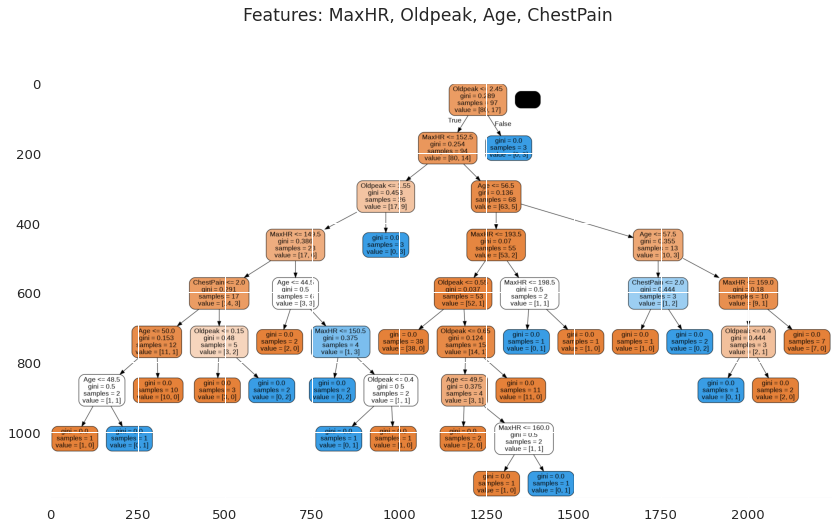

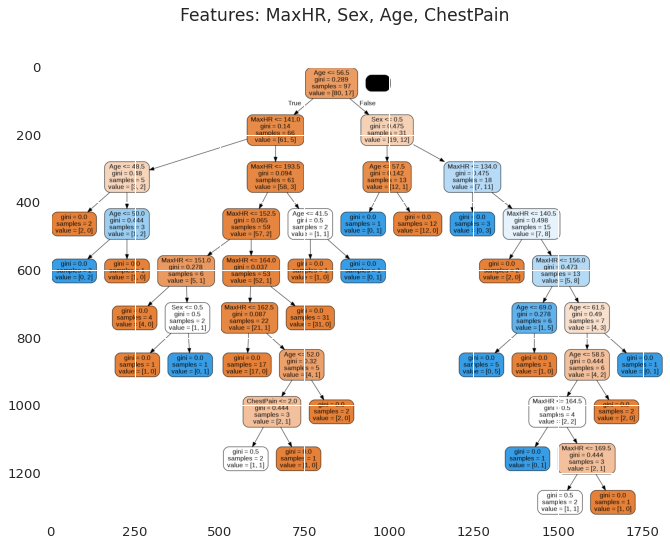

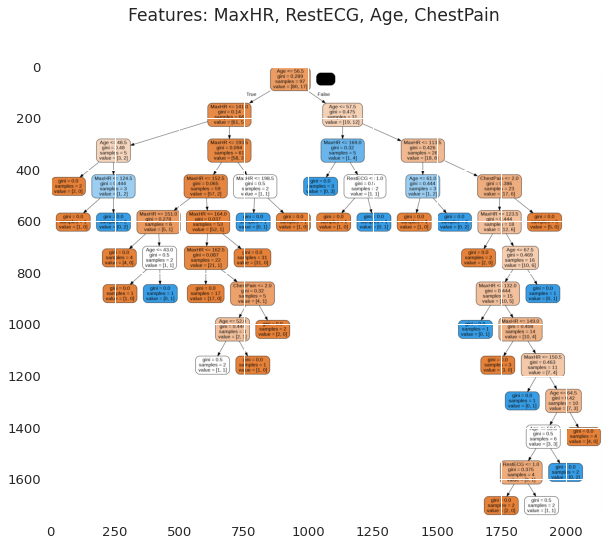

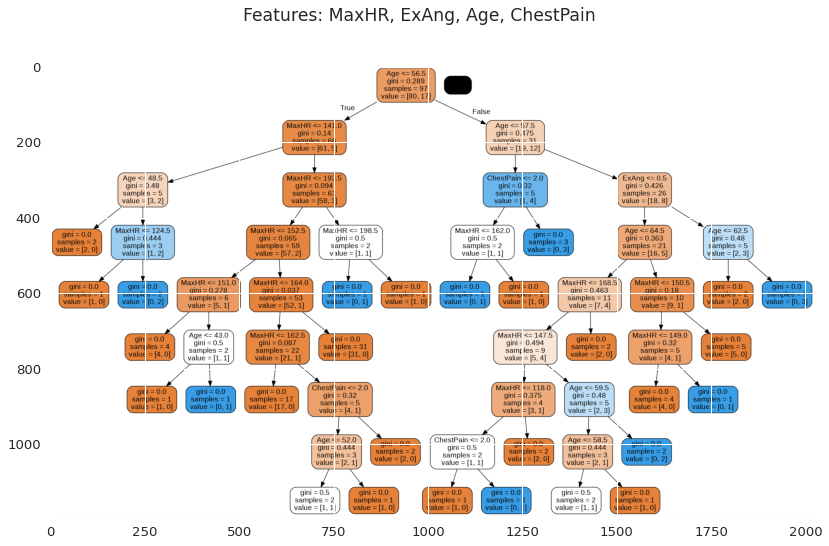

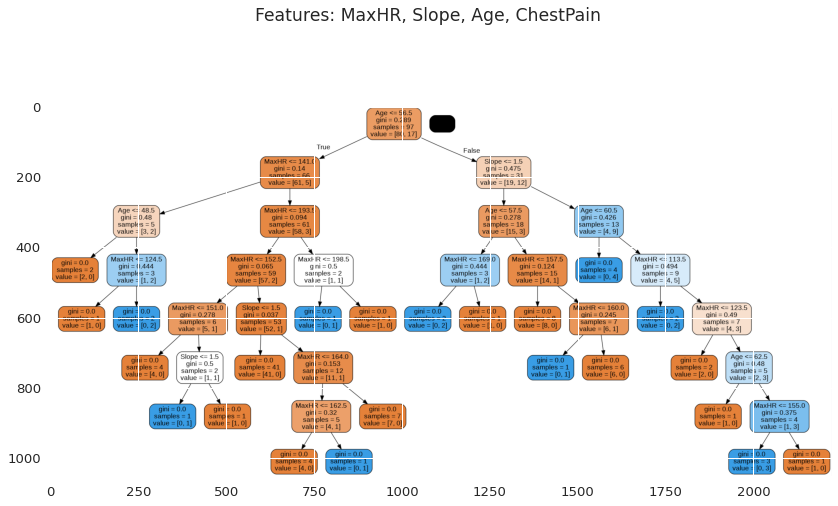

...

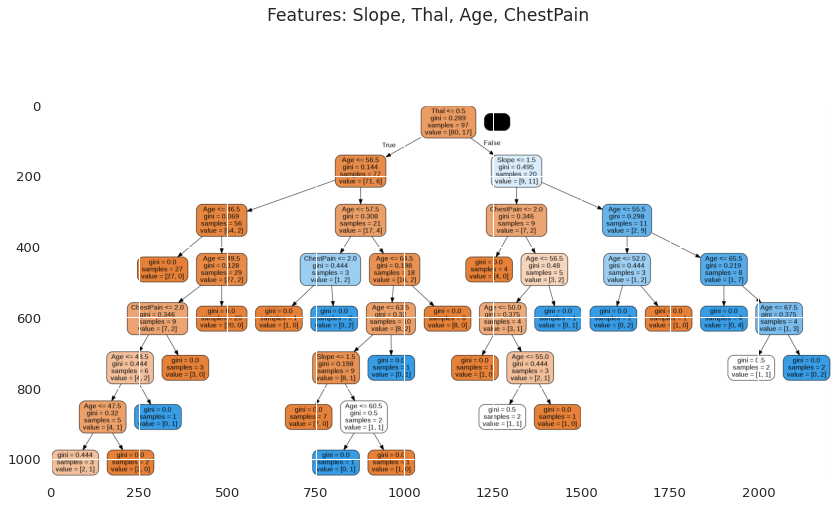

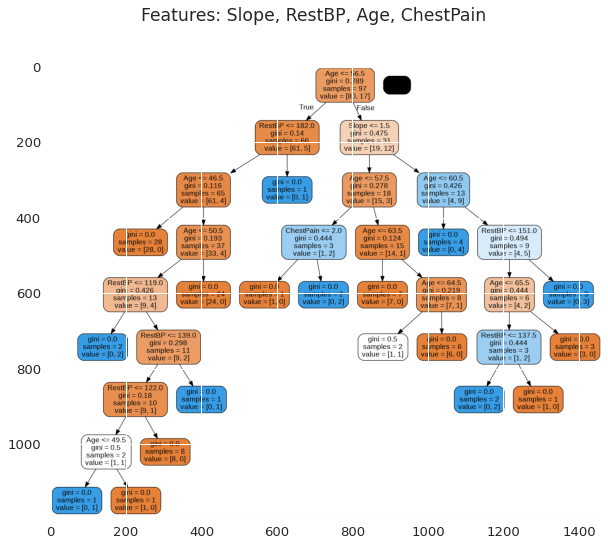

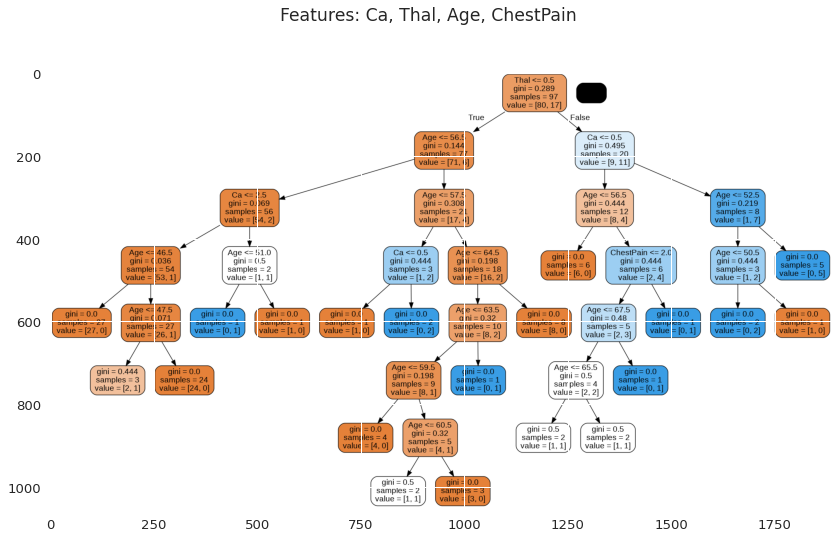

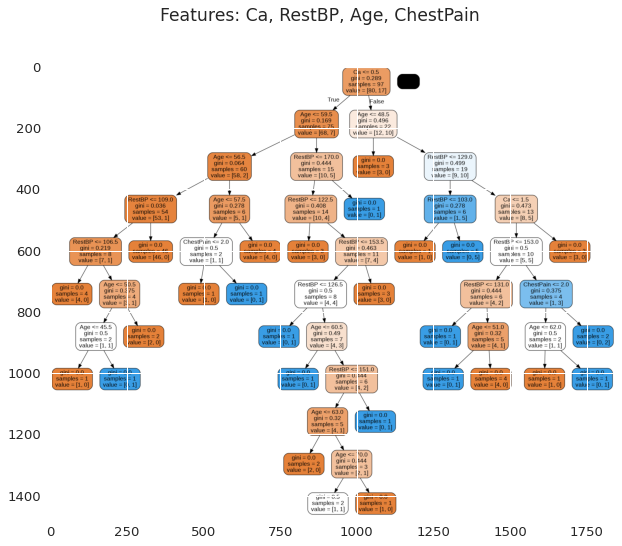

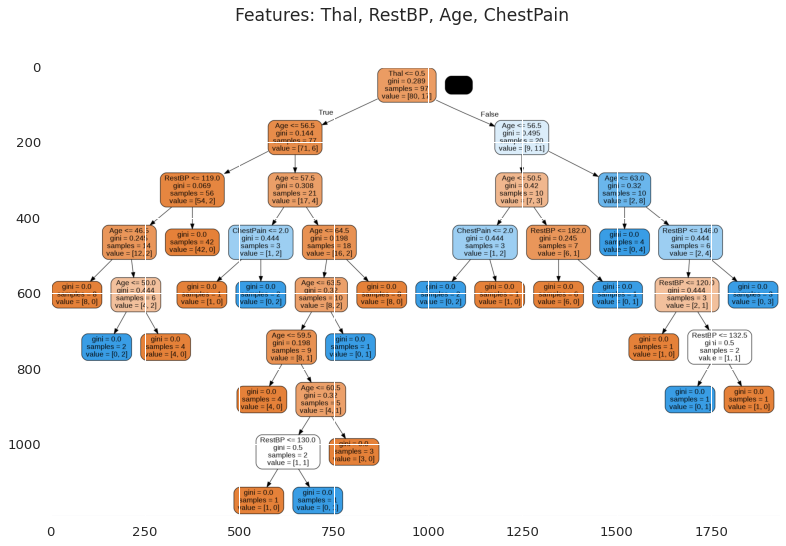

In [ ]:
bannerfeatures = ""
combination_list = ("MaxHR", "Oldpeak", "Sex", "RestECG", "ExAng", "Slope", "Ca", "Thal","RestBP")
combination_list_sorted = list(itertools.combinations(combination_list, 2))
for three_set in combination_list_sorted:
  featureList = list(three_set + ("Age", "ChestPain"))
  X = dfML_train[featureList]
  y = dfML_train['AHD'] 
  dtree = DecisionTreeClassifier()
  dtree = dtree.fit(X, y)
  data = tree.export_graphviz(dtree, out_file=None, feature_names=featureList,filled=True,rounded=True)
  graph = pydotplus.graph_from_dot_data(data)
  graph.write_png('mydecisiontree.png')
  img=pltimg.imread('mydecisiontree.png')
  imgplot = plt.imshow(img)
  for x in range(len(featureList)-1):
    feature = str(featureList[x])
    bannerfeatures = bannerfeatures + feature + ", "
  bannerfeatures = bannerfeatures + featureList[-1]
  

  plt.suptitle("Features: " + bannerfeatures)
  plt.show()
  bannerfeatures = ""


*   From the created decision trees, we decided to use this feature list of ["MaxHR", "RestBP", "Age", "ChestPain"].

*   This feature list outperforms the other groupings in terms of the decision tree accuracy scores, which is around ~97% in our case.

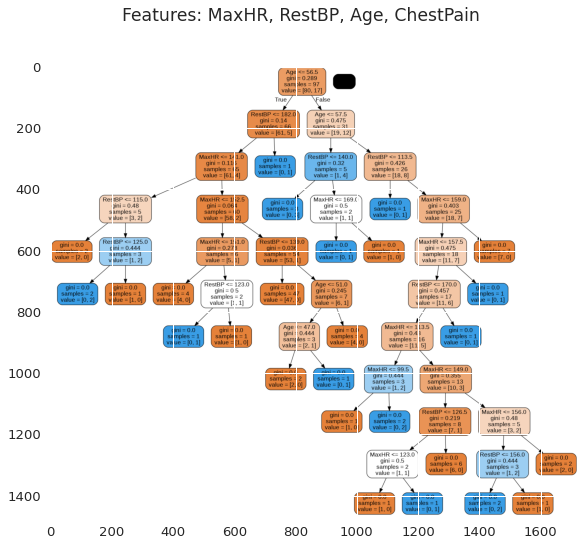

In [ ]:
bannerfeatures = ""
featureList1 = ["MaxHR", "RestBP", "Age", "ChestPain"]
x = dfML_train[featureList1]
y = dfML_train['AHD'] 
dtree_proj = DecisionTreeClassifier()
dtree_proj = dtree_proj.fit(x, y)
data = tree.export_graphviz(dtree_proj , out_file=None, feature_names=featureList1,filled=True,rounded=True)
graph = pydotplus.graph_from_dot_data(data)
graph.write_png('mydecisiontree.png')
img=pltimg.imread('mydecisiontree.png')
imgplot = plt.imshow(img)
for i in range(len(featureList1)-1):
  feature = str(featureList1[i])
  bannerfeatures = bannerfeatures + feature + ", "
bannerfeatures = bannerfeatures + featureList1[-1]
plt.suptitle("Features: " + bannerfeatures)
plt.show()
projScore = dtree_proj.score(x, y)*100

*   Below is the decision tree model of the project benchmark feature list, ["Sex", "RestBP", "Age", "ChestPain"].

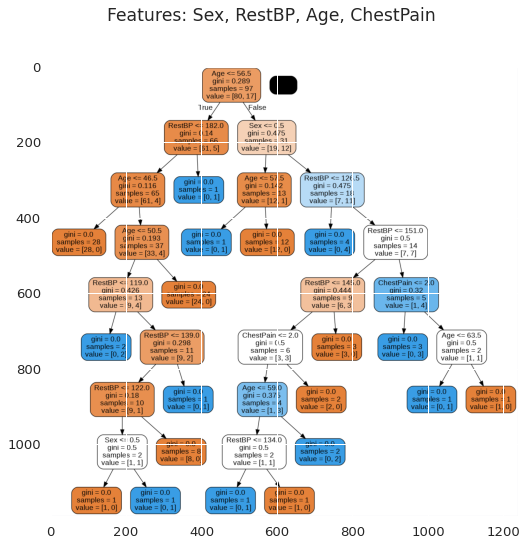

In [ ]:
bannerfeatures = ""
featureList2 = ["Sex", "RestBP", "Age", "ChestPain"]
x2 = dfML_train[featureList2]
y2 = dfML_train['AHD'] 
dtree_original = DecisionTreeClassifier()
dtree_original = dtree_original.fit(x2, y2)
data = tree.export_graphviz(dtree_original, out_file=None, feature_names=featureList2,filled=True,rounded=True)
graph = pydotplus.graph_from_dot_data(data)
graph.write_png('mydecisiontree.png')
img=pltimg.imread('mydecisiontree.png')
imgplot = plt.imshow(img)
for i in range(len(featureList2)-1):
  feature = str(featureList2[i])
  bannerfeatures = bannerfeatures + feature + ", "
bannerfeatures = bannerfeatures + featureList2[-1]

plt.suptitle("Features: " + bannerfeatures)
plt.show()
originalScore = dtree_original.score(x2, y2)*100

*   For the testing of the model for the selected feature lists, we used the remaining & excluded 20% dataset part.

*   Complying with the widely accepted Training / Testing methods, this 20% was solely used in this part. The remaning 80% of the dataset did not train on any of this randomly selected data.

*   Both trees yielded "too accurate" prediction outcomes from our testing dataset, which points out an overfit.  

<h4>*   Therefore, we decided to proceed with a new Machine Learning Model, namely Logistic Regression in the second part.</h4>



In [ ]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    #We used de statistical analysis part to add ChestPain as a main feature becasue our second data set demonstrate strong corelation with that feature
    projSum = 0
    originalSum = 0
    i= 0
    for i in range(20):
      dfML_testing_sample=dfML_testing.sample(1)
      data=np.asarray(dfML_testing_sample)
      new_data=data.reshape(1,-1)
      maxhr = new_data[0][7]
      oldpeak= new_data[0][9]
      ca = new_data[0][11]
      age = new_data[0][0]
      chestpain = new_data[0][2]
      sex = new_data[0][1]
      restbp = new_data[0][3]
      projSum += dtree_proj.predict([[maxhr,restbp,age,chestpain]])
      originalSum += dtree_original.predict([[sex,restbp,age,chestpain]])
    print(f"Tree1 Score [maxHR, RestBP, Age, Chestpain]: {projScore}")
    print(f"Heart Attack Positive Prediction Total Number: {projSum} Heart Attack Negative Prediction Total Number: {60-projSum}")
    print(f"Tree2 Score [Sex, RestBP, Age, Chestpain]: {originalScore}")
    print(f"Heart Attack Positive Prediction Total Number: {originalSum} Heart Attack Negative Prediction Total Number: {60-originalSum}")


Tree1 Score [maxHR, RestBP, Age, Chestpain]: 100.0

Heart Attack Positive Prediction Total Number: [4] Heart Attack Negative Prediction Total Number: [56]

Tree2 Score [Sex, RestBP, Age, Chestpain]: 100.0

Heart Attack Positive Prediction Total Number: [3] Heart Attack Negative Prediction Total Number: [57]


## Part 3.2 - Logistic Regression

*   As an alternative to Decision Trees, Logistic Regression has been marked as a viable alternative since the project works with Disease related symptoms which are assumed to be independant in the statistical tests, but in reality they are most likely to have some dependance between them.

*   Logistic Regression models deal with dependencies between parameters relatively well and this could aid our project to improve the overfitting issue.

*   We used the same feature lists for both benchmark and project findings so that their prediction capabilities can be better compared than it could be with the Decision Tree Models.





---

Below are the Logistic Regression findings for the project selected feature list.

Accuracy Score of 0.55 is observed.

acc score= 0.8350515463917526

acc score= 0.55


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:



Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.




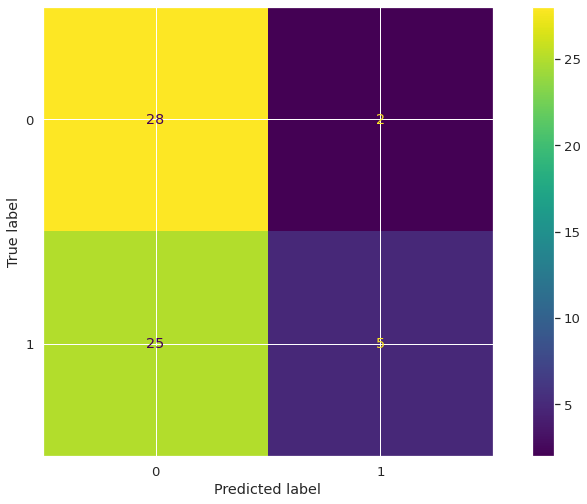

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:



Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.




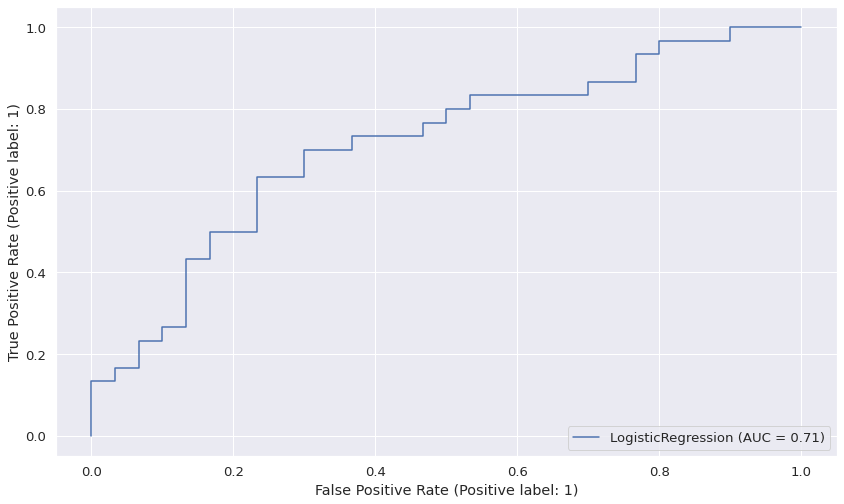

              precision    recall  f1-score   support



           0       0.93      0.53      0.67        53

           1       0.17      0.71      0.27         7



    accuracy                           0.55        60

   macro avg       0.55      0.62      0.47        60

weighted avg       0.84      0.55      0.63        60




In [ ]:

featureList_logistic1 = ["MaxHR", "RestBP", "Age", "ChestPain"]
X_train = dfML_train_logistic[featureList_logistic1]
y_train = dfML_train_logistic['AHD']

X_test = dfML_testing_logistic[featureList_logistic1]
y_test = dfML_testing_logistic['AHD']

model_proj=LogisticRegression(solver='liblinear')
model_proj.fit(X_train,y_train)

X1_train_predict=model_proj.predict(X_train)
training_data_acc=accuracy_score(X1_train_predict,y)
print('acc score=',training_data_acc)

X_test_predict=model_proj.predict(X_test)
training_data_acc_proj=accuracy_score(X_test_predict,y_test)
print('acc score=',training_data_acc_proj)

plot_confusion_matrix(model_proj, X_test, y_test)  
plt.show()

plot_roc_curve(model_proj, X_test, y_test) 
plt.show()

print(classification_report(X_test_predict,y_test))


---

Below are the Logistic Regression findings for the project benchmark feature list.

Accuracy Score of 0.5 is observed.

acc score= 0.8144329896907216

acc score= 0.5


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:



Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.




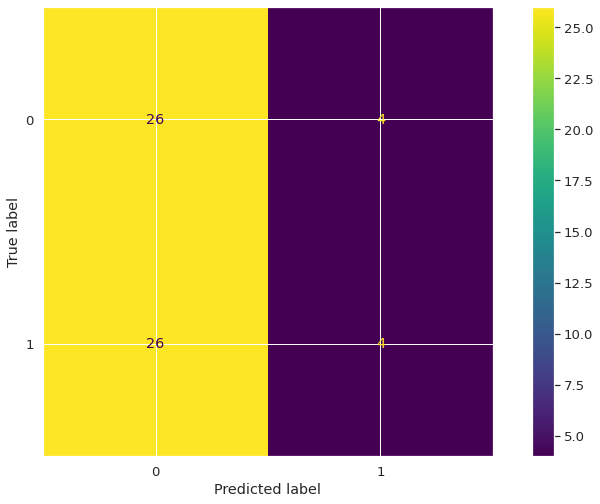

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:



Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.




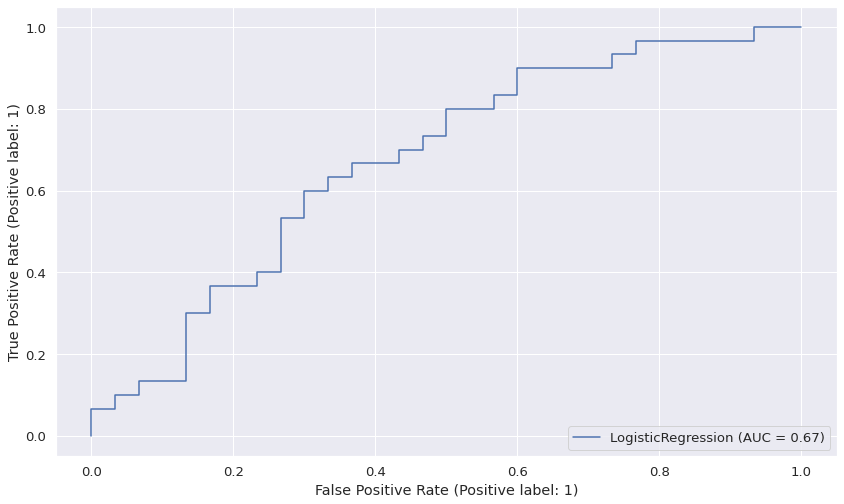

              precision    recall  f1-score   support



           0       0.87      0.50      0.63        52

           1       0.13      0.50      0.21         8



    accuracy                           0.50        60

   macro avg       0.50      0.50      0.42        60

weighted avg       0.77      0.50      0.58        60




In [ ]:
featureList_logistic2 = ["Sex", "RestBP", "Age", "ChestPain"]
X_train = dfML_train_logistic[featureList_logistic2]
y_train = dfML_train_logistic['AHD']

X_test = dfML_testing_logistic[featureList_logistic2]
y_test = dfML_testing_logistic['AHD']

model_original=LogisticRegression(solver='liblinear')
model_original.fit(X_train,y_train)

X1_train_predict=model_original.predict(X_train)
training_data_acc=accuracy_score(X1_train_predict,y)
print('acc score=',training_data_acc)

X_test_predict=model_original.predict(X_test)
testing_data_acc_original=accuracy_score(X_test_predict,y_test)
print('acc score=',testing_data_acc_original)

plot_confusion_matrix(model_original, X_test, y_test)  
plt.show()

plot_roc_curve(model_original, X_test, y_test) 
plt.show()

print(classification_report(X_test_predict,y_test))

*   After the comparison of accuracies, stated by the Logistic Regression scores, the project finding feature list outperformed the project benchmark feature list.

In [ ]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    projSum = 0
    originalSum = 0
    i= 0
    for i in range(20):
      dfML_testing_sample=dfML_testing.sample(1)
      data=np.asarray(dfML_testing_sample)
      new_data=data.reshape(1,-1)
      maxhr = new_data[0][7]
      oldpeak= new_data[0][9]
      ca = new_data[0][11]
      age = new_data[0][0]
      chestpain = new_data[0][2]
      sex = new_data[0][1]
      restbp = new_data[0][3]
      projSum += model_proj.predict([[maxhr,restbp,age,chestpain]])
      originalSum += model_original.predict([[sex,restbp,age,chestpain]])
    print(f"Logistic Regression1 Score [maxHR, RestBP, Age, Chestpain]: {training_data_acc_proj*100}")
    print(f"Heart Attack Positive Prediction Total Number: {projSum} Heart Attack Negative Prediction Total Number: {60-projSum}")
    print(f"Logistic Regression2 Score [Sex, RestBP, Age, Chestpain]: {testing_data_acc_original*100}")
    print(f"Heart Attack Positive Prediction Total Number: {originalSum} Heart Attack Negative Prediction Total Number: {60-originalSum}")

Logistic Regression1 Score [maxHR, RestBP, Age, Chestpain]: 55.00000000000001

Heart Attack Positive Prediction Total Number: [6] Heart Attack Negative Prediction Total Number: [54]

Logistic Regression2 Score [Sex, RestBP, Age, Chestpain]: 50.0

Heart Attack Positive Prediction Total Number: [3] Heart Attack Negative Prediction Total Number: [57]


---


# Project Conclusion

*   The project was conducted with the ultimate goal of achieving a feature list including Heart Disease symptoms of high prediction capabilities while maintaining a low number of included parameters. This would create a Heart Disease Prediction process that is both easy to approach and sufficient to predict for teaching & testing purposes.

*   The acquisition of this feature list started with the Data Visualization of all indicators with no exclusion, so that useful connections could be pointed out in both groups of parameters and exclusively. Addition of Dataset [2] aided this process by pointing out the significance of both new and old parameters (such as Chest Pain).

* Statistical Analysis & Hypothesis Testing utilized Sample Proportion and Sample Mean distributions on every symptom included in the dataset. The data was grouped by their Categorical and Numerical qualities and were Z-tested accordingly. Although almost all symptoms yielded some level of correlation, they were further classified by smaller significance level assumptions. Therefore, the selected symptoms with high statistical correlation were reported as below.

  [age, maxHr, oldpeak, sex, RestECG(0,1,2),ExAng, slope(1,2), Ca, Thal(normal, reversible), chestPain(non-typical, non-anginal)]


* The number of symptoms to be grouped were decided as 4, complying with the benchmark group of ["Sex", "RestBP", "Age", "ChestPain"], and Machine Learning models of Decision Trees and Logistic Regression were conducted on the symptom grouping findings. Decision Trees yielded an overfit that did not point out any conclusions so the project proceeded with the Logistic Regression model.

* Finally, the Logistic Regression model handled the symptom grouping findings as expected, explained by its nature of handling parameter dependencies relatively successfully, which is assumed to be the case with disease symptom datasets.



    
---    
* Maximum Heart Rate
    
* Resting Blood Pressure
    
* Age
    
* Chest Pain
---

  are the four indicators of Heart Disease as project findings, with the highest capability of prediction in its grouping size.

  